# 1 - Data Loading

In [1]:
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
df=pd.read_csv('/content/drive/MyDrive/SLHD/diabetic_data.csv')
df.head()

Mounted at /content/drive


,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [2]:
df.describe()

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.652016e+08,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,1.026403e+08,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.252200e+04,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,8.496119e+07,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,1.523890e+08,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,2.302709e+08,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,4.438672e+08,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [4]:
# Convert float64 columns to object dtype
for col in df.select_dtypes(include=['float64']).columns:
    df[col] = df[col].astype('object')

# 2 - Data Visuzalization

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Imposta il tema grafico di default
sns.set_theme(style="whitegrid")

def analizza_feature(df, colonna, grafico=True):
    print("=" * 100)
    print(f"ANALISI DELLA FEATURE: {colonna}")
    print("=" * 100)

    serie = df[colonna]

    # Valori unici e frequenze (inclusi i NaN)
    print("\nValori unici e frequenze:")
    print(serie.value_counts(dropna=False))

    # Numero di valori unici
    print(f"\nNumero di valori unici: {serie.nunique(dropna=False)}")

    # Valori nulli
    n_nulli = serie.isnull().sum()
    perc_nulli = n_nulli / len(serie) * 100
    print(f"\nValori nulli: {n_nulli} ({perc_nulli:.2f}%)")

    if grafico:
        if pd.api.types.is_numeric_dtype(serie) and serie.nunique() > 15:
            # Variabile numerica continua
            fig, axes = plt.subplots(1, 2, figsize=(14, 5))

            sns.histplot(serie.dropna(), bins=30, kde=True, ax=axes[0])
            axes[0].set_title(f'Istogramma - {colonna}')
            axes[0].set_xlabel(colonna)
            axes[0].set_ylabel('Frequenza')

            sns.boxplot(x=serie.dropna(), ax=axes[1])
            axes[1].set_title(f'Boxplot - {colonna}')
            axes[1].set_xlabel(colonna)

            plt.tight_layout()
            plt.show()

        else:
            # Variabile categorica o numerica discreta (senza NaN)
            vc = serie.dropna().value_counts()
            plt.figure(figsize=(9, 5))
            sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")
            plt.title(f'Distribuzione - {colonna}')
            plt.xlabel("Valori")
            plt.ylabel("Frequenza")
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()

def analizza_tutto(df, grafico=True):
    for col in df.columns:
        analizza_feature(df, col, grafico=grafico)


In [6]:
#analizza_tutto(df)

In [7]:
df.describe()

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.652016e+08,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,1.026403e+08,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.252200e+04,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,8.496119e+07,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,1.523890e+08,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,2.302709e+08,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,4.438672e+08,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


ANALISI DELLA FEATURE: age

Valori unici e frequenze:
age
[70-80)     26068
[60-70)     22483
[50-60)     17256
[80-90)     17197
[40-50)      9685
[30-40)      3775
[90-100)     2793
[20-30)      1657
[10-20)       691
[0-10)        161
Name: count, dtype: int64

Numero di valori unici: 10

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


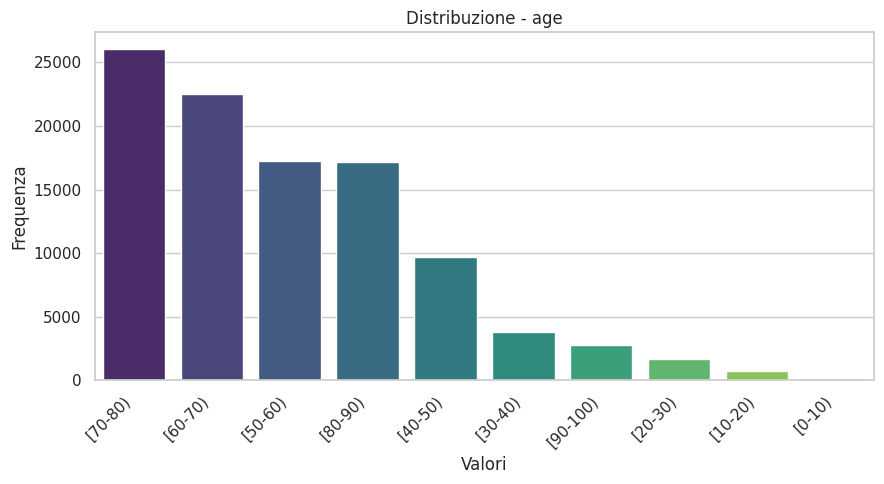

In [8]:
analizza_feature(df, 'age')

# 3 - Data Cleaning

## 3.1 - Identifying NAN and mapping categorical variables

ANALISI DELLA FEATURE: admission_type_id

Valori unici e frequenze:
admission_type_id
1.0    53990
3.0    18869
2.0    18480
NaN    10396
7.0       21
4.0       10
Name: count, dtype: int64

Numero di valori unici: 6

Valori nulli: 10396 (10.22%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


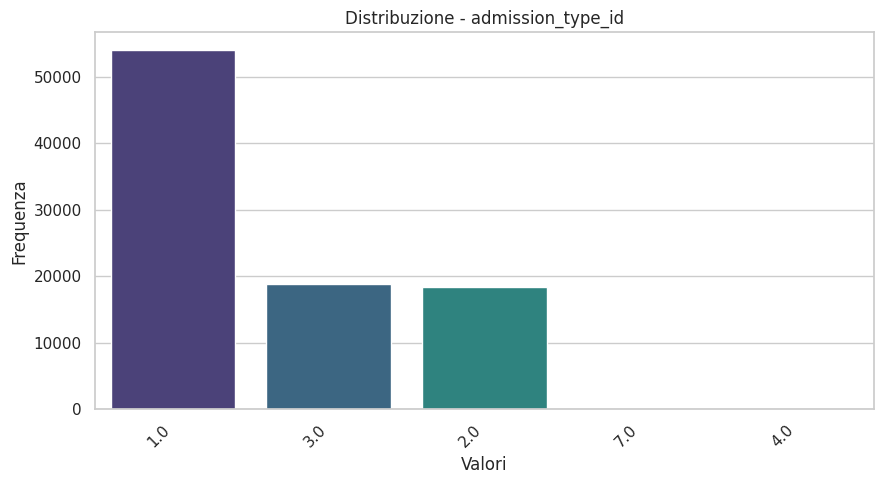

ANALISI DELLA FEATURE: admission_type

Valori unici e frequenze:
admission_type
Emergency        72491
Not Emergency    18879
NaN              10396
Name: count, dtype: int64

Numero di valori unici: 3

Valori nulli: 10396 (10.22%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


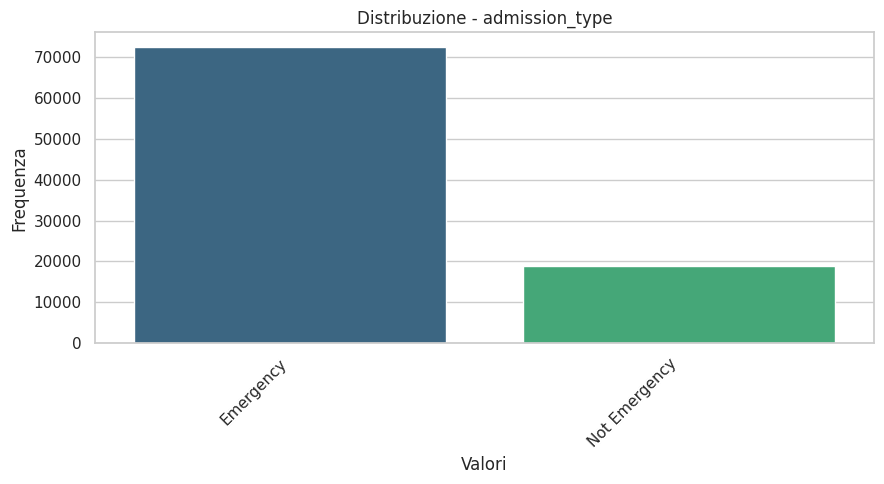

In [9]:
import numpy as np
# Substitute  '?' with NaN
df.replace('?', pd.NA, inplace=True)
#admission_type_id : 1	Emergency, 2	Urgent, 3	Elective, 4	Newborn, 5	Not Available, 6	NULL, 7	Trauma Center, 8	Not Mapped
df.loc[df['admission_type_id'].isin([5, 6, 8]), 'admission_type_id'] = np.nan

analizza_feature(df, 'admission_type_id')
df['admission_type'] = df['admission_type_id'].map({
    1: 'Emergency',
    2: 'Emergency',
    3: 'Not Emergency',
    4: 'Not Emergency',
    7: 'Emergency'
})
df.drop(columns=['admission_type_id'], inplace=True)
analizza_feature(df, 'admission_type')

**`discharge_disposition_id`**

We cleaned and grouped the `discharge_disposition_id` feature to simplify analysis and remove irrelevant outcomes.

1. Removed patients who died or were transferred to hospice:
The following codes were excluded from the dataset:
- `11` – Expired
- `13` – Hospice / home
- `14` – Hospice / medical facility
- `19` – Expired at home (Medicaid only, hospice)
- `20` – Expired in a medical facility (Medicaid only, hospice)
- `21` – Expired, place unknown (Medicaid only, hospice)

2. Replaced invalid or unmapped codes with NaN:
These codes were considered missing data:
- `18` – NULL
- `25` – Not Mapped
- `26` – Unknown/Invalid

3. Grouped remaining discharge codes into two categories:

**A. Discharged to Home**  
Includes patients sent home, with or without home care:
- `1` – Discharged to home
- `6` – Discharged to home with home health service
- `7` – Left against medical advice (AMA)
- `8` – Discharged to home under care of Home IV provider

**B. Transferred to Another Facility**  
Includes all types of transfers to other healthcare settings:
- `2` – To another short-term hospital
- `3` – To Skilled Nursing Facility (SNF)
- `4` – To Intermediate Care Facility (ICF)
- `5` – To another inpatient care institution
- `9` – Admitted as inpatient to this hospital
- `10` – Neonate to another hospital
- `12` – Still a patient / outpatient follow-up expected
- `15` – To swing bed within same institution
- `16` – To another institution for outpatient services
- `17` – To this institution for outpatient services
- `22` – To rehab facility (or rehab unit of hospital)
- `23` – To long-term care hospital
- `24` – To Medicaid-only nursing facility
- `27` – To federal health care facility
- `28` – To psychiatric hospital/unit
- `29` – To Critical Access Hospital
- `30` – To another healthcare institution not defined elsewhere

ANALISI DELLA FEATURE: discharge_disposition_id

Valori unici e frequenze:
discharge_disposition_id
1     60234
3     13954
6     12902
18     3691
2      2128
22     1993
11     1642
5      1184
25      989
4       815
7       623
23      412
13      399
14      372
28      139
8       108
15       63
24       48
9        21
17       14
16       11
19        8
10        6
27        5
12        3
20        2
Name: count, dtype: int64

Numero di valori unici: 26

Valori nulli: 0 (0.00%)


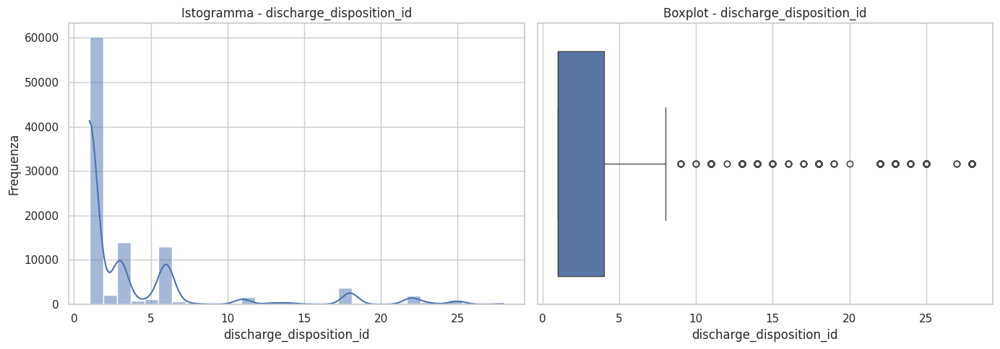

ANALISI DELLA FEATURE: discharge_disposition

Valori unici e frequenze:
discharge_disposition
Discharged to Home                 73867
Transferred to Another Facility    20796
NaN                                 4680
Name: count, dtype: int64

Numero di valori unici: 3

Valori nulli: 4680 (4.71%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


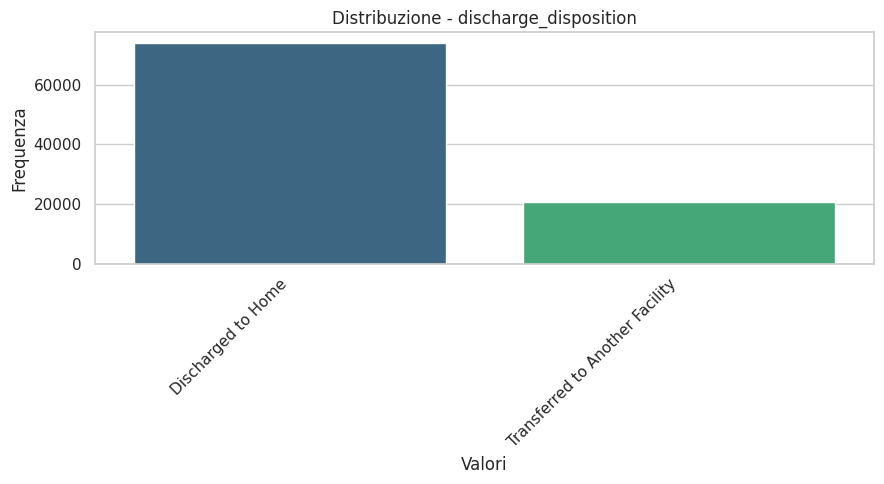

In [10]:
#We wanto to remove patient which wexpired or have been transferred to an hospice
analizza_feature(df, 'discharge_disposition_id')

discharge_disposition_to_remove = [11, 13, 14, 19, 20, 21]
df = df[~df['discharge_disposition_id'].isin(discharge_disposition_to_remove)].copy()

#We unifies the NANs
df.loc[df['discharge_disposition_id'].isin([18, 25, 26]), 'discharge_disposition_id'] = np.nan #Selected as NAN

#mapping the orher categoires
def map_discharge_category(code):
    if pd.isna(code):
        return np.nan
    elif code in [1, 6, 7, 8]:
        return 'Discharged to Home'
    elif code in [2, 3, 4, 5, 9, 10, 12, 15, 16, 17, 22, 23, 24, 27, 28, 29, 30]:
        return 'Transferred to Another Facility'


df['discharge_disposition'] = df['discharge_disposition_id'].apply(map_discharge_category)
df.drop(columns='discharge_disposition_id', inplace=True)
analizza_feature(df, 'discharge_disposition')

**`admission_source_id`**

We cleaned and grouped the `admission_source_id` variable to reduce complexity and handle missing or less-informative categories.

1. Replaced invalid or missing values with NaN:
The following codes were treated as missing data:
- `9` – Not Available  
- `15` – Not Available  
- `17` – NULL  
- `20` – Not Mapped  
- `21` – Unknown/Invalid  

These were replaced with `NaN` for consistency in downstream analysis.

2. Grouped valid codes into four main categories:

**A. Emergency**  
- `7` – Emergency Room

**B. Referral**  
- `1` – Physician Referral  
- `2` – Clinic Referral  
- `3` – HMO Referral

**C. Transferred**  
- `4` – Transfer from a hospital  
- `5` – Transfer from a Skilled Nursing Facility (SNF)  
- `6` – Transfer from another health care facility  
- `10` – Transfer from critical access hospital  
- `18` – Transfer from another Home Health Agency  
- `19` – Readmission to same Home Health Agency  
- `22` – Transfer from hospital inpatient/same facility, separate claim  
- `25` – Transfer from Ambulatory Surgery Center  
- `26` – Transfer from Hospice

**D. Other**  
All other codes were grouped under "Other" as they refer to specific cases such as deliveries or births:
- `8` – Court/Law Enforcement  
- `11` – Normal Delivery  
- `12` – Premature Delivery  
- `13` – Sick Baby  
- `14` – Extramural Birth  
- `23` – Born inside this hospital  
- `24` – Born outside this hospital



ANALISI DELLA FEATURE: admission_source

Valori unici e frequenze:
admission_source
Emergency     55850
Referral      30434
NaN            6854
Transfered     6185
Other            20
Name: count, dtype: int64

Numero di valori unici: 5

Valori nulli: 6854 (6.90%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


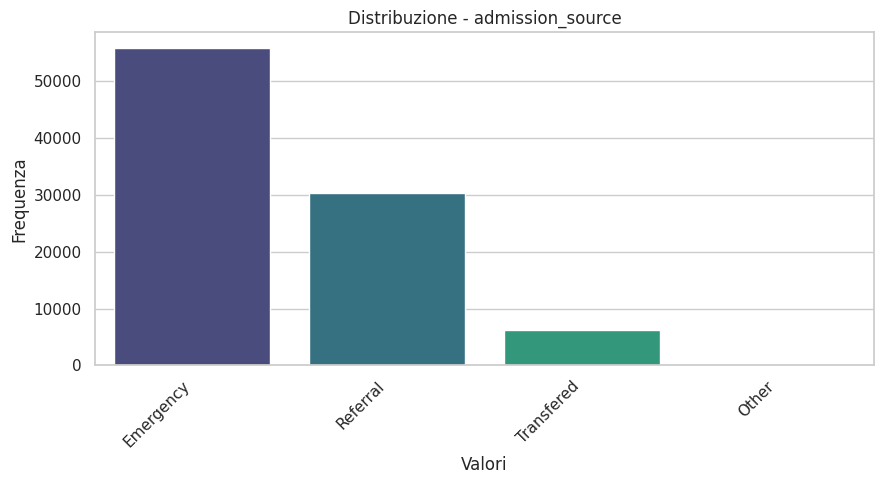

In [11]:
df.loc[df['admission_source_id'].isin([9, 15, 17, 20, 21]), 'admission_source_id'] = np.nan

def map_admission_source(code):
    if pd.isna(code):
        return np.nan
    elif code == 7:
        return 'Emergency'
    elif code in [1, 2, 3]:
        return 'Referral'
    elif code in [4, 5, 6, 10, 18, 19, 22, 25, 26]:
        return 'Transfered'
    else:
        return 'Other'

df['admission_source'] = df['admission_source_id'].apply(map_admission_source)
df.drop(columns='admission_source_id', inplace=True)
analizza_feature(df, 'admission_source')

**`gender`, `race` and `age`**

ANALISI DELLA FEATURE: gender

Valori unici e frequenze:
gender
Female    53454
Male      45886
NaN           3
Name: count, dtype: int64

Numero di valori unici: 3

Valori nulli: 3 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


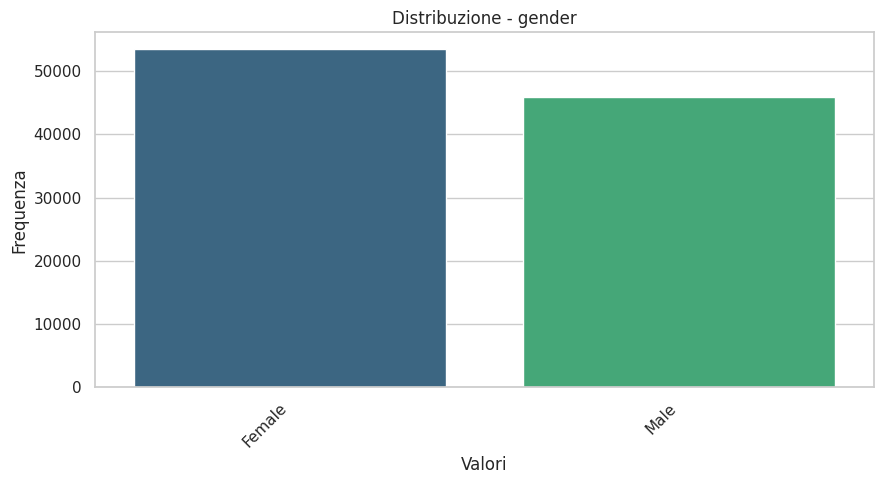

In [12]:
df.loc[df['gender'] == 'Unknown/Invalid', 'gender'] = np.nan
analizza_feature(df, 'gender')

ANALISI DELLA FEATURE: race

Valori unici e frequenze:
race
Caucasian           74220
African American    18772
Other                4117
NaN                  2234
Name: count, dtype: int64

Numero di valori unici: 4

Valori nulli: 2234 (2.25%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


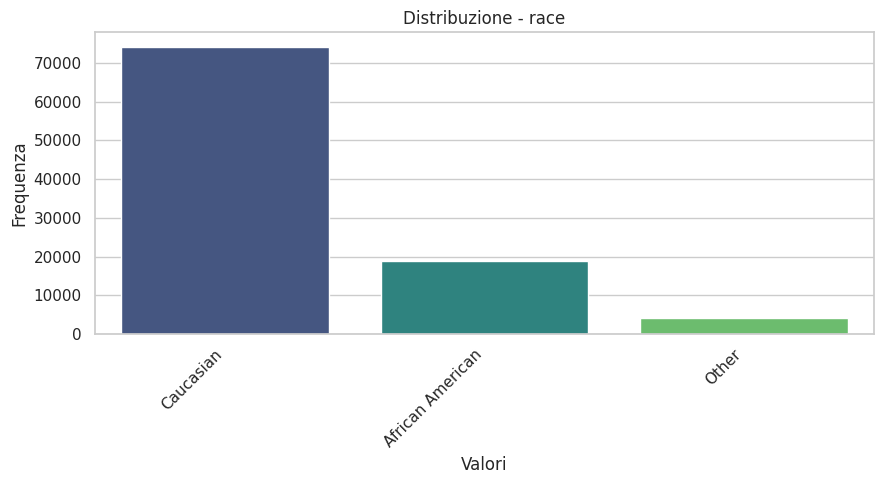

In [13]:
# Create a mapping for race categories
race_mapping = {
    'Caucasian': 'Caucasian',
    'AfricanAmerican': 'African American',
    'Asian': 'Other',
    'Hispanic': 'Other',
    'Other': 'Other'
}

# Apply the mapping to the 'race' column
df['race'] = df['race'].map(race_mapping)
analizza_feature(df, 'race')

<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


ANALISI DELLA FEATURE: age

Valori unici e frequenze:
age
[70-80)    25331
[60-70)    22059
O80        19023
[50-60)    17060
U50        15870
Name: count, dtype: int64

Numero di valori unici: 5

Valori nulli: 0 (0.00%)


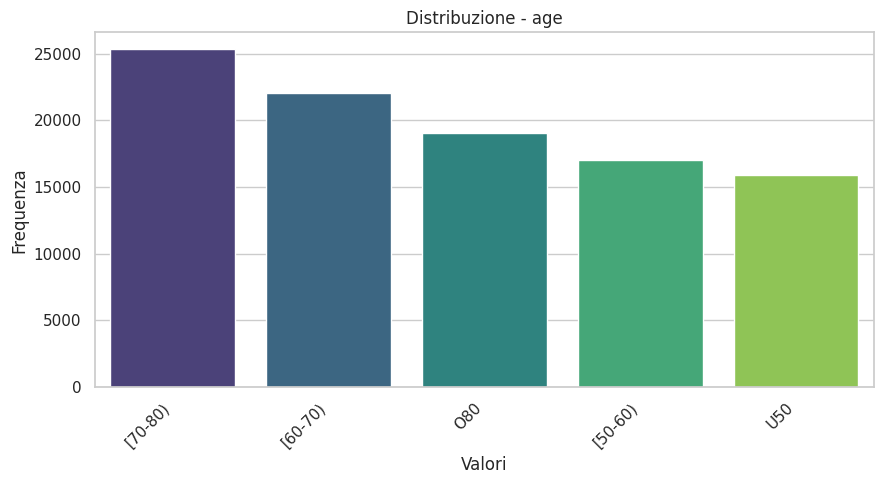

In [14]:
# Create a mapping for age groups
age_mapping = {
    '[0-10)': 'U50',
    '[10-20)': 'U50',
    '[20-30)': 'U50',
    '[30-40)': 'U50',
    '[40-50)': 'U50',
    '[50-60)': '[50-60)',
    '[60-70)': '[60-70)',
    '[70-80)': '[70-80)',
    '[80-90)': 'O80',
    '[90-100)': 'O80'
}

# Apply the mapping to the 'age' column
df['age'] = df['age'].map(age_mapping)
analizza_feature(df, 'age')

**Medications**

ANALISI DELLA FEATURE: metformin

Valori unici e frequenze:
metformin
No     79499
Yes    19844
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


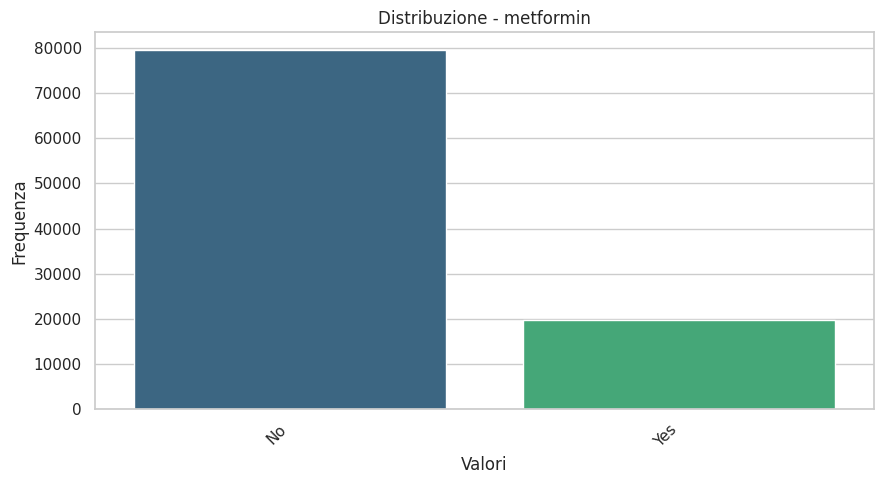

<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


ANALISI DELLA FEATURE: repaglinide

Valori unici e frequenze:
repaglinide
No     97825
Yes     1518
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


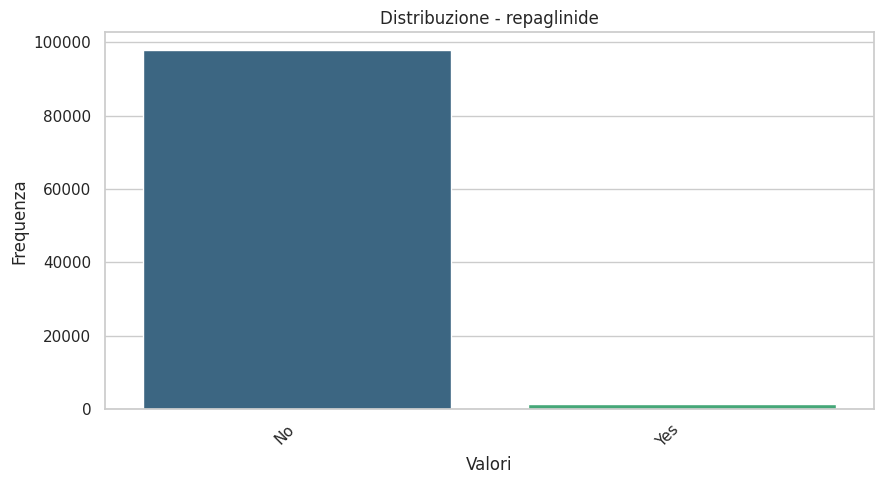

ANALISI DELLA FEATURE: nateglinide

Valori unici e frequenze:
nateglinide
No     98654
Yes      689
Name: count, dtype: int64

Numero di valori unici: 2


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")



Valori nulli: 0 (0.00%)


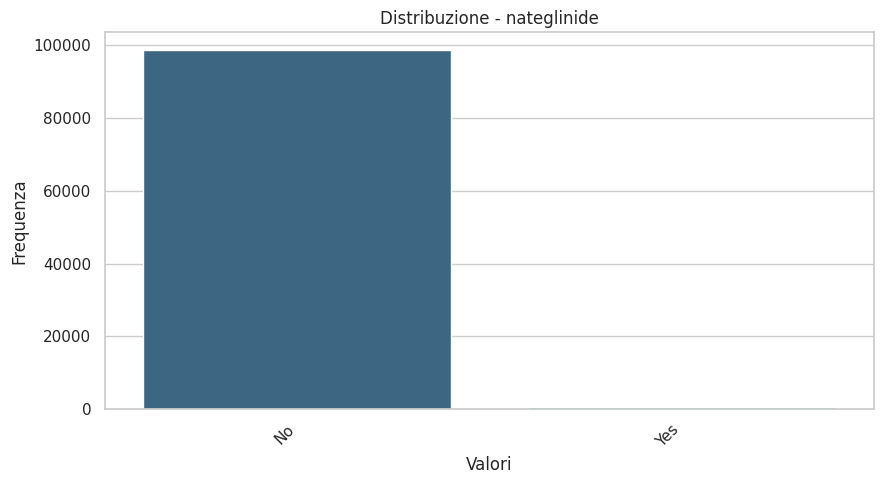

ANALISI DELLA FEATURE: chlorpropamide

Valori unici e frequenze:
chlorpropamide
No     99258
Yes       85
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


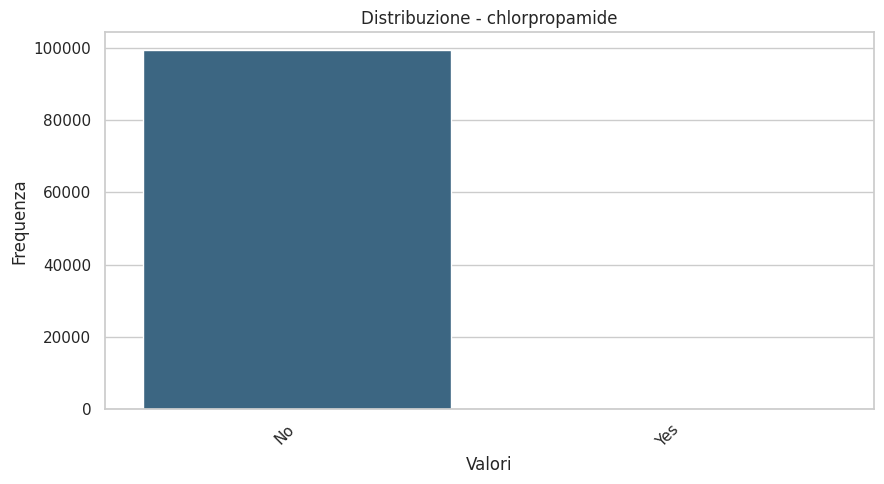

ANALISI DELLA FEATURE: glimepiride

Valori unici e frequenze:
glimepiride
No     94221
Yes     5122
Name: count, dtype: int64


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")



Numero di valori unici: 2

Valori nulli: 0 (0.00%)


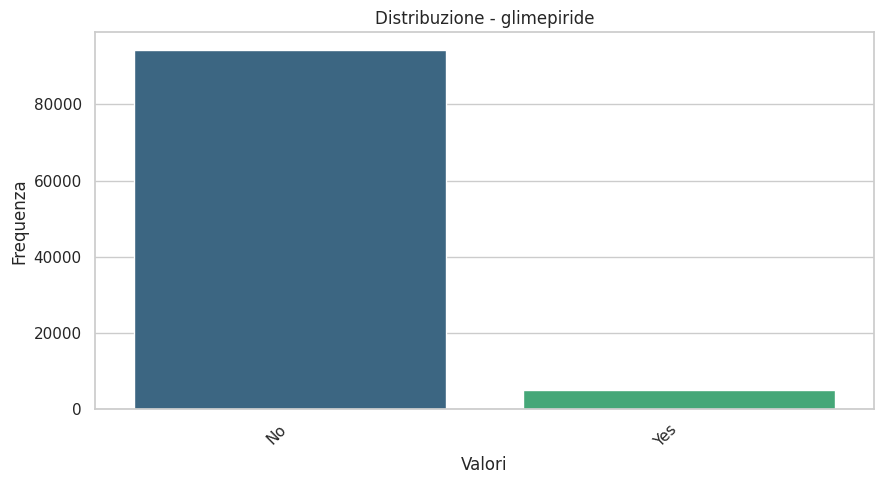

ANALISI DELLA FEATURE: acetohexamide

Valori unici e frequenze:
acetohexamide
No     99342
Yes        1
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


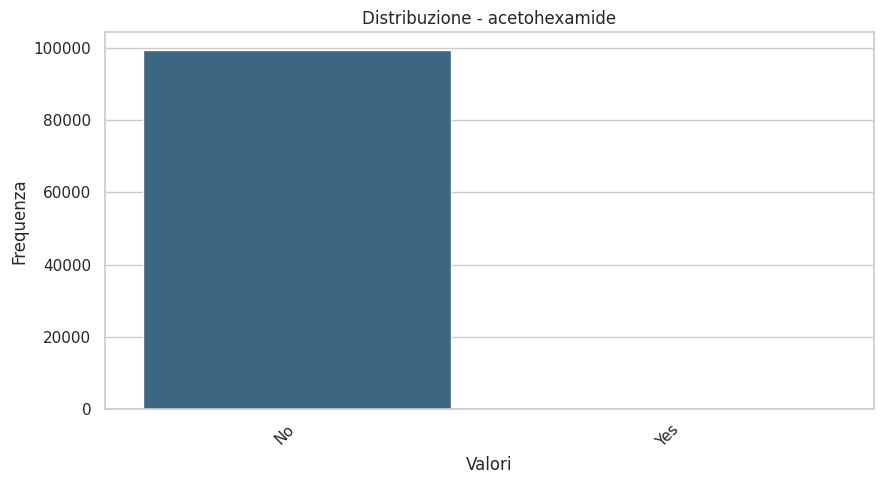

ANALISI DELLA FEATURE: glipizide

Valori unici e frequenze:
glipizide
No     86812
Yes    12531
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


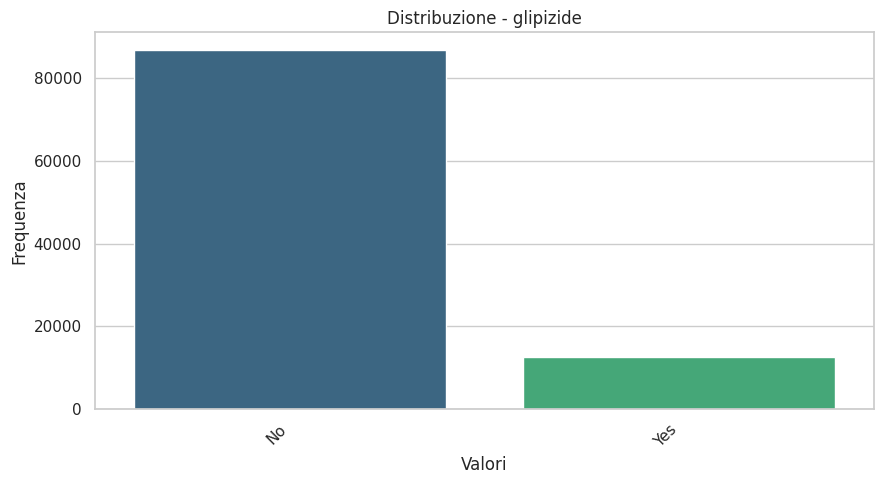

ANALISI DELLA FEATURE: glyburide

Valori unici e frequenze:
glyburide
No     88820
Yes    10523
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


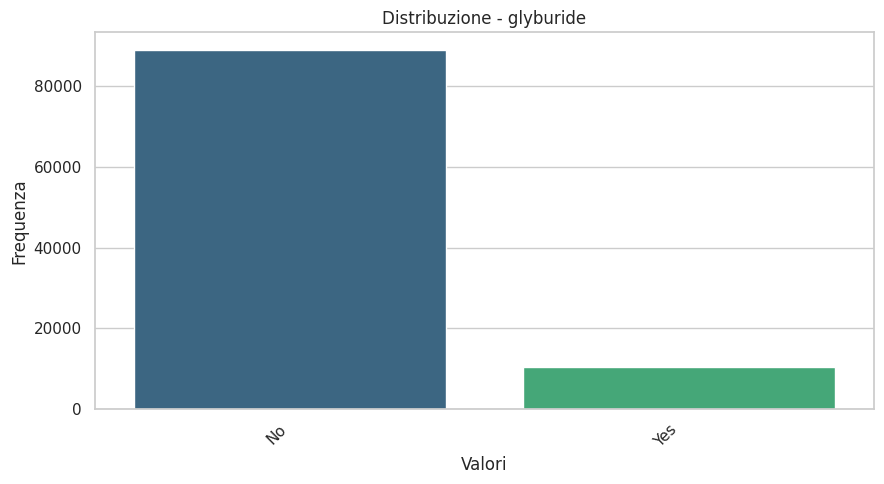

ANALISI DELLA FEATURE: tolbutamide

Valori unici e frequenze:
tolbutamide
No     99322
Yes       21
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


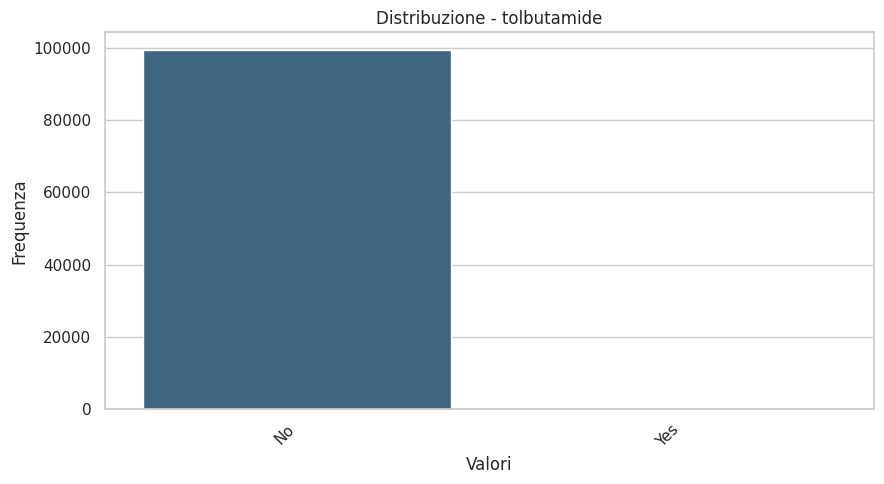

<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


ANALISI DELLA FEATURE: pioglitazone

Valori unici e frequenze:
pioglitazone
No     92088
Yes     7255
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


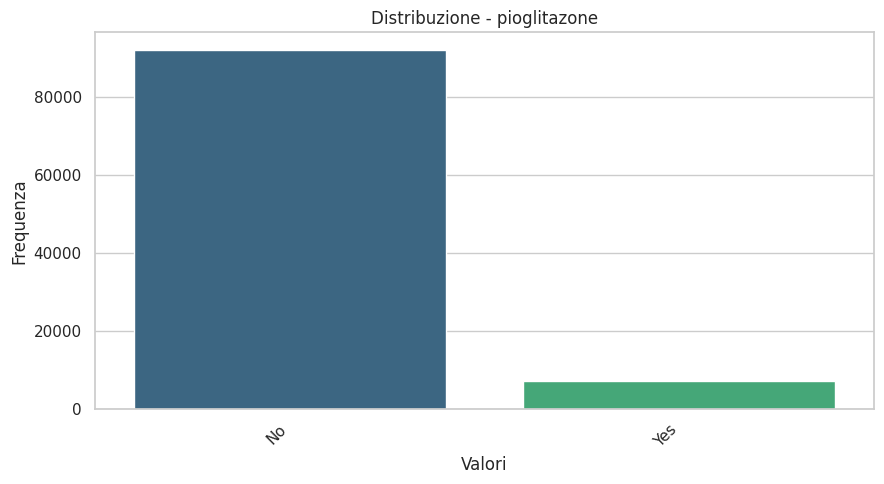

ANALISI DELLA FEATURE: rosiglitazone

Valori unici e frequenze:
rosiglitazone
No     93039
Yes     6304
Name: count, dtype: int64

Numero di valori unici: 2


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")



Valori nulli: 0 (0.00%)


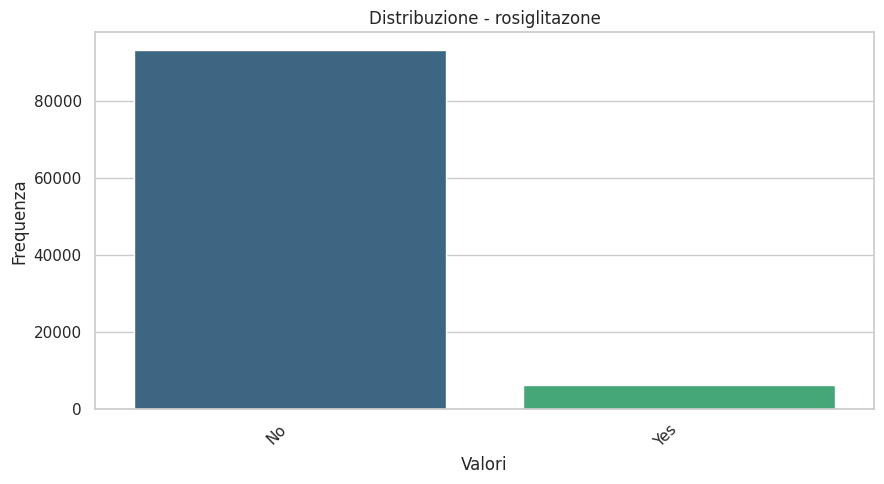

ANALISI DELLA FEATURE: acarbose

Valori unici e frequenze:
acarbose
No     99038
Yes      305
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


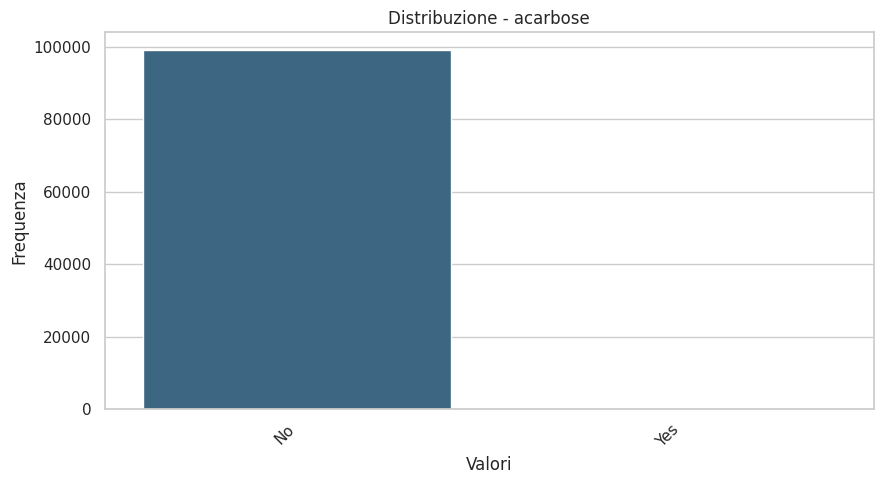

ANALISI DELLA FEATURE: miglitol

Valori unici e frequenze:
miglitol
No     99305
Yes       38
Name: count, dtype: int64


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")



Numero di valori unici: 2

Valori nulli: 0 (0.00%)


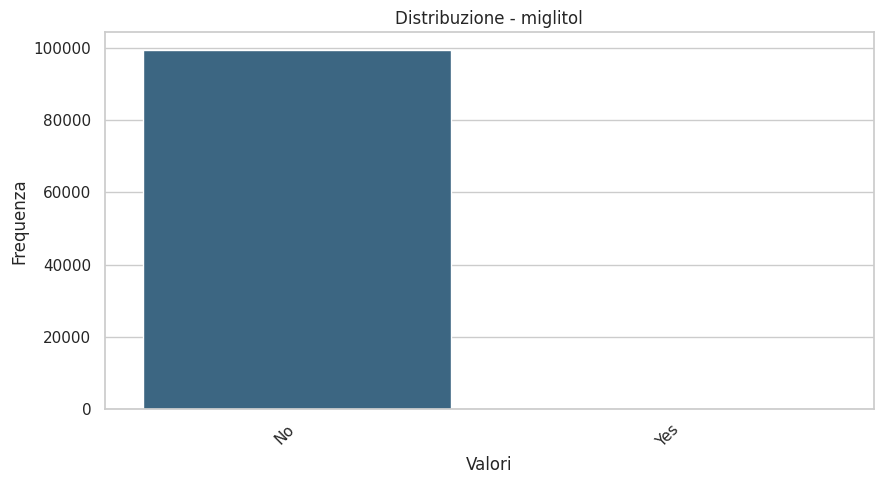

ANALISI DELLA FEATURE: troglitazone

Valori unici e frequenze:
troglitazone
No     99340
Yes        3
Name: count, dtype: int64

Numero di valori unici: 2


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")



Valori nulli: 0 (0.00%)


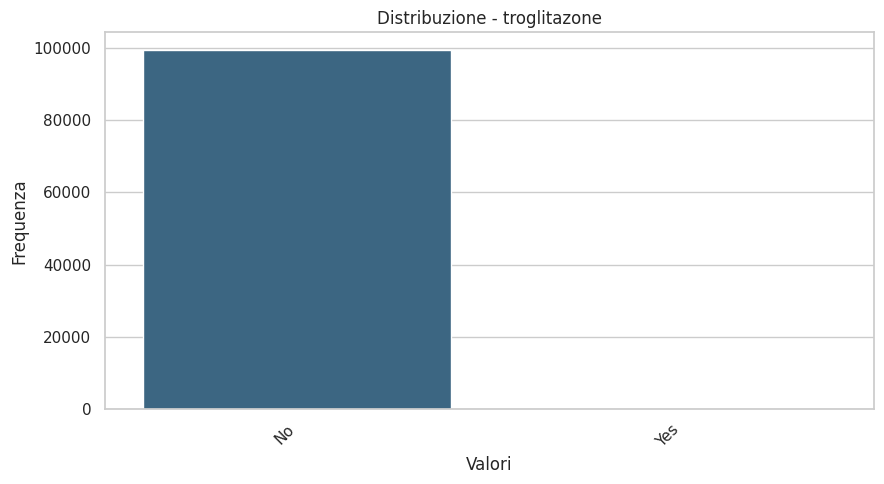

ANALISI DELLA FEATURE: tolazamide

Valori unici e frequenze:
tolazamide
No     99304
Yes       39
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


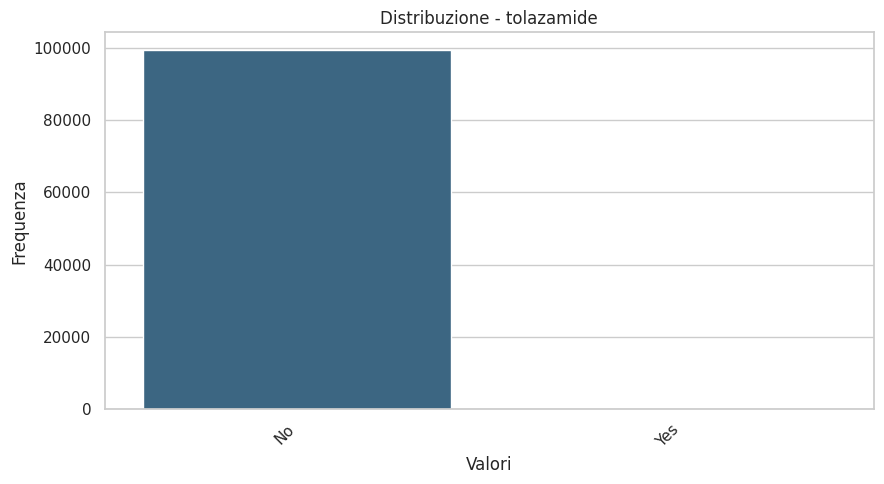

ANALISI DELLA FEATURE: examide

Valori unici e frequenze:
examide
No    99343
Name: count, dtype: int64

Numero di valori unici: 1


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")



Valori nulli: 0 (0.00%)


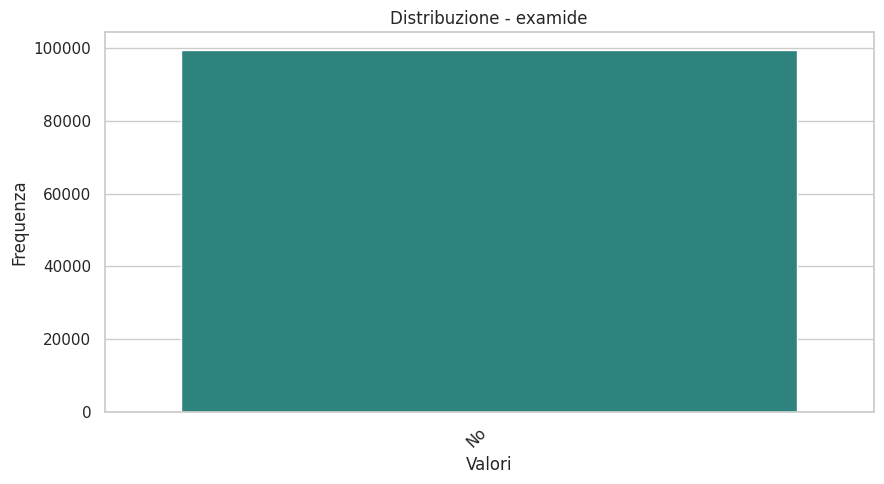

ANALISI DELLA FEATURE: citoglipton

Valori unici e frequenze:
citoglipton
No    99343
Name: count, dtype: int64

Numero di valori unici: 1

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


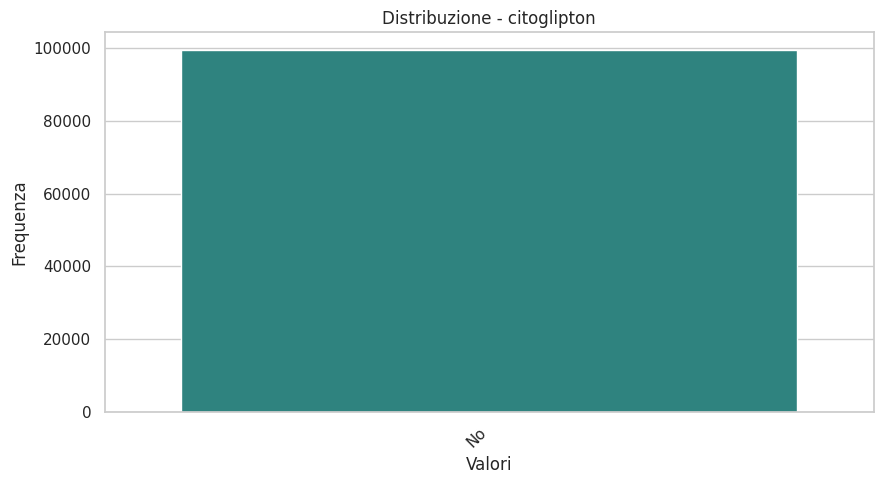

ANALISI DELLA FEATURE: insulin

Valori unici e frequenze:
insulin
Yes    52964
No     46379
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


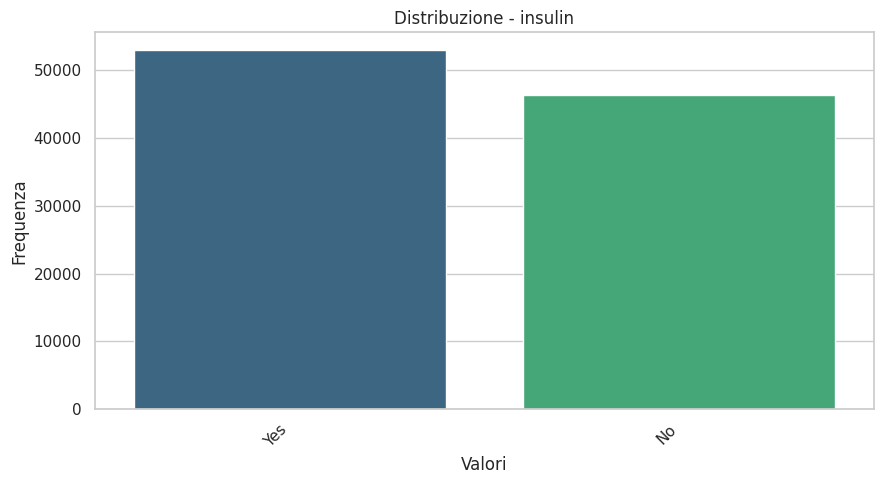

ANALISI DELLA FEATURE: glyburide-metformin

Valori unici e frequenze:
glyburide-metformin
No     98645
Yes      698
Name: count, dtype: int64

Numero di valori unici: 2


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")



Valori nulli: 0 (0.00%)


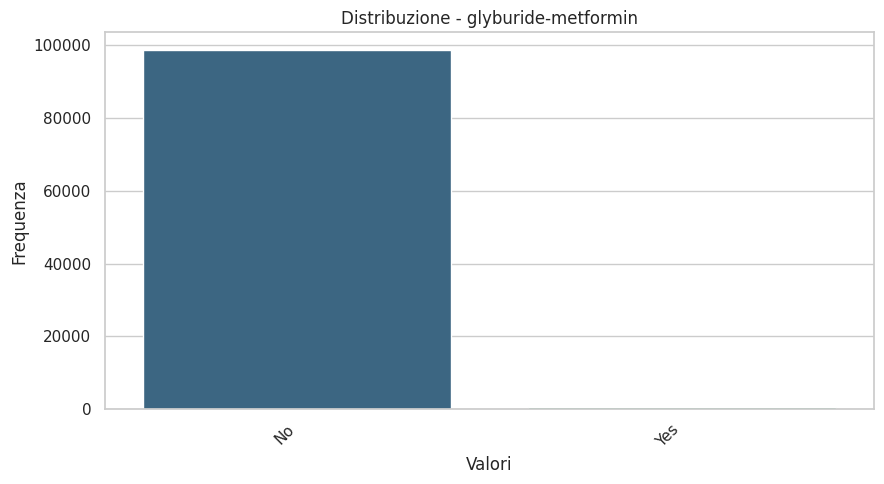

ANALISI DELLA FEATURE: glipizide-metformin

Valori unici e frequenze:
glipizide-metformin
No     99330
Yes       13
Name: count, dtype: int64

Numero di valori unici: 2


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")



Valori nulli: 0 (0.00%)


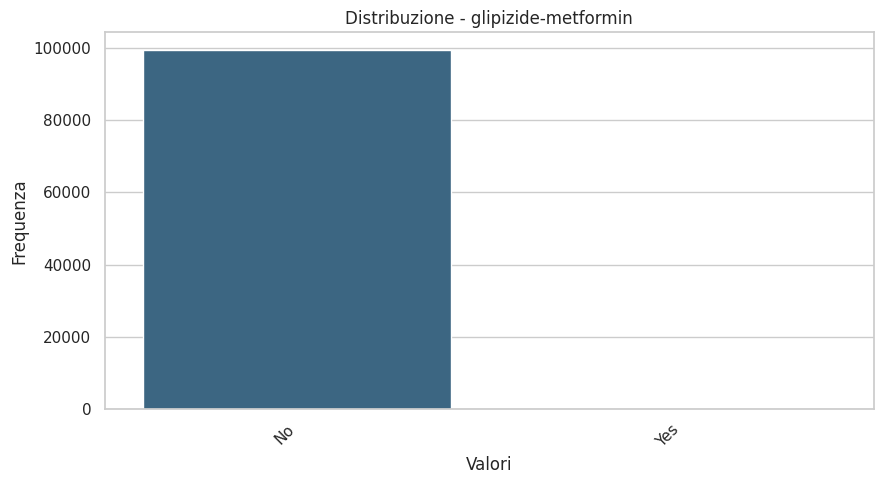

ANALISI DELLA FEATURE: glimepiride-pioglitazone

Valori unici e frequenze:
glimepiride-pioglitazone
No     99342
Yes        1
Name: count, dtype: int64

Numero di valori unici: 2


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")



Valori nulli: 0 (0.00%)


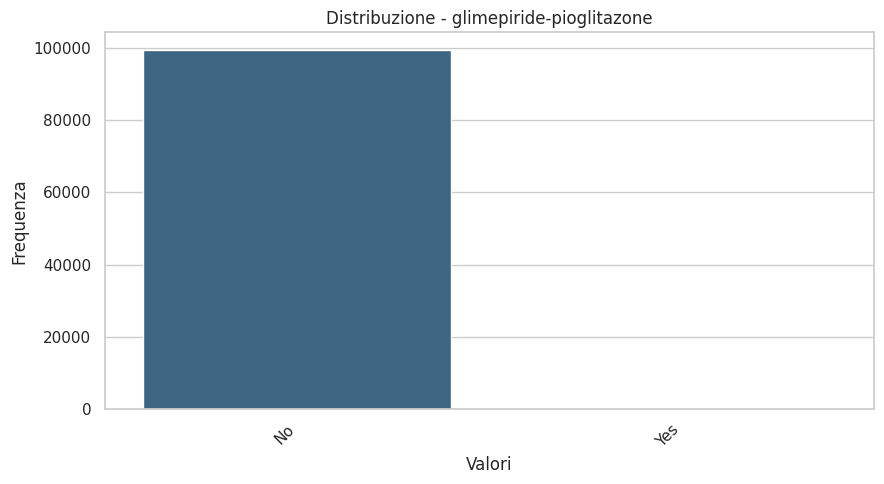

ANALISI DELLA FEATURE: metformin-rosiglitazone

Valori unici e frequenze:
metformin-rosiglitazone
No     99341
Yes        2
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


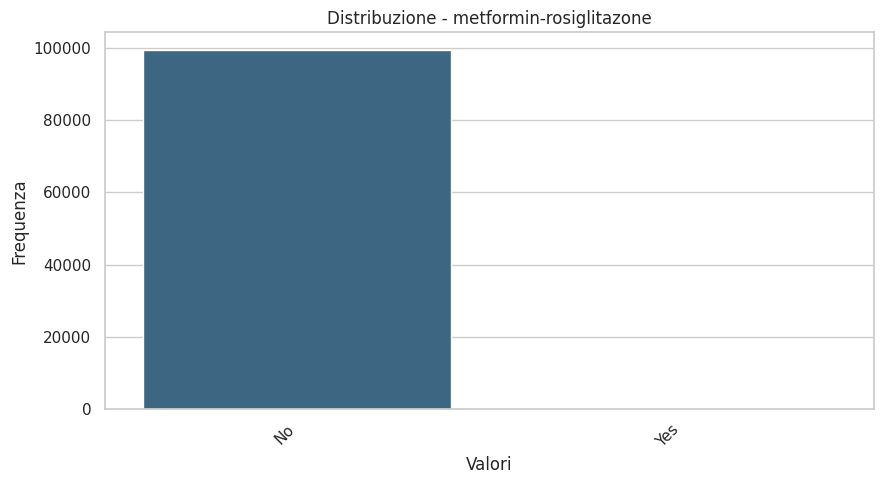

<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


ANALISI DELLA FEATURE: metformin-pioglitazone

Valori unici e frequenze:
metformin-pioglitazone
No     99342
Yes        1
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


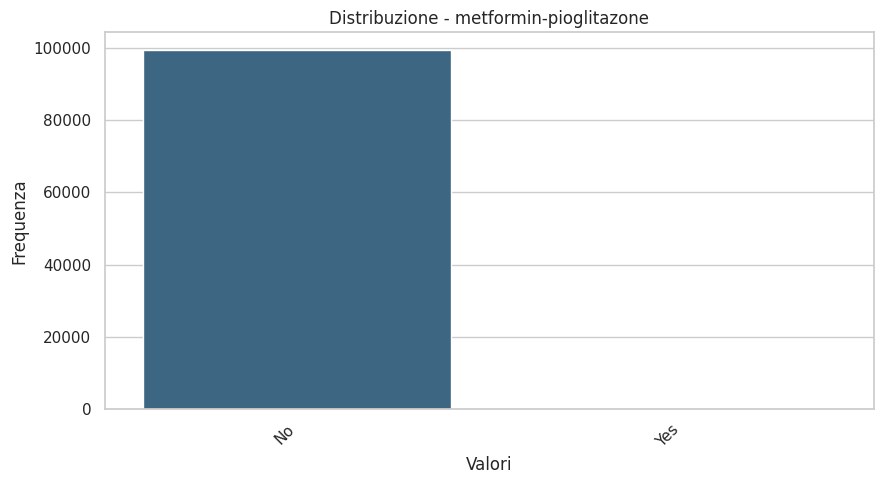

In [15]:
# Create a list of the medicine columns
medicine_cols = ['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone', 'tolazamide', 'examide', 'citoglipton', 'insulin', 'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone', 'metformin-rosiglitazone', 'metformin-pioglitazone']

# Replace 'No' and 'Steady' values with 'No' in the medicine columns
for col in medicine_cols:
    df[col] = df[col].replace(['Steady', 'Up', 'Down'], 'Yes')
    df[col] = df[col].replace(['Yes'], 'Yes')

for col in medicine_cols:
  analizza_feature(df, col)

**`medical_specialty`**

ANALISI DELLA FEATURE: medical_specialty

Valori unici e frequenze:
medical_specialty
NaN                  48626
Other                24187
Internal Medicine    14237
General Practice      7252
Surgery               5041
Name: count, dtype: int64

Numero di valori unici: 5

Valori nulli: 48626 (48.95%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


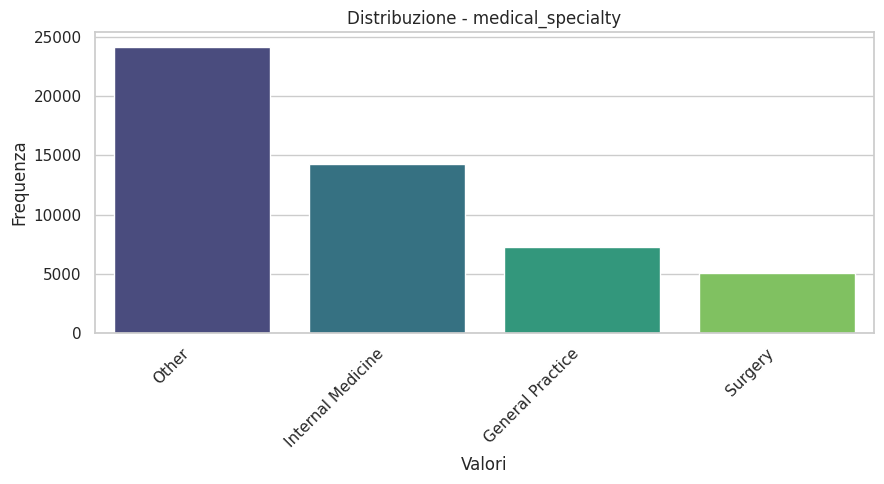

In [16]:
df.loc[df['medical_specialty'] == 'PhysicianNotFound', 'medical_specialty'] = np.nan
# Create a vector of unique medical specialties
medical_specialties = df['medical_specialty'].dropna().unique()

# Convert the vector to a list if needed
pathologies = list(medical_specialties)

def mappa_specialità(x):

   # Check if x is a NAType before calling lower()
    if pd.isnull(x):
        return np.nan  # Return NaN for missing values

    x = x.lower()  # dealing with case insensitive

    if 'surg' in x:
        return 'Surgery'
    elif 'internal' in x:
      return 'Internal Medicine'
    elif 'general' in x:
      return 'General Practice'
    else:
        return 'Other'

df['medical_specialty'] = df['medical_specialty'].apply(mappa_specialità)
analizza_feature(df, 'medical_specialty')

**diagnosis**

ANALISI DELLA FEATURE: diag_1

Valori unici e frequenze:
diag_1
Circulatory        29681
Other              17793
Respiratory        13934
Digestive           9333
Diabetes            8661
Injury              6853
Genitourinary       5002
Musculoskeletal     4935
Neoplasms           3131
NaN                   20
Name: count, dtype: int64

Numero di valori unici: 10

Valori nulli: 20 (0.02%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


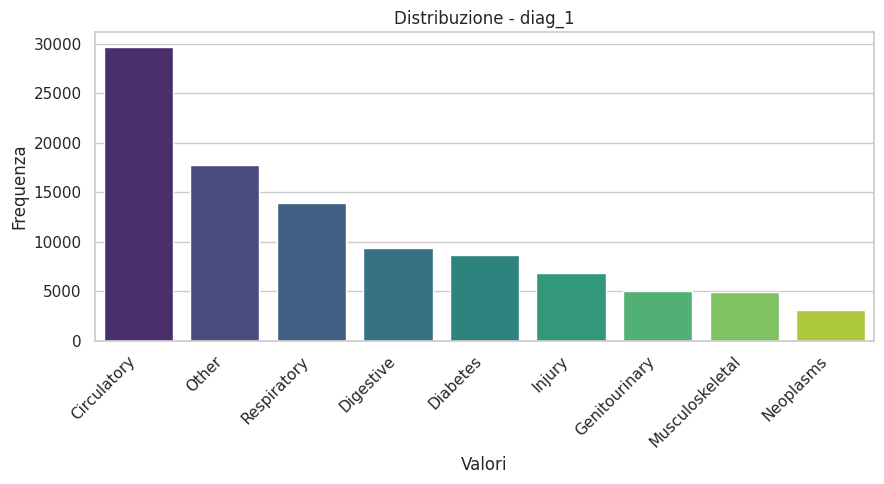

ANALISI DELLA FEATURE: diag_2

Valori unici e frequenze:
diag_2
Circulatory        31158
Other              26027
Diabetes           12705
Respiratory        10390
Genitourinary       8147
Digestive           4088
Injury              2385
Neoplasms           2326
Musculoskeletal     1761
NaN                  356
Name: count, dtype: int64

Numero di valori unici: 10

Valori nulli: 356 (0.36%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


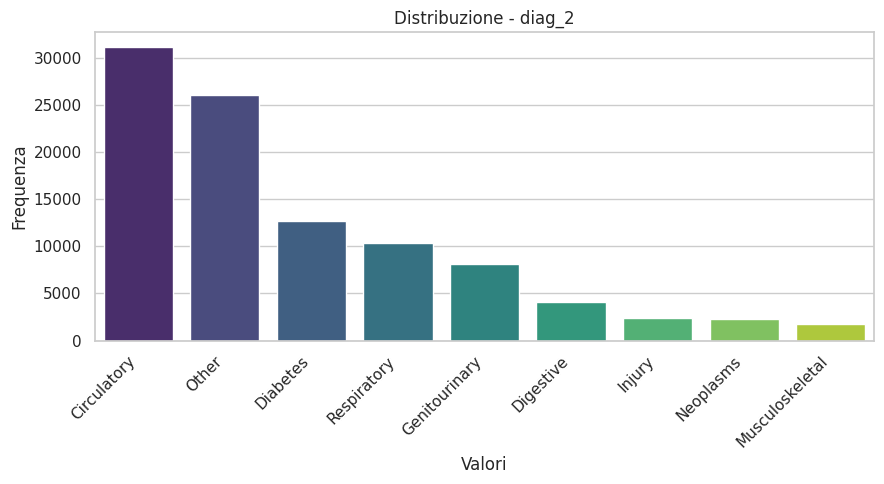

ANALISI DELLA FEATURE: diag_3

Valori unici e frequenze:
diag_3
Circulatory        29600
Other              28589
Diabetes           16979
Respiratory         7005
Genitourinary       6436
Digestive           3857
Musculoskeletal     1898
Injury              1898
Neoplasms           1662
NaN                 1419
Name: count, dtype: int64

Numero di valori unici: 10

Valori nulli: 1419 (1.43%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


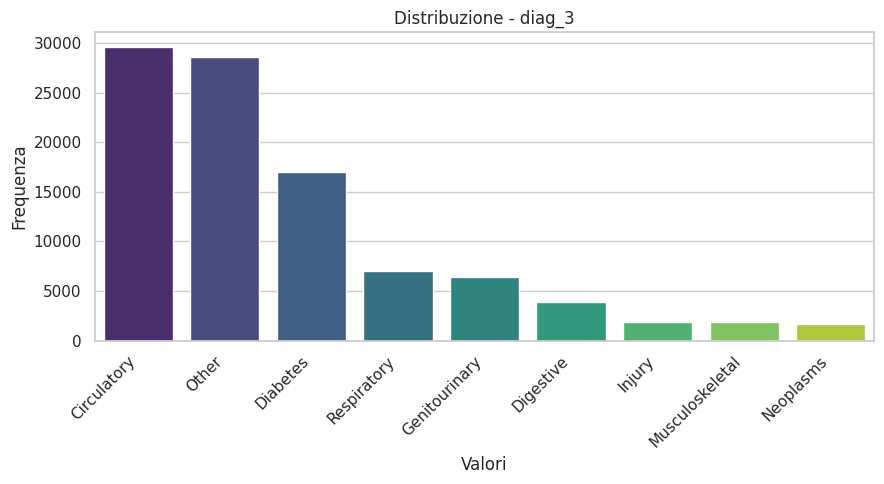

In [17]:
import numpy as np

def map_icd9_category(code):
    try:
        if pd.isna(code):
            return np.nan

        code = str(code)

        # Categorizations alphanumeric before (E, V)
        if code.startswith('V') or code.startswith('E'):
            return 'Other'

        code_num = float(code)

        if 390 <= code_num <= 459 or code_num == 785:
            return 'Circulatory'
        elif 460 <= code_num <= 519 or code_num == 786:
            return 'Respiratory'
        elif 520 <= code_num <= 579 or code_num == 787:
            return 'Digestive'
        elif 250 <= code_num < 251:
            return 'Diabetes'
        elif 800 <= code_num <= 999:
            return 'Injury'
        elif 710 <= code_num <= 739:
            return 'Musculoskeletal'
        elif 580 <= code_num <= 629 or code_num == 788:
            return 'Genitourinary'
        elif 140 <= code_num <= 239:
            return 'Neoplasms'
        else:
            return 'Other'
    except:
        return 'Other'

df['diag_1'] = df['diag_1'].apply(map_icd9_category)
analizza_feature(df, 'diag_1')
df['diag_2'] = df['diag_2'].apply(map_icd9_category)
analizza_feature(df, 'diag_2')
df['diag_3'] = df['diag_3'].apply(map_icd9_category)
analizza_feature(df, 'diag_3')

ANALISI DELLA FEATURE: A1Cresult_binary

Valori unici e frequenze:
A1Cresult_binary
No     82509
Yes    16834
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


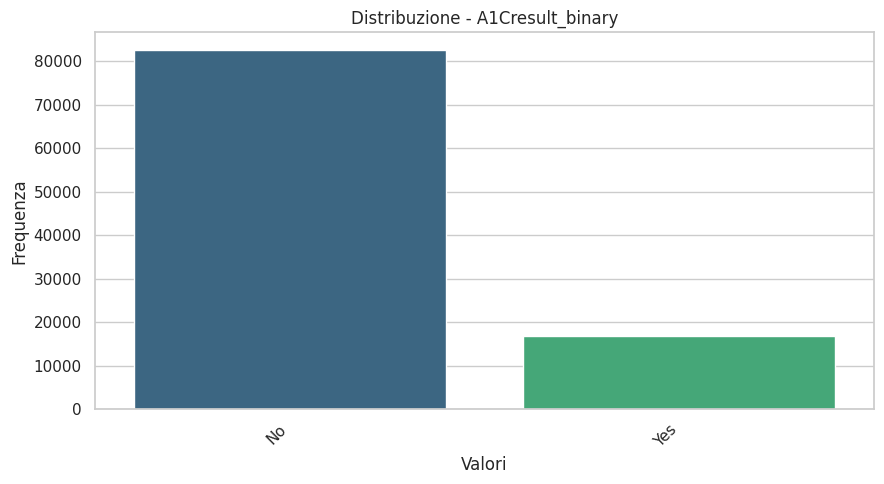

ANALISI DELLA FEATURE: max_glu_serum_binary

Valori unici e frequenze:
max_glu_serum_binary
No     94191
Yes     5152
Name: count, dtype: int64

Numero di valori unici: 2

Valori nulli: 0 (0.00%)


<ipython-input-5-2523786816>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vc.index.astype(str), y=vc.values, palette="viridis")


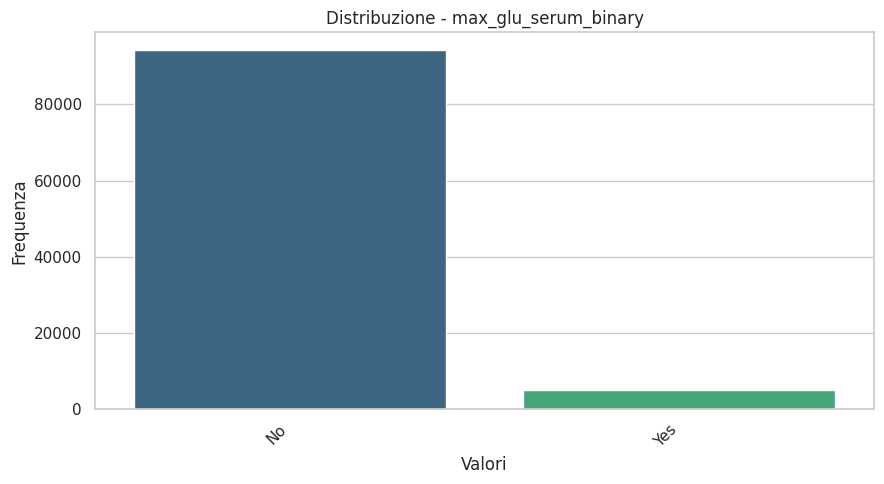

In [18]:
df['A1Cresult_binary'] = df['A1Cresult'].notna().map({True: 'Yes', False: 'No'})
df['max_glu_serum_binary'] = df['max_glu_serum'].notna().map({True: 'Yes', False: 'No'})

analizza_feature(df, 'A1Cresult_binary')
analizza_feature(df, 'max_glu_serum_binary')
drop_columns = ['A1Cresult', 'max_glu_serum']
df.drop(columns=drop_columns, inplace=True)

## 3.2 - Filtering ecounters

In [19]:
# Group by patient number and get the minimum encounter ID for each patient
first_encounter_ids = df.groupby('patient_nbr')['encounter_id'].min().reset_index()

# Merge the first encounter IDs back into the original DataFrame
df = pd.merge(df, first_encounter_ids, on='patient_nbr', suffixes=('', '_first'))

# Create a new column 'first_encounter'
df['first_encounter'] = (df['encounter_id'] == df['encounter_id_first']).astype(int)

# Rename the columns for clarity
df.rename(columns={'encounter_id_first': 'first_encounter_id'}, inplace=True)

# Now, 'first_encounter' will be 1 for the first encounter and 0 for readmissions
# for each patient.  The 'first_encounter_id' column contains the encounter_id
# of the first encounter for each patient.

#Example of how to use it:
print(df[['patient_nbr', 'encounter_id', 'first_encounter', 'first_encounter_id']].head(20))


    patient_nbr  encounter_id  first_encounter  first_encounter_id
0       8222157       2278392                1             2278392
1      55629189        149190                1              149190
2      86047875         64410                1               64410
3      82442376        500364                1              500364
4      42519267         16680                1               16680
5      82637451         35754                1               35754
6      84259809         55842                1               55842
7     114882984         63768                1               63768
8      48330783         12522                1               12522
9      63555939         15738                1               15738
10     89869032         28236                1               28236
11     77391171         36900                1               36900
12     85504905         40926                1               40926
13     77586282         42570                1               4

In [20]:
df=df.drop(columns='first_encounter_id')
df['first_encounter'] = df['first_encounter'].astype('object')

## Inconsistencies

In [21]:
import pandas as pd

def impute_payer_code_first(df: pd.DataFrame,
                            patient_col: str = 'patient_nbr',
                            code_col: str = 'payer_code') -> pd.DataFrame:
    # mappa paziente → primo payer_code non NaN
    mapping = (df.loc[df[code_col].notna(), [patient_col, code_col]]
                 .drop_duplicates(subset=patient_col)
                 .set_index(patient_col)[code_col])

    # riempi soltanto i NaN
    mask = df[code_col].isna()
    df.loc[mask, code_col] = df.loc[mask, patient_col].map(mapping)

    return df


df = impute_payer_code_first(df)      # df ora è con payer_code imputato

In [22]:
# --------------------------------------------------------------
# 1. Keep only patients with two or more encounters
# --------------------------------------------------------------
multi_mask = df.groupby('patient_nbr')['encounter_id'].transform('count') > 1
df_multi   = df[multi_mask].copy()

# --------------------------------------------------------------
# 2. Patients whose *race* is inconsistent (ignoring NaNs)
# --------------------------------------------------------------
race_inconsistent_ids = (
    df_multi.groupby('patient_nbr')['race']
            .nunique(dropna=True)      # dropna=True → ignore NaNs
            .loc[lambda s: s > 1]      # more than one distinct value
            .index
)

# --------------------------------------------------------------
# 3. Patients whose *gender* is inconsistent (ignoring NaNs)
# --------------------------------------------------------------
gender_inconsistent_ids = (
    df_multi.groupby('patient_nbr')['gender']
            .nunique(dropna=True)
            .loc[lambda s: s > 1]
            .index
)

# Merge the two sets of inconsistent patient IDs
inconsistent_ids = race_inconsistent_ids.union(gender_inconsistent_ids)

print(f"\nPatients with inconsistent race:   {len(race_inconsistent_ids)}")
print(f"Patients with inconsistent gender: {len(gender_inconsistent_ids)}")
print(f"Total patients to drop:            {len(inconsistent_ids)}")

# --------------------------------------------------------------
# (Optional) inspect all inconsistent rows
# --------------------------------------------------------------
if len(inconsistent_ids):
    cols = ['patient_nbr', 'encounter_id', 'race', 'gender']
    display(df.loc[df['patient_nbr'].isin(inconsistent_ids), cols]
              .sort_values(['patient_nbr', 'encounter_id']))





Patients with inconsistent race:   83
Patients with inconsistent gender: 3
Total patients to drop:            86


,patient_nbr,encounter_id,race,gender
5635,453267,29459682,Other,Male
20585,453267,73440450,Caucasian,Male
25169,453267,85454934,Caucasian,Male
12433,561609,51241260,Caucasian,Female
20335,561609,72818088,Other,Female
...,...,...,...,...
41004,112367349,129364242,Other,Female
44233,112367349,139559892,Caucasian,Female
60195,112367349,171959520,Caucasian,Female
2387,112786587,15876660,Caucasian,Female


In [23]:
# --------------------------------------------------------------
# 4. Drop inconsistent patients from the main DataFrame
# --------------------------------------------------------------
df = df[~df['patient_nbr'].isin(inconsistent_ids)].copy()
print("Updated DataFrame shape:", df.shape)

Updated DataFrame shape: (99079, 51)


In [24]:
import pandas as pd

def impute_race_gender_last(df: pd.DataFrame,
                            patient_col: str = "patient_nbr",
                            order_col:  str = "encounter_id",
                            cols: tuple = ("race", "gender")) -> pd.DataFrame:
    """
    For patients with ≥2 encounters, replace NaNs in the given columns
    with the *last* non-NaN value recorded for that patient.

    No use of fillna/ffill/bfill.

    Returns a NEW DataFrame; the original `df` is unchanged.
    """

    # ------------------------------------------------------------------
    # 1. Identify multi-encounter patients
    # ------------------------------------------------------------------
    multi_ids = (
        df[patient_col]
          .value_counts()
          .loc[lambda s: s > 1]       # keep only counts > 1
          .index
    )

    # ------------------------------------------------------------------
    # 2. Sort once by (patient, encounter) so "last" means "latest"
    # ------------------------------------------------------------------
    out = df.sort_values([patient_col, order_col]).copy()

    # Boolean mask: rows that belong to multi-encounter patients
    mask_multi = out[patient_col].isin(multi_ids)

    # ------------------------------------------------------------------
    # 3. For each target column:
    #    • build mapping patient → last non-NA value
    #    • assign that value ONLY to rows that are currently NA
    # ------------------------------------------------------------------
    for c in cols:
        # Subset of rows where the value is present
        valid_rows = out[mask_multi & out[c].notna()]

        # Mapping (index = patient_nbr, value = last non-NA)
        last_value_map = (
            valid_rows
              .groupby(patient_col, sort=False)[[order_col, c]]
              .last()                 # because DataFrame already sorted
              [c]                     # keep only the column itself
        )

        # Mask of rows we want to modify (multi-encounter + NA in column)
        na_mask = mask_multi & out[c].isna()

        # Vectorised assignment via .map
        out.loc[na_mask, c] = out.loc[na_mask, patient_col].map(last_value_map)

    return out


# --------------------------------------------------------------
# Usage
# --------------------------------------------------------------
df = impute_race_gender_last(df)

# Quick sanity-check
print("Remaining NaNs:")
print(df[["race", "gender"]].isna().sum())


Remaining NaNs:
race      2091
gender       3
dtype: int64


## 3.4 - Missingness analysis

In [25]:
# Calculate the percentage of NaN values for each feature in the diabetes samples
nan_percentage_diabetes = df.isnull().sum() * 100 / len(df)

# Select the features with more than 30% of missing values
features_with_high_missing = nan_percentage_diabetes[nan_percentage_diabetes > 0]

features_with_high_missing

,0
race,2.110437
gender,0.003028
weight,96.845951
payer_code,38.048426
medical_specialty,48.946800
diag_1,0.020186
diag_2,0.359309
diag_3,1.432190
admission_type,10.210034
discharge_disposition,4.710383


### 3.4.1 - Missing per instance

In [26]:
# Calculate the percentage of missing values for each instance (row)
missing_features_per_instance = df.isnull().sum(axis=1)
missing_percentage_per_instance = df.isnull().sum(axis=1) / len(df.columns) * 100

# Count instances with more than 10% missing features
instances_with_high_missingness = missing_percentage_per_instance[missing_percentage_per_instance > 10]
percentage = len(instances_with_high_missingness) / len(df) * 100

# Print in readable format
print(f"Number of instances with >10% missing features: {len(instances_with_high_missingness)}")
print(f"Percentage of total: {percentage:.2f}%")

Number of instances with >10% missing features: 166
Percentage of total: 0.17%


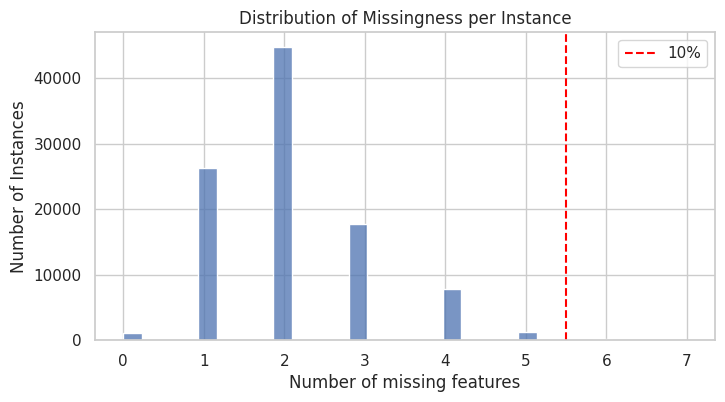

In [27]:
# Visualize the distribution of missing percentages per instance
plt.figure(figsize=(8, 4))
sns.histplot(missing_features_per_instance, bins=30)
plt.title('Distribution of Missingness per Instance')
plt.xlabel('Number of missing features')
plt.ylabel('Number of Instances')
plt.axvline(x=5.5, color='red', linestyle='--', label='10%')
plt.legend()
plt.grid(True)
plt.show()

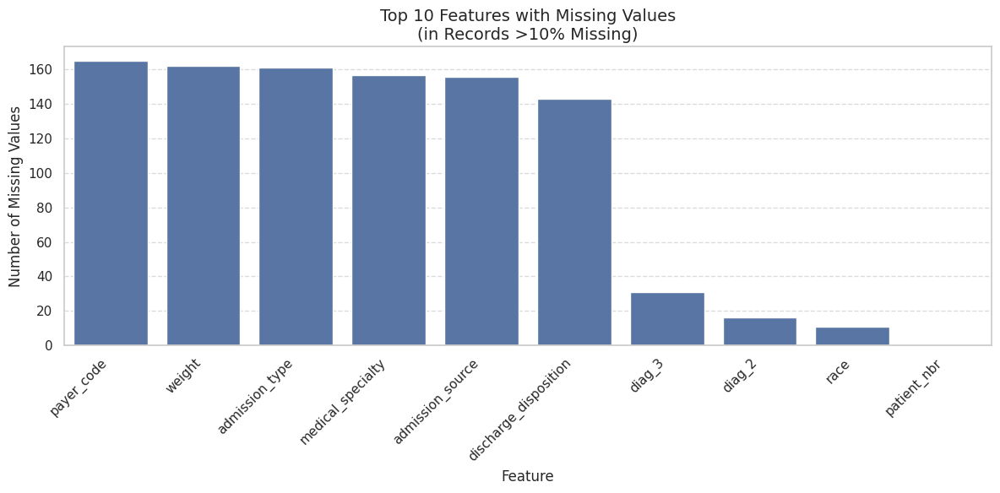

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calcola i missing per colonna sulle righe con alta missingness
high_missing_df = df[missing_percentage_per_instance > 10]
high_missing_summary = high_missing_df.isnull().sum().sort_values(ascending=False)

# Seleziona le 10 feature con più missing
top10_missing = high_missing_summary.head(10)

# Stile grafico
plt.figure(figsize=(12, 6))
sns.barplot(x=top10_missing.index, y=top10_missing.values)

# Abbellimenti
plt.title('Top 10 Features with Missing Values\n(in Records >10% Missing)', fontsize=14)
plt.ylabel('Number of Missing Values', fontsize=12)
plt.xlabel('Feature', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

In [29]:
df = df[missing_percentage_per_instance <= 10].copy()
print(f"Remaining instances after dropping: {len(df)}")

Remaining instances after dropping: 98913


### 3.4.2 - Weight

In [30]:
# Calculate the percentage of NaN values for each feature in the diabetes samples
nan_percentage_diabetes = df.isnull().sum() * 100 / len(df)

# Select the features with more than 80% of missing values
features_with_high_missing = nan_percentage_diabetes[nan_percentage_diabetes > 80]

features_with_high_missing

,0
weight,96.844702


In [31]:
# Drop features with more than 80% missing values
threshold = 0.80
nan_percentage_diabetes = df.isnull().sum() / len(df)
features_to_drop = nan_percentage_diabetes[nan_percentage_diabetes > threshold].index
df.drop(columns=features_to_drop, inplace=True)

### 3.4.3 - Payer code

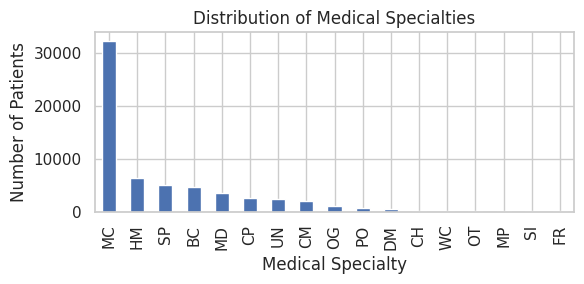

In [32]:
import matplotlib.pyplot as plt

# Create the histogram specifically for 'medical_specialty'
plt.figure(figsize=(6, 3))  # Adjust figure size for better readability
df['payer_code'].value_counts().plot(kind='bar')
plt.title('Distribution of Medical Specialties')
plt.xlabel('Medical Specialty')
plt.ylabel('Number of Patients')
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()


In [33]:
def esplora_missing_variabile(df, colonna_target):
    import math
    df = df.copy()
    missing_col = f'missing_{colonna_target}'
    df[missing_col] = df[colonna_target].isna().astype(int)

    # === GRAFICI CATEGORICI ===
    #cat_vars = ['admission_type', 'discharge_disposition', 'race', 'readmitted']
    cat_vars = ['admission_type']
    cat_vars = [var for var in cat_vars if var in df.columns]

    n = len(cat_vars)
    n_cols = 2
    n_rows = math.ceil(n / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
    axes = axes.flatten()
    #fig.suptitle(f"Proportion of missing values in \n'{colonna_target}' by categorical variables", fontsize=16)

    for i, var in enumerate(cat_vars):
        ax = axes[i]
        plot_data = df.groupby(var)[missing_col].mean().reset_index()
        plot_data['hue_var'] = plot_data[var].astype(str)
        colors = sns.color_palette('crest', n_colors=len(plot_data))

        sns.barplot(x=var, y=missing_col, hue='hue_var', data=plot_data, ax=ax, palette=colors, legend=False)
        ax.set_title(f"Proportion of missing values in '{colonna_target}' by '{var}'", fontsize=11)
        #ax.set_title(var.replace('_', ' ').title(), fontsize=12)
        ax.set_ylim(0, 0.6)
        ax.set_ylabel("Proportion Missing" if i % n_cols == 0 else "")
        ax.set_xlabel("")
        ax.tick_params(axis='x', rotation=45)

        for p in ax.patches:
            height = p.get_height()
            if pd.notna(height):
                ax.annotate(f"{height:.2f}", (p.get_x() + p.get_width() / 2., height + 0.03),
                            ha='center', fontsize=8)

    # Rimuove eventuali subplot vuoti
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout(rect=[0, 0, 1, 0.94])
    plt.show()

    # === CORRELAZIONI NUMERICHE ===
    num_vars = ['time_in_hospital', 'num_lab_procedures', 'num_procedures',
                'num_medications', 'number_outpatient', 'number_emergency',
                'number_inpatient', 'number_diagnoses']
    num_vars_presenti = [col for col in num_vars if col in df.columns]

    if num_vars_presenti:
        corr = df[num_vars_presenti + [missing_col]].corr()[missing_col].drop(missing_col)
        corr = corr.sort_values()

        plt.figure(figsize=(7, 6))
        sns.barplot(x=corr.values, y=corr.index, hue=corr.index, palette='crest', legend=False, dodge=False)
        plt.title(f"Correlation with 'missing_{colonna_target}'", fontsize=12)
        plt.xlabel("Correlation Coefficient")
        plt.axvline(0, color='gray', linestyle='--')
        for i, v in enumerate(corr.values):
            plt.text(v + 0.01 * (1 if v >= 0 else -1), i, f"{v:.2f}", va='center', fontsize=8)
        plt.tight_layout()
        plt.show()
    else:
        print(f"[Warning] No numeric variables found for correlation with '{missing_col}'.")

    df.drop(columns=missing_col, inplace=True)

    return df


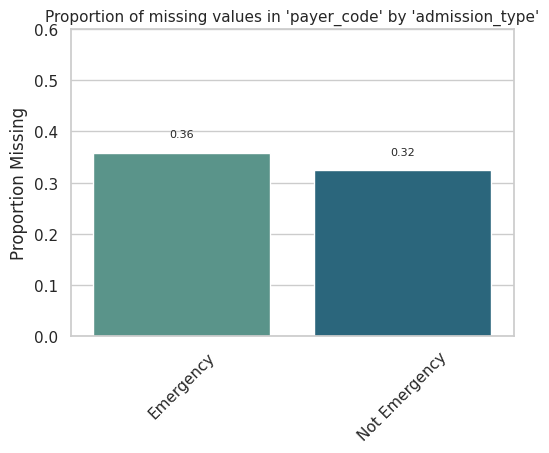

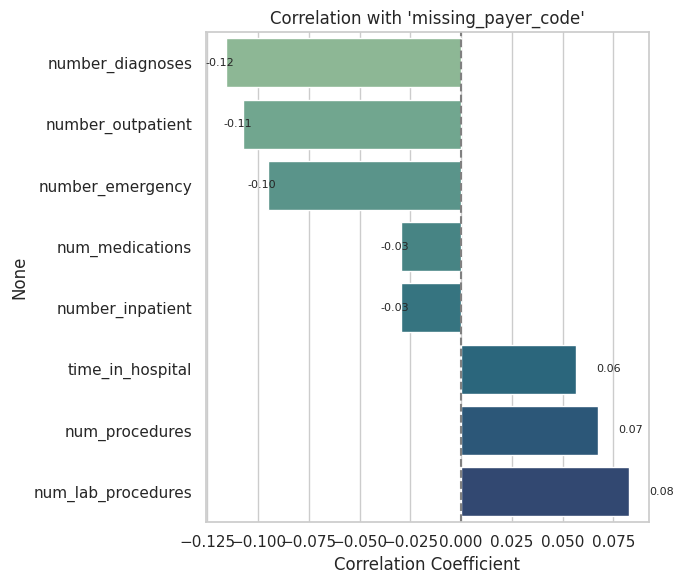

In [34]:
df = esplora_missing_variabile(df, 'payer_code')

In [35]:
df['payer_code'] = df['payer_code'].fillna('Unknown')
#df.drop(columns='payer_code', inplace=True)

### 3.4.4 - Medical Specialty

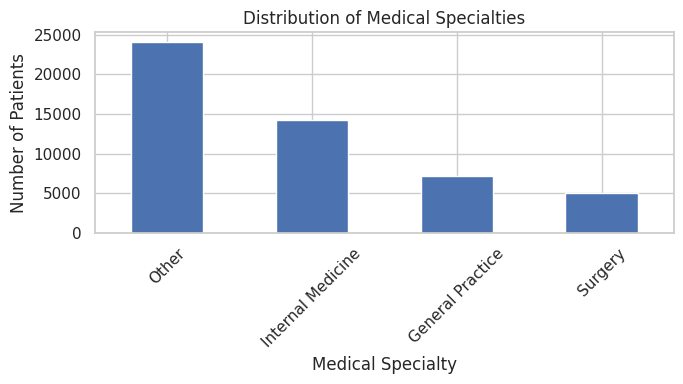

In [36]:
import matplotlib.pyplot as plt

# Create the histogram specifically for 'medical_specialty'
plt.figure(figsize=(7, 4))  # Adjust figure size for better readability
df['medical_specialty'].value_counts().plot(kind='bar')
plt.title('Distribution of Medical Specialties')
plt.xlabel('Medical Specialty')
plt.ylabel('Number of Patients')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()

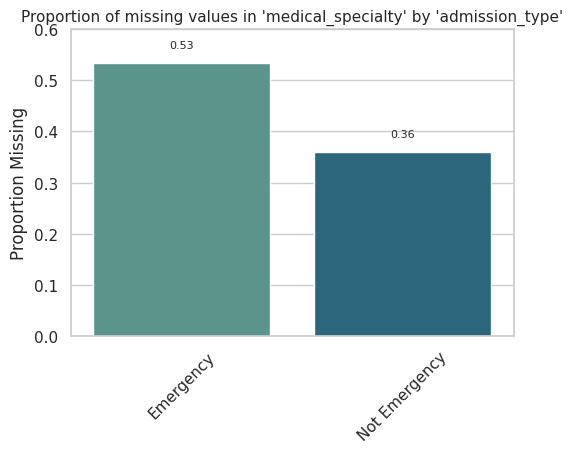

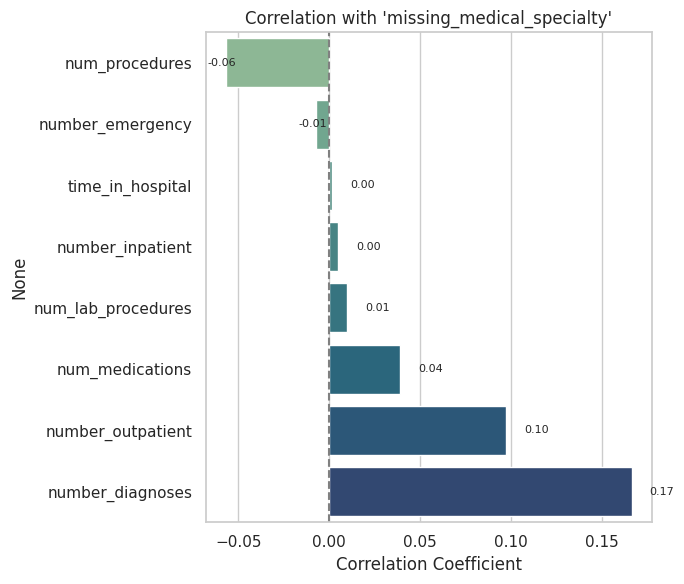

In [37]:
df=esplora_missing_variabile(df, 'medical_specialty')

In [38]:
df['medical_specialty'] = df['medical_specialty'].fillna('Unknown')
#df=df.drop(columns='medical_specialty')

### 3.4.5 - Other missingness

In [39]:
# Iterate through columns and check for missing values
for col in df.columns:
    missing_count = df[col].isnull().sum()
    if missing_count > 0:
        print(f"Column '{col}' has {missing_count} missing values ({(missing_count / len(df)) * 100:.2f}%).")

Column 'race' has 2080 missing values (2.10%).
Column 'gender' has 3 missing values (0.00%).
Column 'diag_1' has 20 missing values (0.02%).
Column 'diag_2' has 340 missing values (0.34%).
Column 'diag_3' has 1388 missing values (1.40%).
Column 'admission_type' has 9955 missing values (10.06%).
Column 'discharge_disposition' has 4524 missing values (4.57%).
Column 'admission_source' has 6683 missing values (6.76%).


In [40]:
# from sklearn.impute import SimpleImputer, KNNImputer

# # --- 1. Categorical features: Impute with most frequent value ---
# categorical_cols = [
#     'gender', 'admission_type', 'discharge_disposition',
#     'admission_source', 'race', 'diag_1',
#     'diag_2', 'diag_3'
# ]

# # Keep only columns that exist in df and have missing values
# categorical_cols = [col for col in categorical_cols if col in df.columns and df[col].isnull().sum() > 0]

# if categorical_cols:
#     cat_imputer = SimpleImputer(strategy='most_frequent')
#     df[categorical_cols] = cat_imputer.fit_transform(df[categorical_cols])
#     print(f"Categorical features imputed: {categorical_cols}")

# # --- 2. Numerical features: Impute using KNNImputer ---
# numeric_cols = [
#     'time_in_hospital', 'num_lab_procedures', 'num_procedures',
#     'num_medications', 'number_outpatient', 'number_emergency',
#     'number_inpatient', 'number_diagnoses'
# ]

# # Keep only columns that exist in df and have missing values
# numeric_cols = [col for col in numeric_cols if col in df.columns and df[col].isnull().sum() > 0]

# if numeric_cols:
#     num_imputer = KNNImputer(n_neighbors=5)
#     df[numeric_cols] = num_imputer.fit_transform(df[numeric_cols])
#     print(f"Numerical features imputed: {numeric_cols}")

# # --- Final check for remaining missing values ---
# print("\nRemaining NaN values:")
# print(df[categorical_cols + numeric_cols].isnull().sum())


# 4 - Data analysis

## 4.1 - Correlation matrix

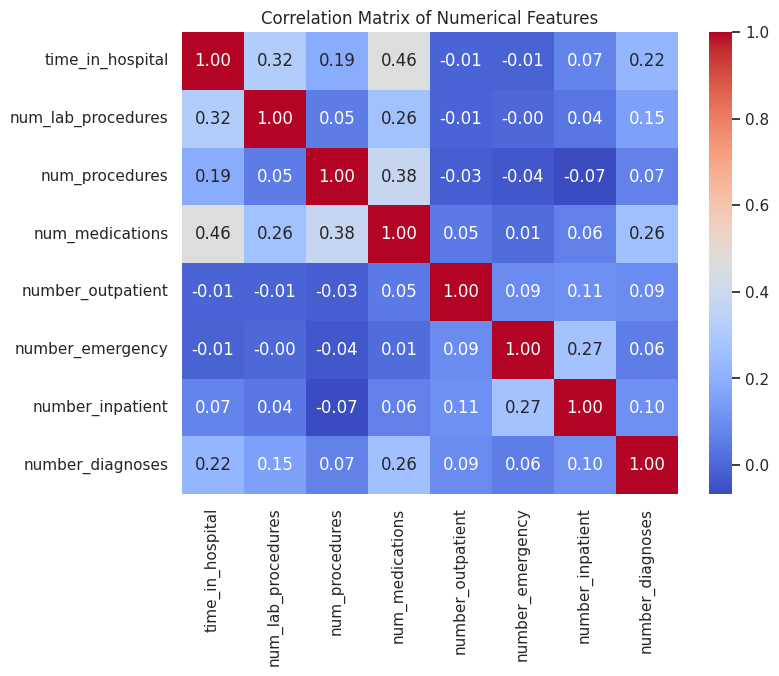

In [41]:
# Select only numerical features for correlation analysis
numerical_features = df.drop(columns=['encounter_id', 'patient_nbr']).select_dtypes(include=np.number)

# Calculate the correlation matrix
correlation_matrix = numerical_features.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

## 4.2 - Outliers

In [42]:
import numpy as np

# Thresholds
meds_threshold = 20
labs_threshold = 70

# --- Semantic rule function ---
def is_semantic_outlier(row):
    rules = [
        # Rule 1: Short stay + many medications
        (row['time_in_hospital'] <= 1) and (row['num_medications'] > meds_threshold),

        # Rule 2: Short stay + many lab procedures
        (row['time_in_hospital'] <= 1) and (row['num_lab_procedures'] > labs_threshold),
    ]
    return any(rules)

# --- Apply to dataset ---
df['semantic_outlier'] = df.apply(is_semantic_outlier, axis=1)

# --- Summary ---
n_out = df['semantic_outlier'].sum()
perc = n_out / len(df) * 100

print(f"Semantic outliers detected: {n_out} ({perc:.2f} %)")


Semantic outliers detected: 943 (0.95 %)


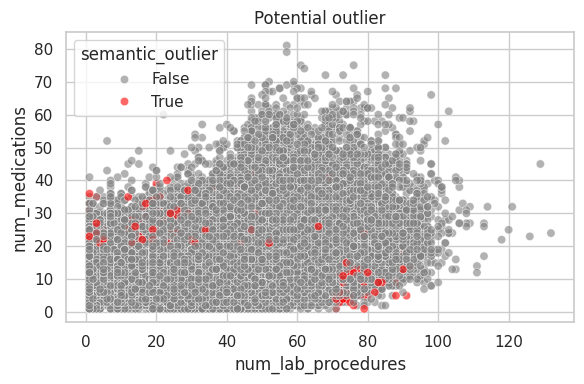

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 4))
sns.scatterplot(
    data=df,
    x='num_lab_procedures', y='num_medications',
    hue='semantic_outlier',
    palette={False: 'grey', True: 'red'},
    alpha=0.6
)
plt.title('Potential outlier')
plt.tight_layout()
plt.show()

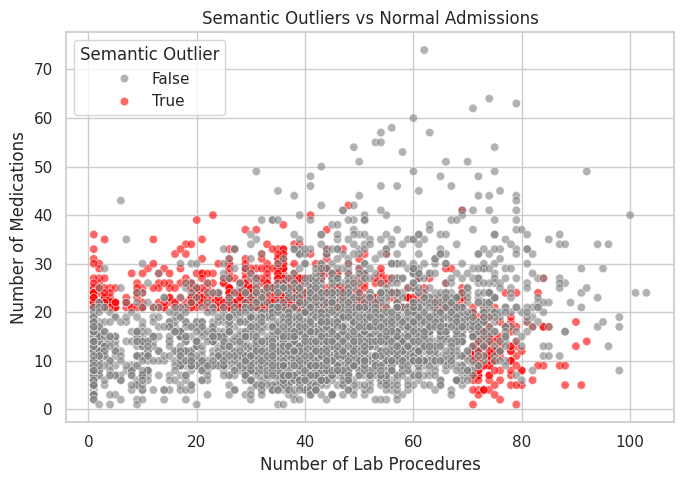

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

# --- Costruisci subset: semantic outlier + normali di confronto ---
outliers = df[df['semantic_outlier'] == True]
normals = df[df['semantic_outlier'] == False].sample(n=3000, random_state=42)
subset = pd.concat([outliers, normals])

# --- Plot ---
plt.figure(figsize=(7, 5))
sns.scatterplot(
    data=subset,
    x='num_lab_procedures',
    y='num_medications',
    hue='semantic_outlier',
    palette={False: 'grey', True: 'red'},
    alpha=0.6
)
plt.title('Semantic Outliers vs Normal Admissions')
plt.xlabel('Number of Lab Procedures')
plt.ylabel('Number of Medications')
plt.legend(title='Semantic Outlier')
plt.tight_layout()
plt.show()


<Axes: xlabel='num_lab_procedures', ylabel='num_medications'>

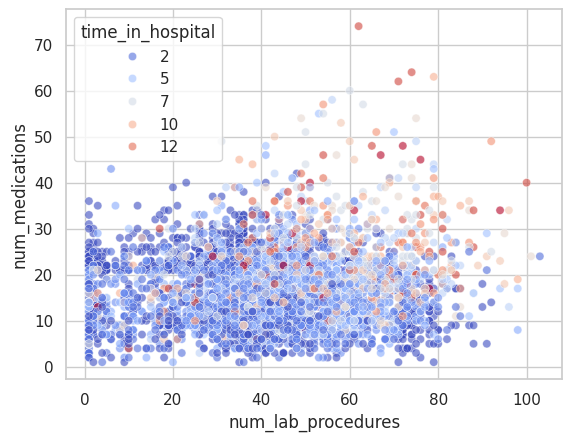

In [45]:
sns.scatterplot(
    data=subset,
    x='num_lab_procedures',
    y='num_medications',
    hue='time_in_hospital',  # invece di semantic_outlier
    palette='coolwarm',
    alpha=0.6
)


In [46]:
df[df['semantic_outlier']]['diag_1'].value_counts().head(10)

,count
diag_1,
Circulatory,354
Musculoskeletal,164
Respiratory,102
Other,99
Injury,59
Genitourinary,51
Digestive,47
Diabetes,42
Neoplasms,25


In [47]:
# Filtra solo i semantic outlier
semantic_outliers = df[df['semantic_outlier']]

# Unisci le diagnosi in un'unica serie
all_diags = pd.concat([
    semantic_outliers['diag_1'],
    semantic_outliers['diag_2'],
    semantic_outliers['diag_3']
])

# Conta le diagnosi più frequenti
top_diags = all_diags.value_counts().head(10)
print(top_diags)


Circulatory        1013
Other               501
Diabetes            398
Respiratory         240
Musculoskeletal     238
Genitourinary       176
Digestive            93
Injury               91
Neoplasms            60
Name: count, dtype: int64


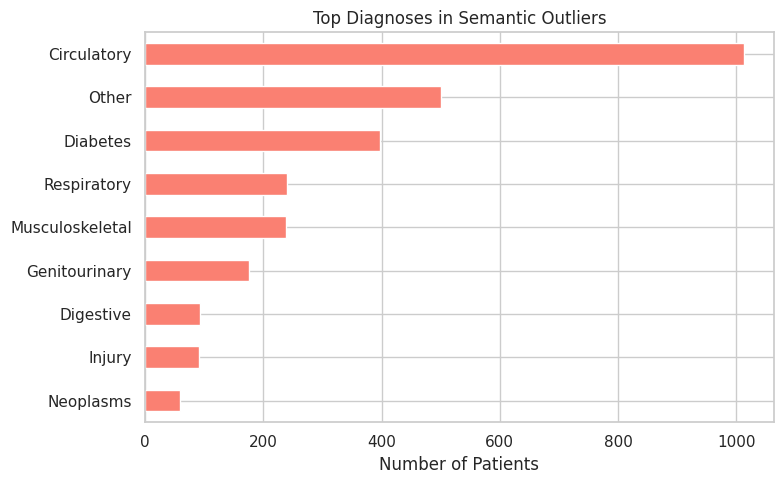

In [48]:
import matplotlib.pyplot as plt

# Supponendo che i dati siano in una Series chiamata diag_counts
diag_counts = pd.Series({
    'Circulatory': 1013,
    'Other': 501,
    'Diabetes': 398,
    'Respiratory': 240,
    'Musculoskeletal': 238,
    'Genitourinary': 176,
    'Digestive': 93,
    'Injury': 91,
    'Neoplasms': 60
})

diag_counts.sort_values(ascending=True).plot(kind='barh', figsize=(8,5), color='salmon')
plt.title('Top Diagnoses in Semantic Outliers')
plt.xlabel('Number of Patients')
plt.tight_layout()
plt.show()


In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 98913 entries, 4199 to 93870
Data columns (total 51 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   encounter_id              98913 non-null  int64 
 1   patient_nbr               98913 non-null  int64 
 2   race                      96833 non-null  object
 3   gender                    98910 non-null  object
 4   age                       98913 non-null  object
 5   time_in_hospital          98913 non-null  int64 
 6   payer_code                98913 non-null  object
 7   medical_specialty         98913 non-null  object
 8   num_lab_procedures        98913 non-null  int64 
 9   num_procedures            98913 non-null  int64 
 10  num_medications           98913 non-null  int64 
 11  number_outpatient         98913 non-null  int64 
 12  number_emergency          98913 non-null  int64 
 13  number_inpatient          98913 non-null  int64 
 14  diag_1                  

In [50]:
df.groupby('semantic_outlier')['admission_type'].value_counts(normalize=True)

semantic_outlier  admission_type
False             Emergency         0.794258
                  Not Emergency     0.205742
True              Not Emergency     0.601423
                  Emergency         0.398577
Name: proportion, dtype: float64

In [51]:
df.groupby('semantic_outlier')['readmitted'].value_counts(normalize=True)

semantic_outlier  readmitted
False             NO            0.528427
                  >30           0.357446
                  <30           0.114127
True              NO            0.598091
                  >30           0.320255
                  <30           0.081654
Name: proportion, dtype: float64

In [52]:
df.groupby('semantic_outlier')[['number_outpatient', 'number_emergency', 'number_inpatient']].mean()


,number_outpatient,number_emergency,number_inpatient
semantic_outlier,,,
False,0.368419,0.197550,0.629774
True,0.392365,0.250265,0.600212


In [53]:
df.groupby('semantic_outlier')[['number_diagnoses', 'num_procedures']].mean().round(2)

,number_diagnoses,num_procedures
semantic_outlier,,
False,7.41,1.33
True,6.96,2.06


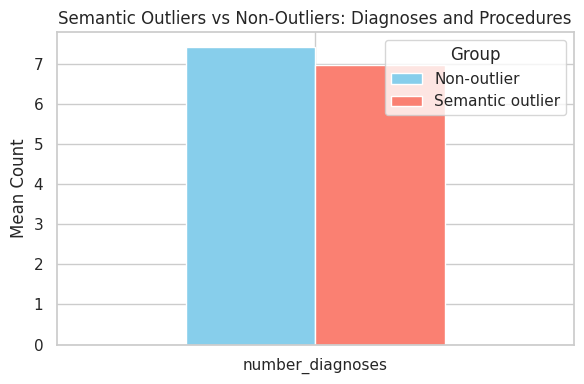

In [54]:
import matplotlib.pyplot as plt

# Calcolo della media per ciascun gruppo
means = df.groupby('semantic_outlier')[['number_diagnoses']].mean().round(2)
means.index = ['Non-outlier', 'Semantic outlier']

# Trasposizione per confrontare semantic vs non per ogni metrica
means.T.plot(kind='bar', figsize=(6,4), color=['skyblue', 'salmon'])

# Titoli e layout
plt.title('Semantic Outliers vs Non-Outliers: Diagnoses and Procedures')
plt.ylabel('Mean Count')
plt.xticks(rotation=0)
plt.legend(title='Group')
plt.tight_layout()
plt.show()


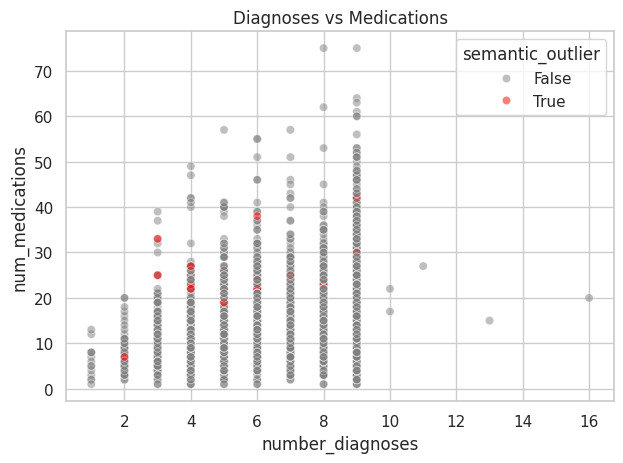

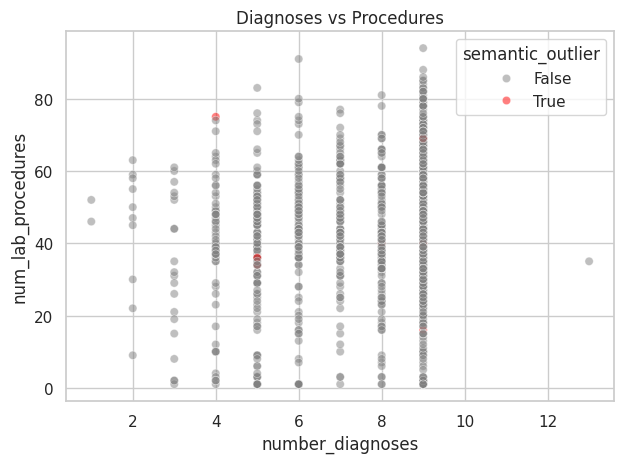

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

# Scatterplot: Diagnosi vs Farmaci
sns.scatterplot(
    data=df.sample(5000, random_state=42),  # usa un campione se il dataset è grande
    x='number_diagnoses',
    y='num_medications',
    hue='semantic_outlier',
    palette={False: 'grey', True: 'red'},
    alpha=0.5
)
plt.title('Diagnoses vs Medications')
plt.tight_layout()
plt.show()

# Scatterplot: Diagnosi vs Procedure
sns.scatterplot(
    data=df.sample(1000, random_state=42),
    x='number_diagnoses',
    y='num_lab_procedures',
    hue='semantic_outlier',
    palette={False: 'grey', True: 'red'},
    alpha=0.5
)
plt.title('Diagnoses vs Procedures')
plt.tight_layout()
plt.show()


In [56]:
df.drop(columns='semantic_outlier', inplace=True)

In [57]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest

# --- 1. Seleziona le feature rilevanti ---
features_iso = ['num_medications', 'num_lab_procedures','num_procedures',
                'number_inpatient', 'number_emergency',
                'time_in_hospital', 'number_diagnoses']

X = df[features_iso]

# --- 2. Standardizza ---
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# --- 3. Isolation Forest ---
iso = IsolationForest(contamination=0.03, random_state=42)
df['anomaly_flag'] = iso.fit_predict(X_scaled)

# Nota: -1 = outlier, 1 = normale
df['outlier_iso'] = df['anomaly_flag'] == -1

# --- 4. Report rapido ---
n_outliers = df['outlier_iso'].sum()
print(f"Isolation Forest outliers detected: {n_outliers} ({n_outliers / len(df):.2%})")


Isolation Forest outliers detected: 2968 (3.00%)


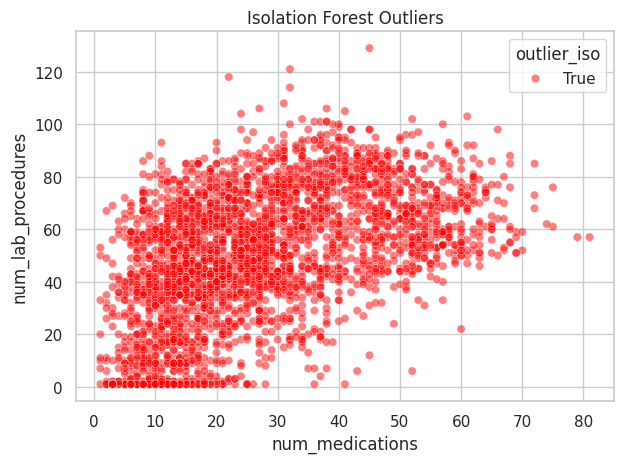

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(
    data=df[df['outlier_iso']==1],
    x='num_medications', y='num_lab_procedures',
    hue='outlier_iso',
    palette={False: 'grey', True: 'red'},
    alpha=0.5
)
plt.title('Isolation Forest Outliers')
plt.tight_layout()
plt.show()

In [59]:
# Filtra solo i semantic outlier
semantic_outliers = df[df['outlier_iso']]

# Unisci le diagnosi in un'unica serie
all_diags = pd.concat([
    semantic_outliers['diag_1'],
    semantic_outliers['diag_2'],
    semantic_outliers['diag_3']
])

# Conta le diagnosi più frequenti
top_diags = all_diags.value_counts().head(10)
print(top_diags)


Circulatory        2767
Other              2084
Diabetes           1284
Respiratory         902
Genitourinary       544
Digestive           525
Injury              329
Neoplasms           174
Musculoskeletal     161
Name: count, dtype: int64


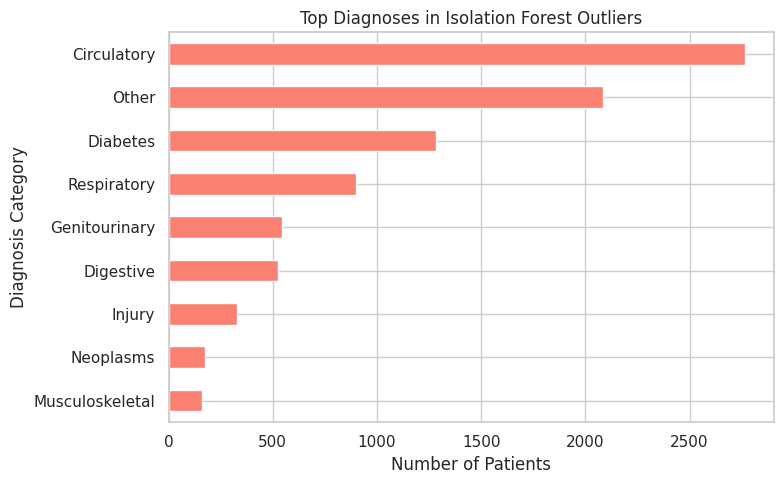

In [60]:
# prompt: show bar plot of top diags

# Assuming top_diags is a pandas Series containing the top diagnoses counts
# If it's not already sorted, sort it for the bar plot
top_diags_sorted = top_diags.sort_values(ascending=True)

# Create the horizontal bar plot
plt.figure(figsize=(8,5)) # Adjust figure size as needed
top_diags_sorted.plot(kind='barh', color='salmon')

# Add title and labels
plt.title('Top Diagnoses in Isolation Forest Outliers')
plt.xlabel('Number of Patients')
plt.ylabel('Diagnosis Category') # Added y-axis label for clarity
plt.tight_layout() # Adjust layout to prevent labels overlapping

# Show the plot
plt.show()

In [61]:
# Confronto aggregato: chi sono questi outlier?
df.groupby('outlier_iso')[['num_medications', 'num_lab_procedures', 'time_in_hospital', 'number_diagnoses']].mean().round(2)


,num_medications,num_lab_procedures,time_in_hospital,number_diagnoses
outlier_iso,,,,
False,15.63,42.70,4.29,7.40
True,27.36,50.49,7.36,7.47


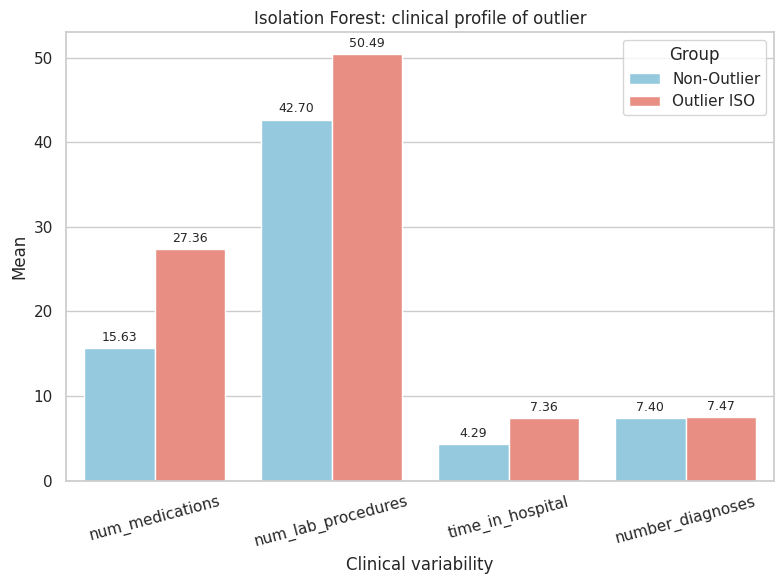

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Dati medi
data = {
    'Feature': ['num_medications', 'num_lab_procedures', 'time_in_hospital', 'number_diagnoses'],
    'Non-Outlier': [15.63, 42.70, 4.29, 7.40],
    'Outlier ISO': [27.36, 50.49, 7.36, 7.47]
}

# Crea DataFrame e trasformalo in formato long
df_plot = pd.DataFrame(data)
df_melted = df_plot.melt(id_vars='Feature', var_name='Group', value_name='Mean Value')

# Crea barplot
plt.figure(figsize=(8, 6))
barplot = sns.barplot(data=df_melted, x='Feature', y='Mean Value', hue='Group', palette=['skyblue', 'salmon'])

# Aggiungi etichette sopra le barre
for container in barplot.containers:
    barplot.bar_label(container, fmt='%.2f', label_type='edge', fontsize=9, padding=3)

# Personalizza grafico
plt.title('Isolation Forest: clinical profile of outlier')
plt.ylabel('Mean')
plt.xlabel('Clinical variability')
plt.xticks(rotation=15)
plt.legend(title='Group')
plt.tight_layout()
plt.show()


In [63]:
# Confronto aggregato: chi sono questi outlier?
df.groupby('outlier_iso')[['num_medications', 'num_lab_procedures', 'time_in_hospital', 'number_diagnoses']].mean().round(2)


,num_medications,num_lab_procedures,time_in_hospital,number_diagnoses
outlier_iso,,,,
False,15.63,42.70,4.29,7.40
True,27.36,50.49,7.36,7.47


In [64]:
pd.crosstab(df['outlier_iso'], df['admission_type'], normalize='index').round(2)


admission_type,Emergency,Not Emergency
outlier_iso,,
False,0.79,0.21
True,0.76,0.24


In [65]:
df[df['outlier_iso']].head(10)

,encounter_id,patient_nbr,race,gender,age,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,...,diabetesMed,readmitted,admission_type,discharge_disposition,admission_source,A1Cresult_binary,max_glu_serum_binary,first_encounter,anomaly_flag,outlier_iso
59963,171414378,1629,Caucasian,Male,[70-80),14,MC,Unknown,21,0,...,Yes,>30,Not Emergency,Discharged to Home,Transfered,No,No,1,-1,True
22762,79346610,12240,Caucasian,Male,[50-60),13,Unknown,Internal Medicine,88,6,...,Yes,NO,Emergency,Discharged to Home,Emergency,Yes,No,1,-1,True
1275,9118542,49860,Caucasian,Female,[70-80),13,Unknown,Internal Medicine,80,6,...,Yes,>30,Emergency,Transferred to Another Facility,Emergency,Yes,No,1,-1,True
5908,30533034,85761,Caucasian,Male,[50-60),10,Unknown,Unknown,66,6,...,Yes,<30,Emergency,Discharged to Home,Referral,Yes,No,1,-1,True
17516,65185692,103140,African American,Female,[60-70),4,Unknown,Unknown,50,4,...,Yes,<30,Emergency,NaN,Emergency,No,No,0,-1,True
20483,73191252,107460,Caucasian,Female,[50-60),13,Unknown,Other,76,2,...,Yes,<30,Emergency,Discharged to Home,Emergency,Yes,No,0,-1,True
33579,107375580,118809,African American,Female,[50-60),14,MD,Internal Medicine,51,0,...,Yes,NO,Emergency,Discharged to Home,Transfered,Yes,No,0,-1,True
36610,115708560,130131,African American,Female,[70-80),13,BC,Unknown,80,5,...,Yes,<30,Emergency,Transferred to Another Facility,Emergency,Yes,No,1,-1,True
21498,75972756,133569,African American,Female,U50,12,Unknown,Unknown,96,0,...,Yes,<30,Emergency,Transferred to Another Facility,Emergency,No,No,0,-1,True
27712,92544276,135261,Caucasian,Male,[70-80),13,MC,Internal Medicine,71,5,...,Yes,NO,Emergency,Discharged to Home,Transfered,No,No,1,-1,True


In [66]:
df.drop(columns=['anomaly_flag','outlier_iso'], inplace=True)

## 4.3 - Features skewness

In [67]:
# Calculate skewness
skewed_feats =numerical_features.skew().sort_values(ascending=False)

# Filter the ones with a significant skewness (>1 o <–1)
skewed_cols = skewed_feats[abs(skewed_feats) > 1].index.tolist()
print("Feature skewed:", skewed_cols)

Feature skewed: ['number_emergency', 'number_outpatient', 'number_inpatient', 'num_medications', 'num_procedures', 'time_in_hospital']


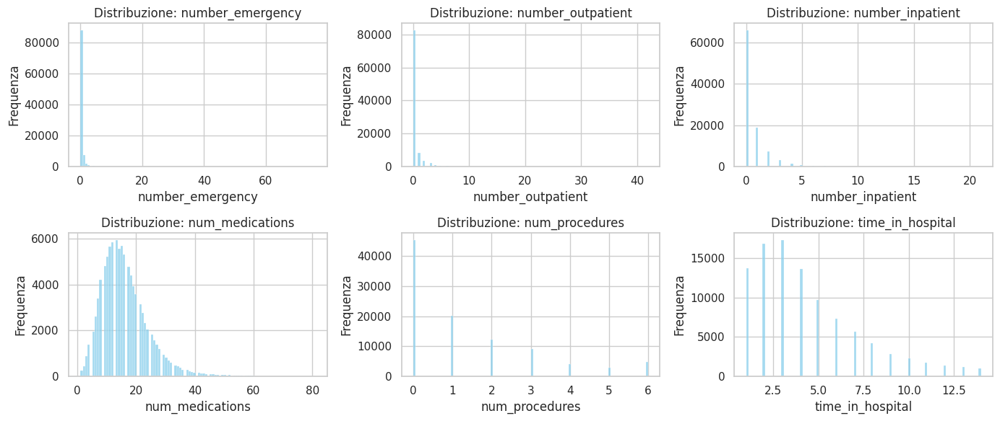

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns

# To visualize the distribution of the skewed features
def plot_skewed_distributions(df, cols, bins=100):
    n = len(cols)
    rows = (n + 2) // 3  # 3 plot per row
    plt.figure(figsize=(14, 3 * rows))

    for i, col in enumerate(cols):
        plt.subplot(rows, 3, i + 1)
        sns.histplot(df[col], bins=bins, color='skyblue')
        plt.title(f'Distribuzione: {col}')
        plt.xlabel(col)
        plt.ylabel('Frequenza')

    plt.tight_layout()
    plt.show()

plot_skewed_distributions(df, skewed_cols)

In [69]:
df_log = df.copy()

for col in skewed_cols:
    # Only if all the values are >= 0 (just in case)
    if (df_log[col] >= 0).all():
        df_log[col] = np.log1p(df_log[col])


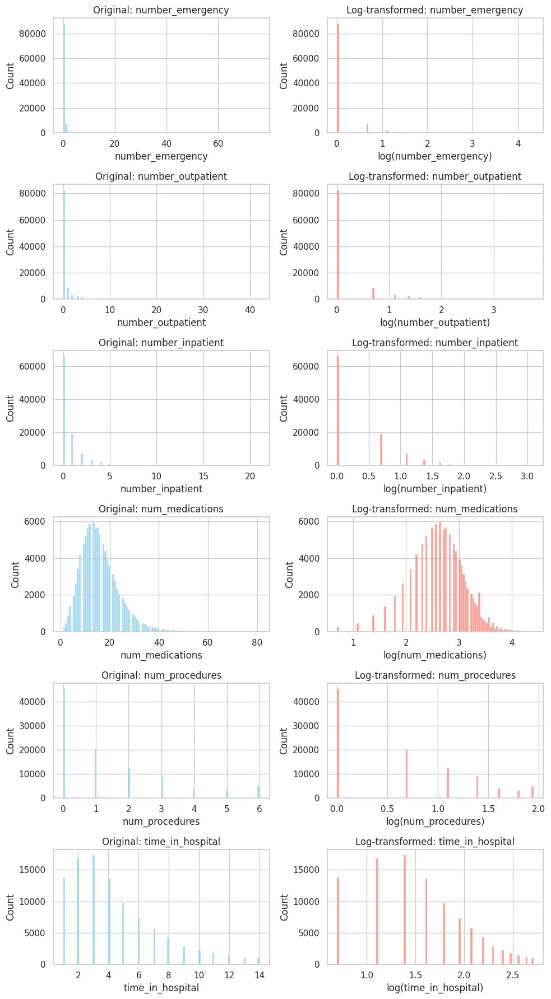

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_skewed_comparison(original_df, transformed_df, columns, bins=100):
    n = len(columns)
    plt.figure(figsize=(10, 3 * n))  # dynamic height, 1 row for each feature

    for i, col in enumerate(columns):
        # Original column
        plt.subplot(n, 2, 2 * i + 1)
        sns.histplot(original_df[col], bins=bins, color='skyblue')
        plt.title(f'Original: {col}')
        plt.xlabel(col)

        # Transformed column
        plt.subplot(n, 2, 2 * i + 2)
        sns.histplot(transformed_df[col], bins=bins, color='salmon')
        plt.title(f'Log-transformed: {col}')
        plt.xlabel(f'log({col})')

    plt.tight_layout()
    plt.show()

plot_skewed_comparison(df, df_log, skewed_cols)

## 4.4 - Clustering

In [71]:
df_log.info()

<class 'pandas.core.frame.DataFrame'>
Index: 98913 entries, 4199 to 93870
Data columns (total 50 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   encounter_id              98913 non-null  int64  
 1   patient_nbr               98913 non-null  int64  
 2   race                      96833 non-null  object 
 3   gender                    98910 non-null  object 
 4   age                       98913 non-null  object 
 5   time_in_hospital          98913 non-null  float64
 6   payer_code                98913 non-null  object 
 7   medical_specialty         98913 non-null  object 
 8   num_lab_procedures        98913 non-null  int64  
 9   num_procedures            98913 non-null  float64
 10  num_medications           98913 non-null  float64
 11  number_outpatient         98913 non-null  float64
 12  number_emergency          98913 non-null  float64
 13  number_inpatient          98913 non-null  float64
 14  diag_1  

In [72]:
from sklearn.preprocessing import StandardScaler

cols = ['num_medications', 'num_lab_procedures', 'num_procedures', 'number_inpatient', 'number_outpatient', 'number_emergency', 'time_in_hospital', 'number_diagnoses']
X_cluster = df_log[cols]
X_scaled = StandardScaler().fit_transform(X_cluster)


In [73]:
from sklearn.cluster import MiniBatchKMeans

mbk = MiniBatchKMeans(n_clusters=5, batch_size=1000, random_state=42)
df_log['kmeans_cluster'] = mbk.fit_predict(X_scaled)


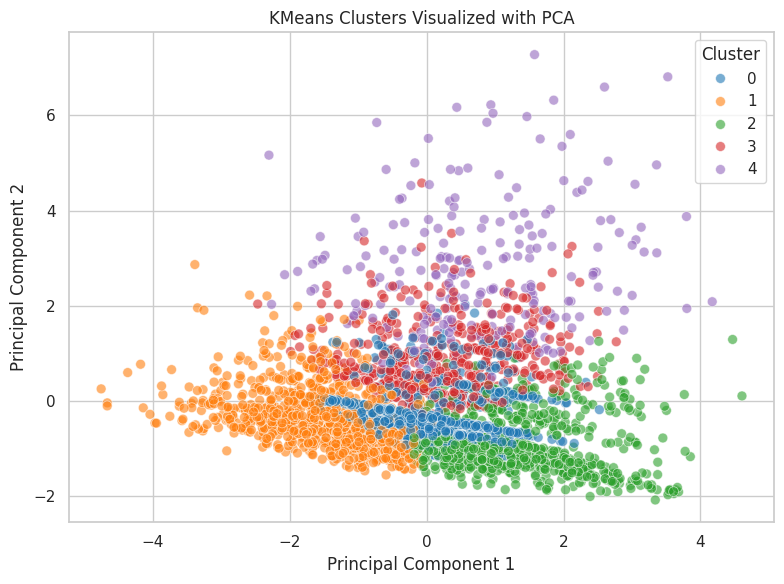

In [74]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Perform PCA
pca = PCA(n_components=2)  # Reduce to 2 dimensions for plotting
X_pca = pca.fit_transform(X_scaled)

df_log['PCA1'] = X_pca[:, 0]
df_log['PCA2'] = X_pca[:, 1]

# Plot the clusters using the PCA components
plt.figure(figsize=(8, 6))
sns.scatterplot(
    # Use df as the data source, as it contains 'PCA1' and 'PCA2'
    data=df_log.sample(3000, random_state=42),
    x='PCA1',
    y='PCA2',
    # kmeans_cluster was added to df_log, so we need to access it from there
    hue=df_log['kmeans_cluster'],
    palette='tab10',     # Choose a color palette
    alpha=0.6,
    edgecolor='w',
    s=50                 # Size of the points
)

plt.title('KMeans Clusters Visualized with PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()

In [75]:
df_log.drop(columns=['kmeans_cluster', 'PCA1', 'PCA2'], inplace=True)
df_log.info()

<class 'pandas.core.frame.DataFrame'>
Index: 98913 entries, 4199 to 93870
Data columns (total 50 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   encounter_id              98913 non-null  int64  
 1   patient_nbr               98913 non-null  int64  
 2   race                      96833 non-null  object 
 3   gender                    98910 non-null  object 
 4   age                       98913 non-null  object 
 5   time_in_hospital          98913 non-null  float64
 6   payer_code                98913 non-null  object 
 7   medical_specialty         98913 non-null  object 
 8   num_lab_procedures        98913 non-null  int64  
 9   num_procedures            98913 non-null  float64
 10  num_medications           98913 non-null  float64
 11  number_outpatient         98913 non-null  float64
 12  number_emergency          98913 non-null  float64
 13  number_inpatient          98913 non-null  float64
 14  diag_1  

In [76]:
df_log.shape

(98913, 50)

# 5 - Data preparation

In [77]:
# X = features, target = y
X = df_log.drop(columns='readmitted')
y = df_log['readmitted']

# Label encoding del target
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_encoded = le.fit_transform(y)


In [78]:
# from sklearn.model_selection import StratifiedGroupKFold

# X['patient_nbr'] = df_log['patient_nbr']
# groups = X['patient_nbr']

# sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)

# for train_idx, test_idx in sgkf.split(X, y_encoded, groups=groups):
#     X_train = X.iloc[train_idx].drop(columns=['patient_nbr', 'encounter_id'])
#     X_test = X.iloc[test_idx].drop(columns=['patient_nbr', 'encounter_id'])
#     y_train = y_encoded[train_idx]
#     y_test = y_encoded[test_idx]
#     break  # solo prima fold


In [79]:
# # Categorical e numerical columns
# cat_cols = X_train.select_dtypes(include=['object']).columns.tolist()
# num_cols = ['time_in_hospital', 'num_lab_procedures', 'num_procedures',
#             'num_medications', 'number_outpatient', 'number_emergency',
#             'number_inpatient', 'number_diagnoses']


In [80]:
# from sklearn.compose import ColumnTransformer
# from sklearn.impute import SimpleImputer
# from sklearn.preprocessing import StandardScaler, OneHotEncoder

# # Imputer + encoder per le categoriche
# cat_pipeline = Pipeline([
#     ('imputer', SimpleImputer(strategy='most_frequent')),
#     ('onehot', OneHotEncoder(handle_unknown='ignore'))
# ])

# # Imputer + scaler per i numerici (opzionale se non hai missing numerici)
# num_pipeline = Pipeline([
#     ('scaler', StandardScaler())
# ])

# # Preprocessor completo
# preprocessor = ColumnTransformer([
#     ('num', num_pipeline, num_cols),
#     ('cat', cat_pipeline, cat_cols)
# ])


In [81]:
# from sklearn.linear_model import LogisticRegression, SGDClassifier
# from sklearn.multiclass import OneVsRestClassifier

# baseline_model = OneVsRestClassifier(
#     LogisticRegression(random_state=12345, max_iter=1000)
# )

# # Pipeline finale
# clf_pipeline = Pipeline([
#     ('preprocessing', preprocessor),
#     ('classifier', baseline_model)
# ])


In [82]:
# # Fit
# clf_pipeline.fit(X_train, y_train)

# # Predict
# y_pred = clf_pipeline.predict(X_test)

# # Valutazione
# from sklearn.metrics import classification_report
# print(classification_report(y_test, y_pred, target_names=le.classes_))


In [83]:
# 1. Selection of categorical features
categorical_cols = X.select_dtypes(include=['object', 'category']).columns

# 2. One-Hot Encoding
X_categorical_encoded = pd.get_dummies(X[categorical_cols], drop_first=True)  # drop_first avoids multicollinearity

# 3. Union of the numerical columns with the one-hot encoded ones
X_encoded = pd.concat([X.drop(columns=categorical_cols), X_categorical_encoded], axis=1)
X_encoded.shape

(98913, 93)

In [84]:
# from sklearn.preprocessing import LabelEncoder

# # Encode del target
# le = LabelEncoder()
# y_encoded = le.fit_transform(target)

In [85]:
for i, label in enumerate(le.classes_):
    print(f"{i}: {label} (count: {(np.sum(y_encoded==i))}- percentage: {(np.sum(y_encoded == i) / len(y_encoded)) * 100:.2f}%)")


0: <30 (count: 11258- percentage: 11.38%)
1: >30 (count: 35321- percentage: 35.71%)
2: NO (count: 52334- percentage: 52.91%)


## 5.2 - Splitting

In [86]:
from sklearn.model_selection import StratifiedGroupKFold

X_with_ids = X_encoded.copy()
X_with_ids['patient_nbr'] = df_log['patient_nbr']
y = y_encoded

sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, test_idx in sgkf.split(X_with_ids, y, groups=X_with_ids['patient_nbr']):
    X_train = X_with_ids.iloc[train_idx].drop(columns=['patient_nbr', 'encounter_id'])
    X_test = X_with_ids.iloc[test_idx].drop(columns=['patient_nbr', 'encounter_id'])
    y_train = y[train_idx]
    y_test = y[test_idx]
    break

In [87]:
# Retreive the patient_nbr used in the 2 sets
train_patients = set(df.loc[X_train.index, 'patient_nbr'])
test_patients = set(df.loc[X_test.index, 'patient_nbr'])

# intersection between the 2 sets
common_patients = train_patients.intersection(test_patients)
print(f"Numero di pazienti presenti sia nel train che nel test: {len(common_patients)}")

Numero di pazienti presenti sia nel train che nel test: 0


In [88]:
# Function to print the percentages
def print_target_distribution(y, label):
    unique, counts = np.unique(y, return_counts=True)
    total = counts.sum()
    print(f"\nDistribuzione target in {label}:")
    for cls, count in zip(unique, counts):
        print(f"Classe {cls}: {count} ({count/total:.2%})")

print_target_distribution(y_train, "Train")
print_target_distribution(y_test, "Test")


Distribuzione target in Train:
Classe 0: 8855 (11.27%)
Classe 1: 27965 (35.60%)
Classe 2: 41727 (53.12%)

Distribuzione target in Test:
Classe 0: 2403 (11.80%)
Classe 1: 7356 (36.12%)
Classe 2: 10607 (52.08%)


<ipython-input-89-4071013452>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y_train, ax=axes[0], palette='viridis')
<ipython-input-89-4071013452>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y_test, ax=axes[1], palette='viridis')


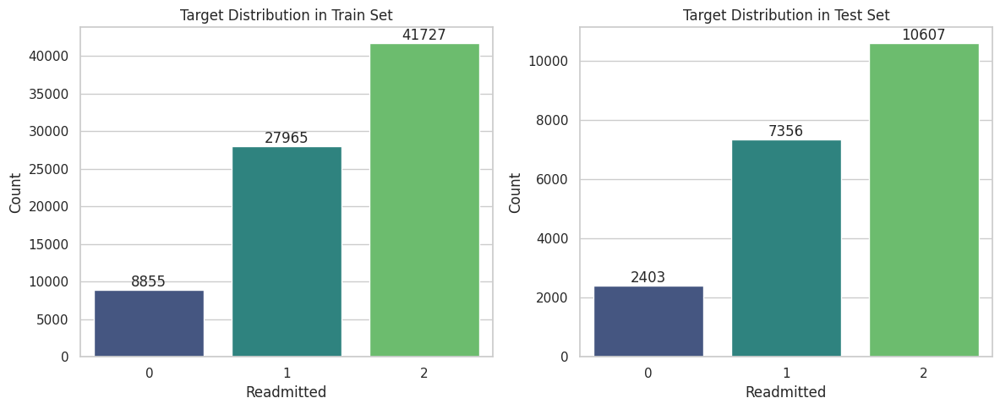

In [89]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Distribution in Train Set
sns.countplot(x=y_train, ax=axes[0], palette='viridis')
axes[0].set_title('Target Distribution in Train Set')
axes[0].set_xlabel('Readmitted')
axes[0].set_ylabel('Count')
# axes[0].set_xticklabels(['<30', '>30', 'NO'])  # Mappa visiva
for container in axes[0].containers:
    axes[0].bar_label(container)

# Distribution in Test Set
sns.countplot(x=y_test, ax=axes[1], palette='viridis')
axes[1].set_title('Target Distribution in Test Set')
axes[1].set_xlabel('Readmitted')
axes[1].set_ylabel('Count')
# axes[1].set_xticklabels(['<30', '>30', 'NO'])  # Mappa visiva
for container in axes[1].containers:
    axes[1].bar_label(container)

plt.tight_layout()
plt.show()


## 5.3 - Scaling

In [90]:
from sklearn.preprocessing import StandardScaler

# Columns that need to be scaled
cols_to_scale = ['time_in_hospital', 'num_lab_procedures', 'num_procedures',
                 'num_medications', 'number_outpatient', 'number_emergency',
                 'number_inpatient', 'number_diagnoses']

# Crea copie per evitare di modificare gli originali
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

# Inizializza lo scaler
scaler = StandardScaler()

# Fit solo sul training, trasformazione su entrambi
X_train_scaled[cols_to_scale] = scaler.fit_transform(X_train[cols_to_scale])
X_test_scaled[cols_to_scale] = scaler.transform(X_test[cols_to_scale])

# 6 - Model Training

## 6.1 - Baseline

In [ ]:
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.multiclass import OneVsRestClassifier

baseline_model = OneVsRestClassifier(
    LogisticRegression(random_state=12345, max_iter=1000)
)

baseline_model.fit(X_train_enc, y_train_enc)

OneVsRestClassifier(estimator=LogisticRegression(max_iter=1000,
                                                 random_state=12345))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def print_classification_metrics(y_true, y_pred, label):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    print(f"\nPerformance su {label}")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision (weighted): {precision:.4f}")
    print(f"Recall (weighted): {recall:.4f}")
    print(f"F1-score (weighted): {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=le.classes_))

    # --- CONFUSION MATRIX ---
    cm = confusion_matrix(y_true, y_pred)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Confusion Matrix Assoluta
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=le.classes_, yticklabels=le.classes_, ax=axes[0])
    axes[0].set_title("Confusion Matrix (Absolute)")
    axes[0].set_xlabel("Predicted")
    axes[0].set_ylabel("True")

    # Confusion Matrix Normalizzata
    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=le.classes_, yticklabels=le.classes_, ax=axes[1])
    axes[1].set_title("Confusion Matrix (Normalized)")
    axes[1].set_xlabel("Predicted")
    axes[1].set_ylabel("True")

    plt.tight_layout()
    plt.show()

In [ ]:
# from sklearn.utils import resample
# from sklearn.metrics import accuracy_score, f1_score, recall_score
# import numpy as np

# def bootstrap_evaluation(model, X, y, label_encoder, n_iterations=1000, random_state=42):
#     np.random.seed(random_state)

#     acc_list, f1_list = [], []
#     recall_less30, recall_more30, recall_no = [], [], []

#     for _ in range(n_iterations):
#         X_resampled, y_resampled = resample(X, y)
#         y_pred = model.predict(X_resampled)

#         acc_list.append(accuracy_score(y_resampled, y_pred))
#         f1_list.append(f1_score(y_resampled, y_pred, average='weighted'))

#         recalls = recall_score(
#             y_resampled, y_pred, average=None,
#             labels=label_encoder.transform(['<30', '>30', 'NO'])
#         )

#         recall_less30.append(recalls[0])
#         recall_more30.append(recalls[1])
#         recall_no.append(recalls[2])

#     print(f"\nBootstrap Results ({n_iterations} iterations):")
#     print(f"Accuracy: {np.mean(acc_list):.4f} ± {np.std(acc_list):.4f}")
#     print(f"F1-score (weighted): {np.mean(f1_list):.4f} ± {np.std(f1_list):.4f}")
#     print(f"Recall <30: {np.mean(recall_less30):.4f} ± {np.std(recall_less30):.4f}")
#     print(f"Recall >30: {np.mean(recall_more30):.4f} ± {np.std(recall_more30):.4f}")
#     print(f"Recall NO: {np.mean(recall_no):.4f} ± {np.std(recall_no):.4f}")


In [ ]:

from sklearn.utils import resample
from sklearn.metrics import accuracy_score, f1_score, recall_score
import numpy as np

def ci_interval(data, alpha=0.05):
    lower = np.percentile(data, 100 * alpha / 2)
    upper = np.percentile(data, 100 * (1 - alpha / 2))
    return lower, upper

def bootstrap_evaluation(model, X, y, label_encoder, n_iterations=1000, random_state=42):
    np.random.seed(random_state)

    acc_list, f1_list = [], []
    recall_less30, recall_more30, recall_no = [], [], []

    for _ in range(n_iterations):
        X_resampled, y_resampled = resample(X, y)
        y_pred = model.predict(X_resampled)

        acc_list.append(accuracy_score(y_resampled, y_pred))
        f1_list.append(f1_score(y_resampled, y_pred, average='weighted'))

        recalls = recall_score(
            y_resampled, y_pred, average=None,
            labels=label_encoder.transform(['<30', '>30', 'NO'])
        )

        recall_less30.append(recalls[0])
        recall_more30.append(recalls[1])
        recall_no.append(recalls[2])

    # Compute mean and 95% confidence intervals
    metrics = {
        "Accuracy": acc_list,
        "F1-score (weighted)": f1_list,
        "Recall <30": recall_less30,
        "Recall >30": recall_more30,
        "Recall NO": recall_no
    }

    print(f"\nBootstrap Results ({n_iterations} iterations):")
    for name, values in metrics.items():
        mean_val = np.mean(values)
        lower, upper = ci_interval(values)
        print(f"{name}: {mean_val:.4f} (95% CI: {lower:.4f} - {upper:.4f})")

In [ ]:
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
import numpy as np

def evaluate_cv_model(X, y, model, cv=5, random_state=42):

    scoring = {
        'accuracy': 'accuracy',
        'precision_weighted': 'precision_weighted',
        'recall_weighted': 'recall_weighted',
        'f1_weighted': 'f1_weighted'
    }

    results = cross_validate(model, X, y, cv=cv, scoring=scoring, return_train_score=False)

    print(f"Cross-Validation Results ({cv}-fold):")
    for metric in scoring.keys():
        mean = np.mean(results[f'test_{metric}'])
        std = np.std(results[f'test_{metric}'])
        print(f"{metric.replace('_', ' ').title()}: {mean:.4f} ± {std:.4f}")

    return results

In [ ]:
import shap
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

def shap_tree_analysis(model, X_test, y_test, class_names=None, label_encoder=None, sample_size=10, random_state=42):
    # Sample a subset for SHAP computation (faster)
    sample = X_test.sample(sample_size, random_state=random_state)

    # Get positional indices from sample
    pos_indices = X_test.index.get_indexer(sample.index)

    # Use those to index into the NumPy array
    y_sample = y_test[pos_indices]

    print("Fitting SHAP explainer...")
    explainer = shap.TreeExplainer(model, feature_perturbation="tree_path_dependent", approximate=True)
    shap_values = explainer.shap_values(sample)

    # SHAP Summary Plots (global feature importance)
    print("\nSHAP Summary Plot (bar)...")
    shap.summary_plot(shap_values, sample, plot_type="bar")
    print("\nSHAP Summary Plot (beeswarm)...")
    shap.summary_plot(shap_values, sample)

    # Get predictions
    y_pred = model.predict(sample)

    # Find one correct and one incorrect prediction
    correct_idx = np.where(y_pred == y_sample)[0][0]
    incorrect_idx = np.where(y_pred != y_sample)[0][0]

    print(f"\nCorrectly classified sample index: {correct_idx}")
    print(f"Incorrectly classified sample index: {incorrect_idx}")

    # Utility to decode class
    def decode(cl):
        return label_encoder.inverse_transform([cl])[0] if label_encoder else cl

    for idx, kind in zip([correct_idx, incorrect_idx], ["Correct", "Incorrect"]):
        print(f"\n{kind} Prediction Explanation for Index {idx}")
        instance = sample.iloc[idx]
        shap.initjs()

        predicted_class = model.predict(sample.iloc[[idx]])[0]
        true_class = y_sample[idx]
        proba = model.predict_proba(sample.iloc[[idx]])[0]

        print(f"Predicted class: {decode(predicted_class)}")
        print(f"True class: {decode(true_class)}")
        print(f"Prediction probabilities: {proba}")

        # Plot force plot for each class
        n_classes = shap_values.shape[2]
        for i in range(n_classes):
            class_label = decode(i)
            print(f"Force plot for class: {class_label}")
            decimals = 2                    # <- choose how many digits to keep

            shap.force_plot(
            base_value   = np.round(explainer.expected_value[i], decimals),
            shap_values  = np.round(shap_values[idx, :, i], decimals),
            features     = np.round(instance, decimals),
            feature_names= instance.index.tolist(),
            matplotlib   = True,
            figsize      = (25, 4),
            text_rotation= 45
            )




In [ ]:
import shap
import numpy as np

def shap_linear_analysis_ovr(model, X_test, y_test, label_encoder=None, sample_size=100, random_state=42):
    sample = X_test.sample(sample_size, random_state=random_state)
    pos_indices = X_test.index.get_indexer(sample.index)
    y_sample = y_test[pos_indices]

    estimators = model.estimators_  # list of binary logistic regression models (one per class)
    n_classes = len(estimators)

    print("Fitting SHAP LinearExplainer per binary classifier...")
    shap_values_per_class = []
    expected_values = []

    for i, est in enumerate(estimators):
        print(f"Explaining class {i}...")
        explainer = shap.LinearExplainer(est, sample, feature_perturbation="interventional")
        shap_vals = explainer.shap_values(sample)
        shap_values_per_class.append(shap_vals)
        expected_values.append(explainer.expected_value)

    # Convert to numpy array of shape (n_classes, n_samples, n_features)
    shap_values_per_class = np.array(shap_values_per_class)
    expected_values = np.array(expected_values)

    y_pred = model.predict(sample)

    def decode(cl):
        return label_encoder.inverse_transform([cl])[0] if label_encoder else cl

    # Example: plot force plot for first sample correct/incorrect classification
    correct_idx = np.where(y_pred == y_sample)[0][0]
    incorrect_idx = np.where(y_pred != y_sample)[0][0]

    for idx, kind in zip([correct_idx, incorrect_idx], ["Correct", "Incorrect"]):
        print(f"\n{kind} Prediction Explanation for Index {idx}")
        instance = sample.iloc[idx]
        shap.initjs()

        predicted_class = model.predict(sample.iloc[[idx]])[0]
        true_class = y_sample[idx]
        proba = model.predict_proba(sample.iloc[[idx]])[0]

        print(f"Predicted class: {decode(predicted_class)}")
        print(f"True class: {decode(true_class)}")
        print(f"Prediction probabilities: {proba}")

        for i in range(n_classes):
            print(f"Force plot for class: {decode(i)}")
            shap.force_plot(
                base_value=expected_values[i],
                shap_values=shap_values_per_class[i][idx],
                features=instance,
                feature_names=instance.index.tolist(),
                show=True,
                figsize=(30, 4),
                text_rotation=30,
                matplotlib=True
            )


In [ ]:
y_pred_train = baseline_model.predict(X_train_enc)
y_pred_test = baseline_model.predict(X_test_enc)

print_classification_metrics(y_train_enc, y_pred_train, label="Training set")
print_classification_metrics(y_test_enc, y_pred_test, label="Test set")

ValueError: The feature names should match those that were passed during fit.
Feature names seen at fit time, yet now missing:
- acetohexamide_Yes
- glimepiride-pioglitazone_Yes
- metformin-pioglitazone_Yes
- metformin-rosiglitazone_Yes
- payer_code_FR
- ...


In [ ]:
cv_results = evaluate_cv_model(X_train_scaled, y_train,model=baseline_model, cv=5)

Cross-Validation Results (5-fold):
Accuracy: 0.5547 ± 0.0199
Precision Weighted: 0.5302 ± 0.0351
Recall Weighted: 0.5547 ± 0.0199
F1 Weighted: 0.5017 ± 0.0207


In [ ]:
bootstrap_evaluation(model=baseline_model, X=X_test_scaled, y=y_test, label_encoder=le, n_iterations=100)


Bootstrap Results (100 iterations):
Accuracy: 0.5696 (95% CI: 0.5631 - 0.5768)
F1-score (weighted): 0.5124 (95% CI: 0.5051 - 0.5206)
Recall <30: 0.0004 (95% CI: 0.0000 - 0.0012)
Recall >30: 0.3471 (95% CI: 0.3381 - 0.3578)
Recall NO: 0.8527 (95% CI: 0.8453 - 0.8590)


Fitting SHAP LinearExplainer per binary classifier...
Explaining class 0...
Explaining class 1...
Explaining class 2...

Correct Prediction Explanation for Index 0


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


Predicted class: NO
True class: NO
Prediction probabilities: [0.09128042 0.32449566 0.58422392]
Force plot for class: <30


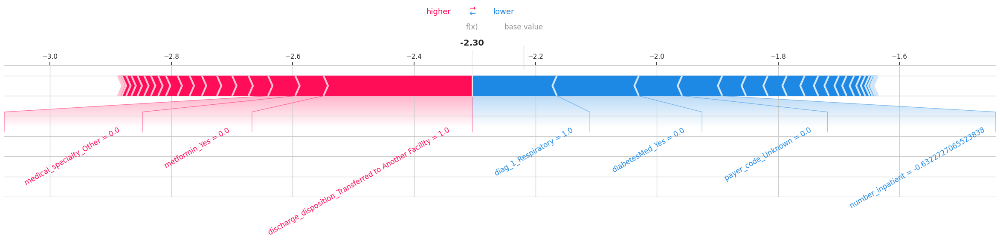

Force plot for class: >30


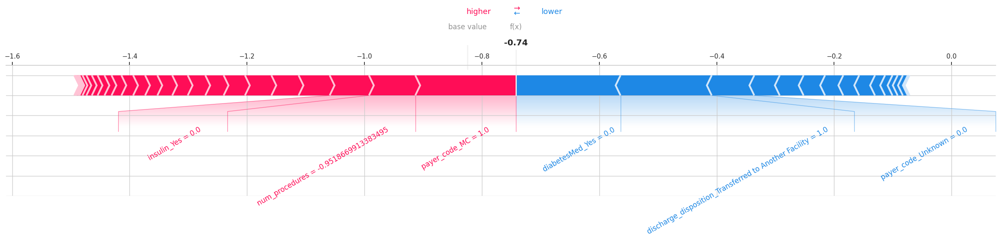

Force plot for class: NO


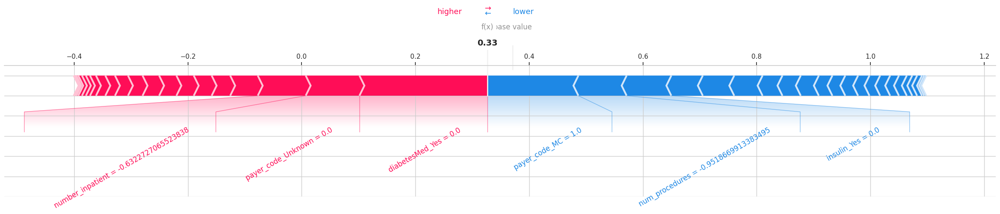


Incorrect Prediction Explanation for Index 2


Predicted class: NO
True class: >30
Prediction probabilities: [0.13716784 0.35613126 0.5067009 ]
Force plot for class: <30


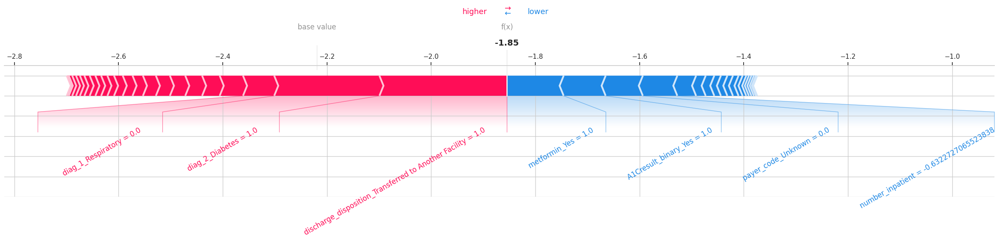

Force plot for class: >30


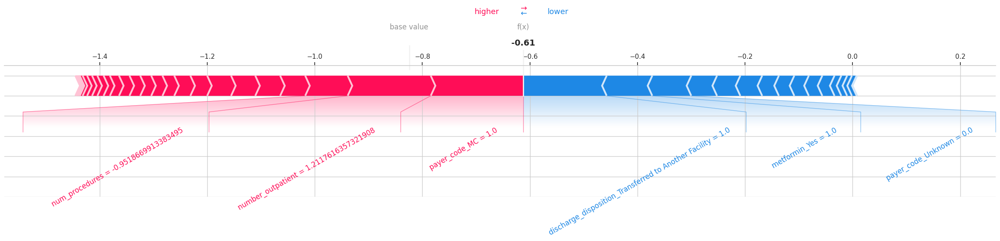

Force plot for class: NO


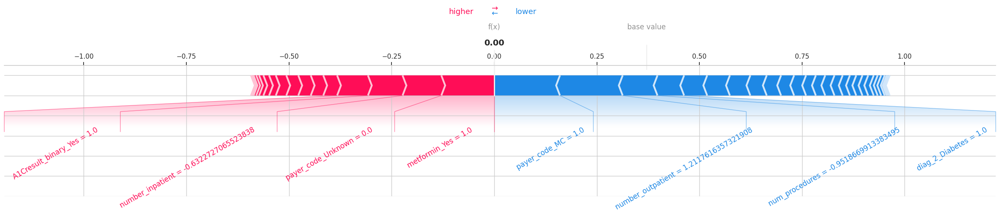

In [ ]:
shap_linear_analysis_ovr(
    model=baseline_model,
    X_test=X_test_scaled,
    y_test=y_test,
    label_encoder=le,  # optional
    #class_names=['<30', '>30', 'NO'],
    sample_size=10,
    random_state=42
)

## 6.2 - LogReg balanced

In [ ]:
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.multiclass import OneVsRestClassifier

logreg_balanced = OneVsRestClassifier(
    LogisticRegression(random_state=12345, max_iter=1000, class_weight='balanced')
)

logreg_balanced.fit(X_train_scaled, y_train)


OneVsRestClassifier(estimator=LogisticRegression(class_weight='balanced',
                                                 max_iter=1000,
                                                 random_state=12345))


Performance su Training set
Accuracy: 0.5139
Precision (weighted): 0.5417
Recall (weighted): 0.5139
F1-score (weighted): 0.5235

Classification Report:
              precision    recall  f1-score   support

         <30       0.19      0.34      0.25      8855
         >30       0.48      0.39      0.43     27965
          NO       0.65      0.64      0.65     41727

    accuracy                           0.51     78547
   macro avg       0.44      0.45      0.44     78547
weighted avg       0.54      0.51      0.52     78547



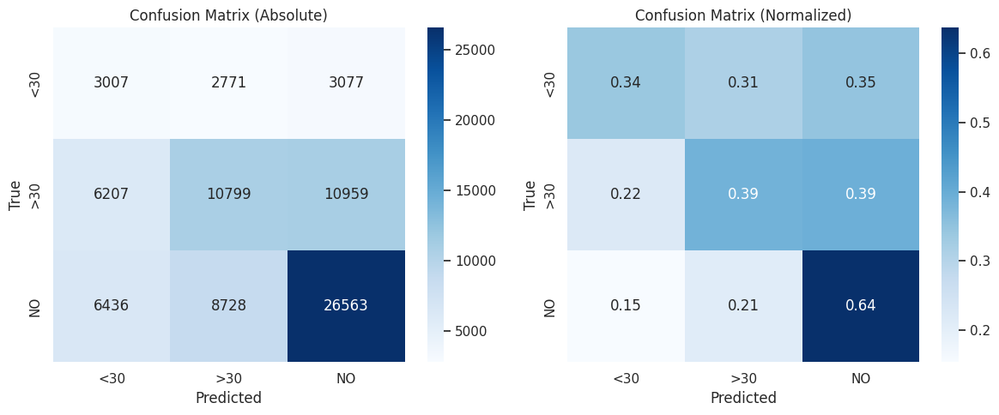


Performance su Test set
Accuracy: 0.5042
Precision (weighted): 0.5312
Recall (weighted): 0.5042
F1-score (weighted): 0.5133

Classification Report:
              precision    recall  f1-score   support

         <30       0.20      0.34      0.25      2403
         >30       0.48      0.38      0.42      7356
          NO       0.64      0.63      0.63     10607

    accuracy                           0.50     20366
   macro avg       0.44      0.45      0.44     20366
weighted avg       0.53      0.50      0.51     20366



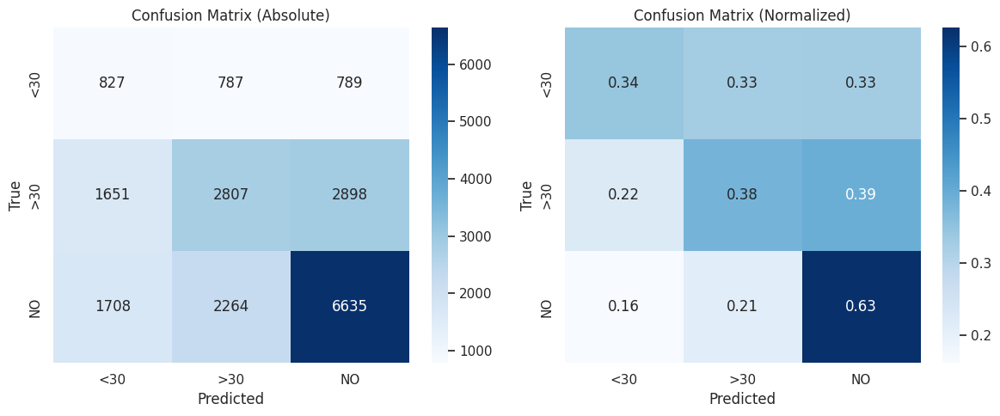

In [ ]:
y_pred_train = logreg_balanced.predict(X_train_scaled)
y_pred_test = logreg_balanced.predict(X_test_scaled)

print_classification_metrics(y_train, y_pred_train, label="Training set")
print_classification_metrics(y_test, y_pred_test, label="Test set")

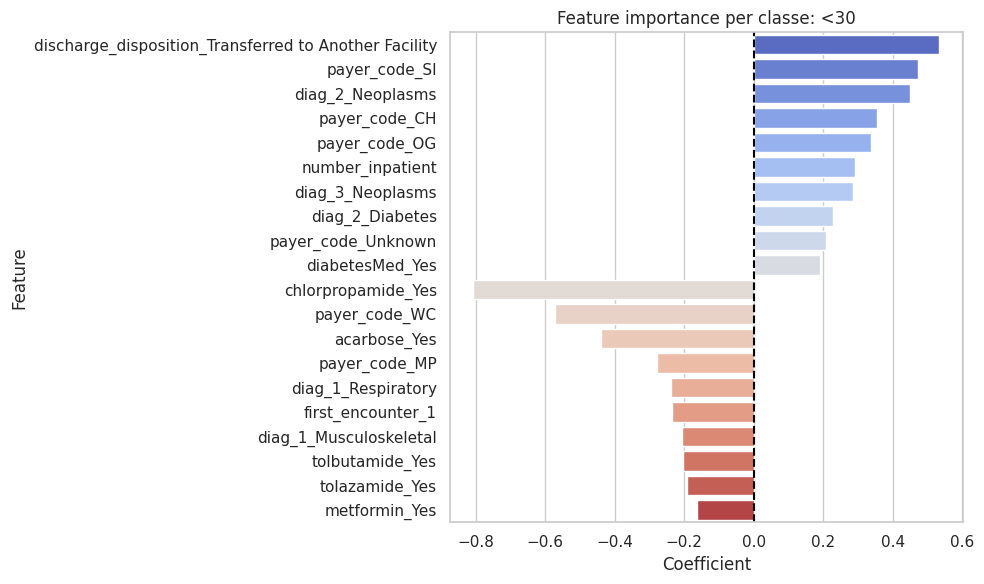

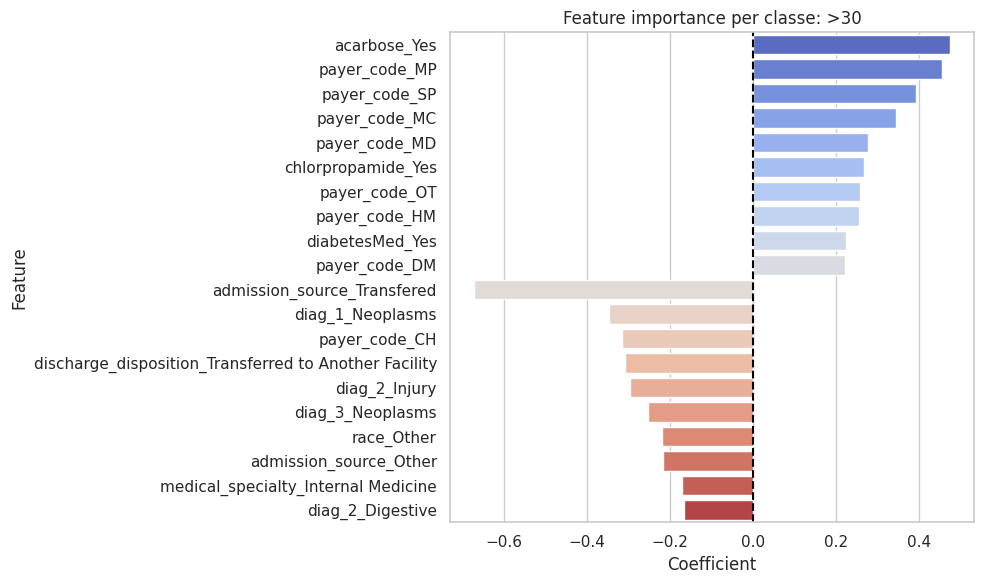

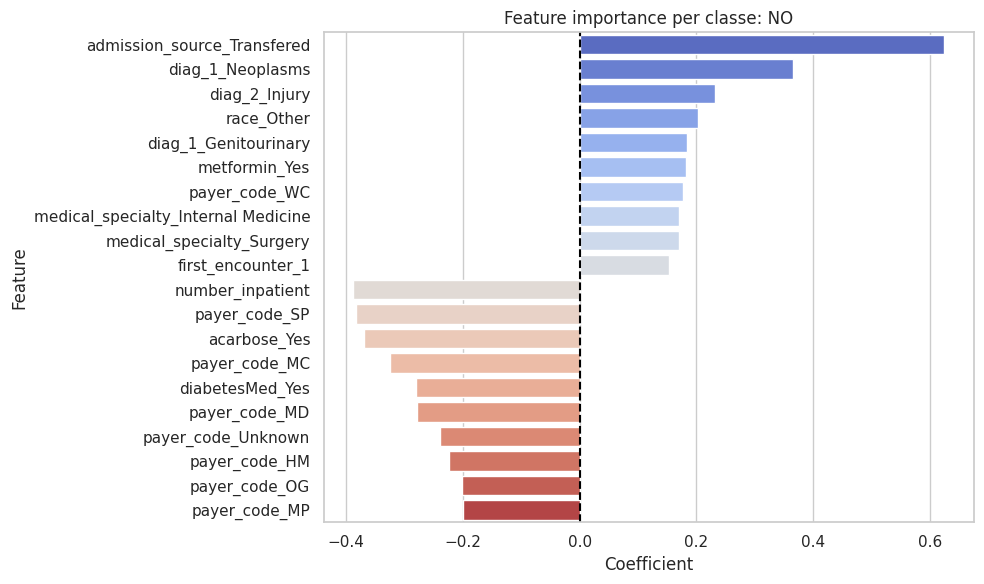

In [ ]:
coefs = logreg_balanced.estimators_
feature_names = X_train_scaled.columns
class_names = le.inverse_transform([0, 1, 2])
coef_dfs = []

for i, estimator in enumerate(coefs):
    class_label = class_names[i]
    coef_df = pd.DataFrame({
        'Feature': feature_names,
        'Coefficient': estimator.coef_[0]
    }).sort_values(by='Coefficient', ascending=False)

    coef_df['Class'] = class_label
    coef_dfs.append(coef_df)

all_coefs_df = pd.concat(coef_dfs)


for class_label in class_names:
    subset = all_coefs_df[all_coefs_df['Class'] == class_label]
    top_features = pd.concat([
        subset.nlargest(10, 'Coefficient'),
        subset.nsmallest(10, 'Coefficient')
    ])

    plt.figure(figsize=(10, 6))
    sns.barplot(
    data=top_features,
    x='Coefficient',
    y='Feature',
    hue='Feature',
    palette='coolwarm',
    legend=False)

    plt.title(f'Feature importance per classe: {class_label}')
    plt.axvline(0, color='black', linestyle='--')
    plt.tight_layout()
    plt.show()


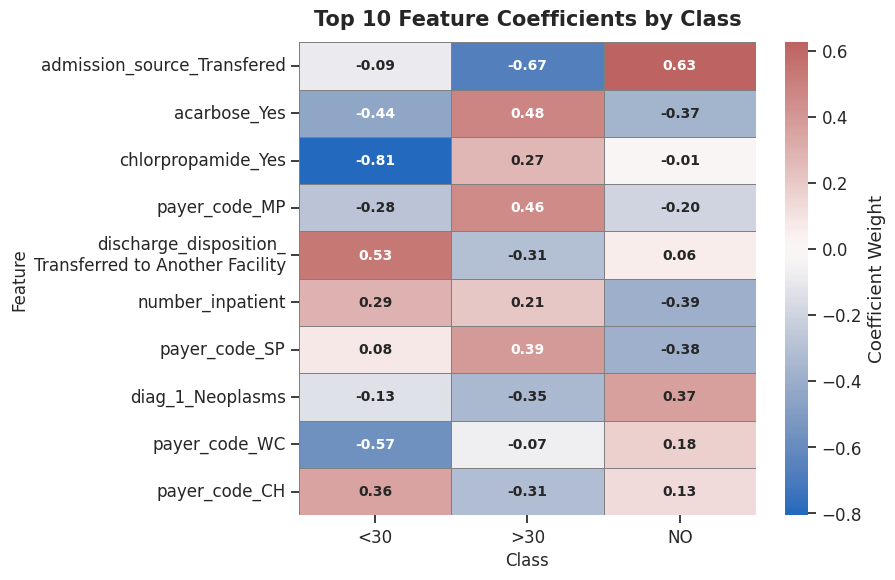

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Costruisci il DataFrame dei coefficienti
coefficienti_df = pd.DataFrame()

# Etichette leggibili per le classi
class_labels = {0: "<30", 1: ">30", 2: "NO"}

for i, estimator in enumerate(logreg_balanced.estimators_):
    class_name = class_labels[logreg_balanced.classes_[i]]
    coeffs = estimator.coef_[0]
    coefficienti_df[class_name] = pd.Series(coeffs, index=X_train_scaled.columns)

coefficienti_df = coefficienti_df.T  # righe = classi, colonne = feature

# Selezione delle top 5 feature per importanza media assoluta
mean_abs_importance = coefficienti_df.abs().mean(axis=0)
top_features = mean_abs_importance.sort_values(ascending=False).head(10).index

# Subset dei coefficienti solo per le top 5 feature
heatmap_data_top5 = coefficienti_df[top_features].T  # righe = feature, colonne = classi


# Wrapping manuale solo per etichette troppo lunghe
wrapped_index = []
for label in heatmap_data_top5.index:
    if label == "discharge_disposition_Transferred to Another Facility":
        label = "discharge_disposition_\nTransferred to Another Facility"
    wrapped_index.append(label)

heatmap_data_top5.index = wrapped_index

# Plot della heatmap
plt.figure(figsize=(9, 6))
sns.set(style="ticks", font_scale=1.1)

ax = sns.heatmap(
    heatmap_data_top5,
    cmap="vlag",
    center=0,
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={'label': 'Coefficient Weight'},
    annot_kws={"fontsize": 10, "fontweight": 'bold'}
)

plt.title("Top 10 Feature Coefficients by Class", fontsize=15, weight='bold', pad=12)
plt.xlabel("Class", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.xticks(rotation=0)
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()



In [ ]:
cv_results = evaluate_cv_model(X_train_scaled, y_train,model=logreg_balanced, cv=5)

Cross-Validation Results (5-fold):
Accuracy: 0.4795 ± 0.0252
Precision Weighted: 0.5116 ± 0.0241
Recall Weighted: 0.4795 ± 0.0252
F1 Weighted: 0.4857 ± 0.0186


In [ ]:
bootstrap_evaluation(model=logreg_balanced, X=X_test_scaled, y=y_test, label_encoder=le, n_iterations=100)


Bootstrap Results (100 iterations):
Accuracy: 0.5042 (95% CI: 0.4960 - 0.5108)
F1-score (weighted): 0.5135 (95% CI: 0.5050 - 0.5203)
Recall <30: 0.3438 (95% CI: 0.3217 - 0.3631)
Recall >30: 0.3824 (95% CI: 0.3710 - 0.3961)
Recall NO: 0.6250 (95% CI: 0.6164 - 0.6340)


Fitting SHAP LinearExplainer per binary classifier...
Explaining class 0...
Explaining class 1...
Explaining class 2...

Correct Prediction Explanation for Index 0


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


Predicted class: NO
True class: NO
Prediction probabilities: [0.3042111  0.31802422 0.37776468]
Force plot for class: <30


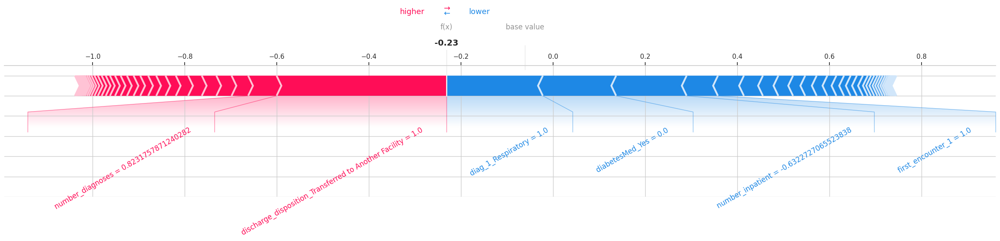

Force plot for class: >30


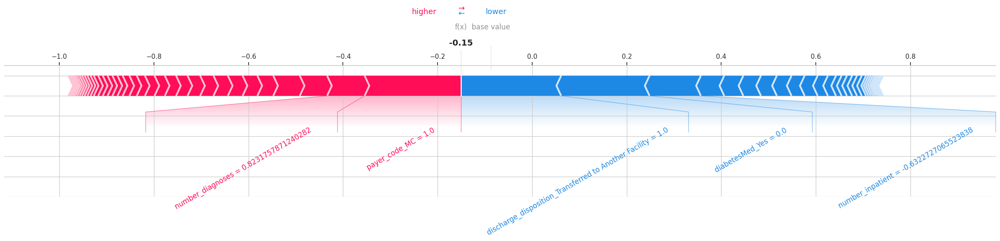

Force plot for class: NO


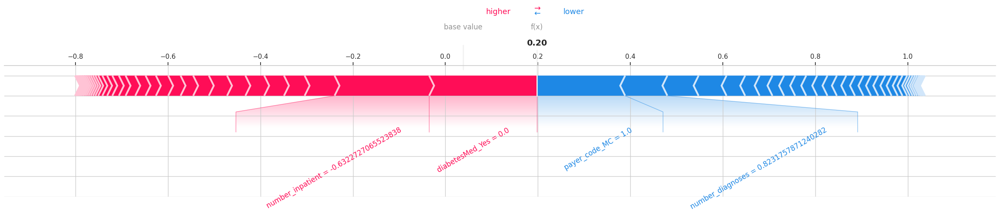


Incorrect Prediction Explanation for Index 2


Predicted class: <30
True class: >30
Prediction probabilities: [0.37558181 0.32259284 0.30182534]
Force plot for class: <30


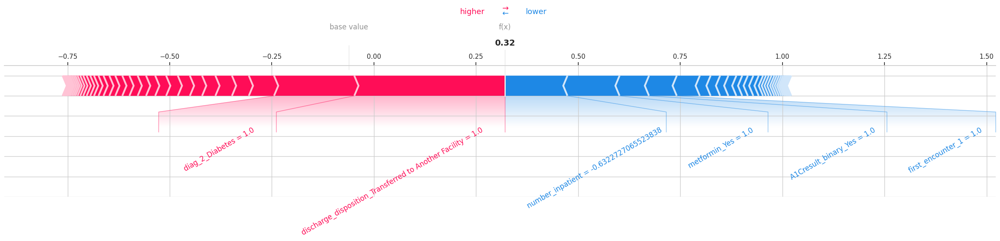

Force plot for class: >30


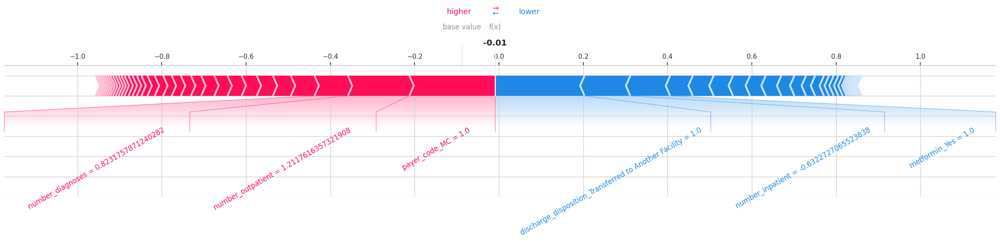

Force plot for class: NO


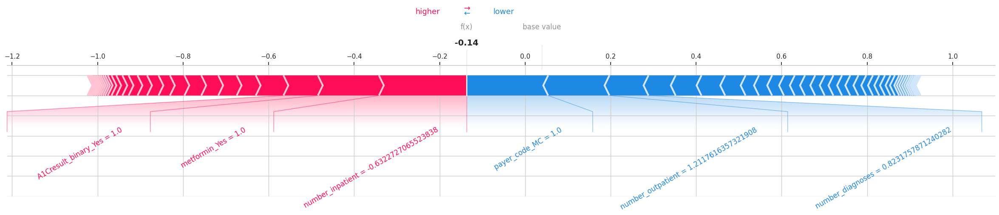

In [ ]:
shap_linear_analysis_ovr(
    model=logreg_balanced,
    X_test=X_test_scaled,
    y_test=y_test,
    label_encoder=le,  # optional
    #class_names=['<30', '>30', 'NO'],
    sample_size=100,
    random_state=42
)

## 6.3 - Random Forest balanced

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(
    n_estimators=500,
    max_depth=20,
    min_samples_leaf=5,
    class_weight='balanced',
    max_features='sqrt',
    random_state=42,
    n_jobs=-1
)

rf_model.fit(X_train_scaled, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=20,
                       min_samples_leaf=5, n_estimators=500, n_jobs=-1,
                       random_state=42)


Performance su Training set
Accuracy: 0.7368
Precision (weighted): 0.7373
Recall (weighted): 0.7368
F1-score (weighted): 0.7366

Classification Report:
              precision    recall  f1-score   support

         <30       0.68      0.78      0.73      8855
         >30       0.70      0.68      0.69     27965
          NO       0.77      0.77      0.77     41727

    accuracy                           0.74     78547
   macro avg       0.72      0.74      0.73     78547
weighted avg       0.74      0.74      0.74     78547



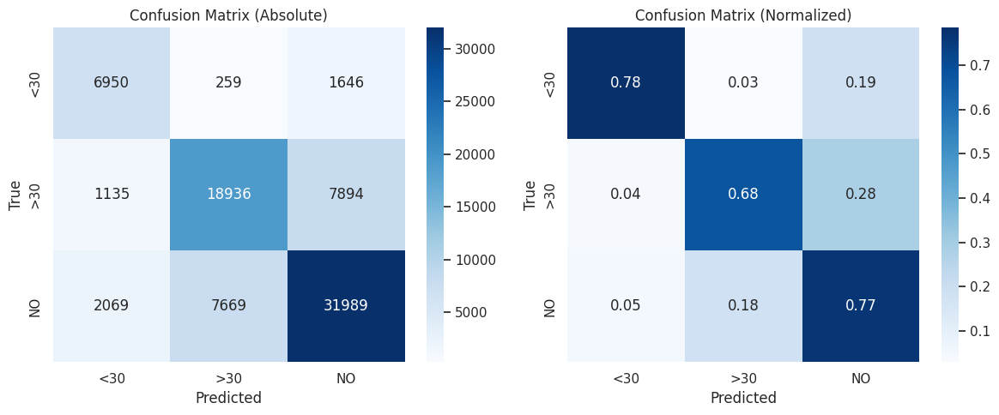


Performance su Test set
Accuracy: 0.5455
Precision (weighted): 0.5384
Recall (weighted): 0.5455
F1-score (weighted): 0.5416

Classification Report:
              precision    recall  f1-score   support

         <30       0.25      0.22      0.24      2403
         >30       0.48      0.46      0.47      7356
          NO       0.64      0.67      0.66     10607

    accuracy                           0.55     20366
   macro avg       0.46      0.45      0.46     20366
weighted avg       0.54      0.55      0.54     20366



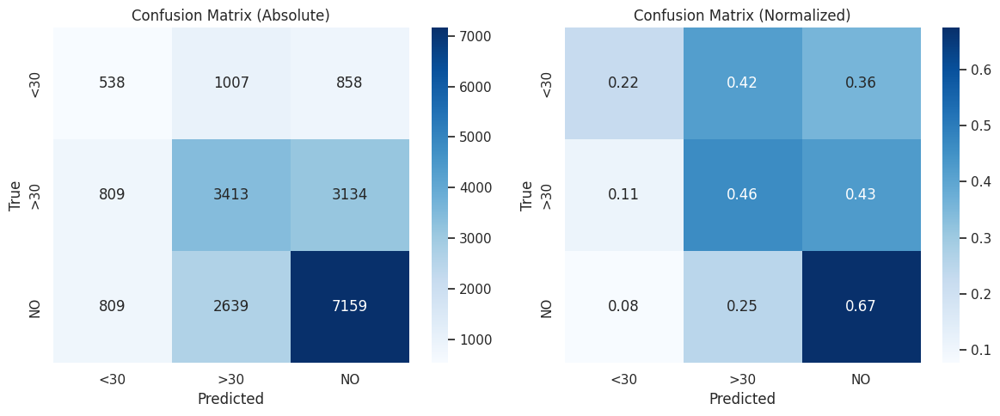

In [ ]:
y_pred_train = rf_model.predict(X_train_scaled)
y_pred_test = rf_model.predict(X_test_scaled)

print_classification_metrics(y_train, y_pred_train, label="Training set")
print_classification_metrics(y_test, y_pred_test, label="Test set")

In [ ]:
cv_results = evaluate_cv_model(X_train_scaled, y_train,model=rf_model, cv=5)

Cross-Validation Results (5-fold):
Accuracy: 0.5238 ± 0.0209
Precision Weighted: 0.5222 ± 0.0194
Recall Weighted: 0.5238 ± 0.0209
F1 Weighted: 0.5164 ± 0.0166


In [ ]:
bootstrap_evaluation(model=rf_model, X=X_test_scaled, y=y_test, label_encoder=le, n_iterations=100)


Bootstrap Results (100 iterations):
Accuracy: 0.5455 (95% CI: 0.5384 - 0.5537)
F1-score (weighted): 0.5417 (95% CI: 0.5339 - 0.5497)
Recall <30: 0.2242 (95% CI: 0.2113 - 0.2391)
Recall >30: 0.4639 (95% CI: 0.4507 - 0.4767)
Recall NO: 0.6748 (95% CI: 0.6659 - 0.6827)


<ipython-input-350-1965516040>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


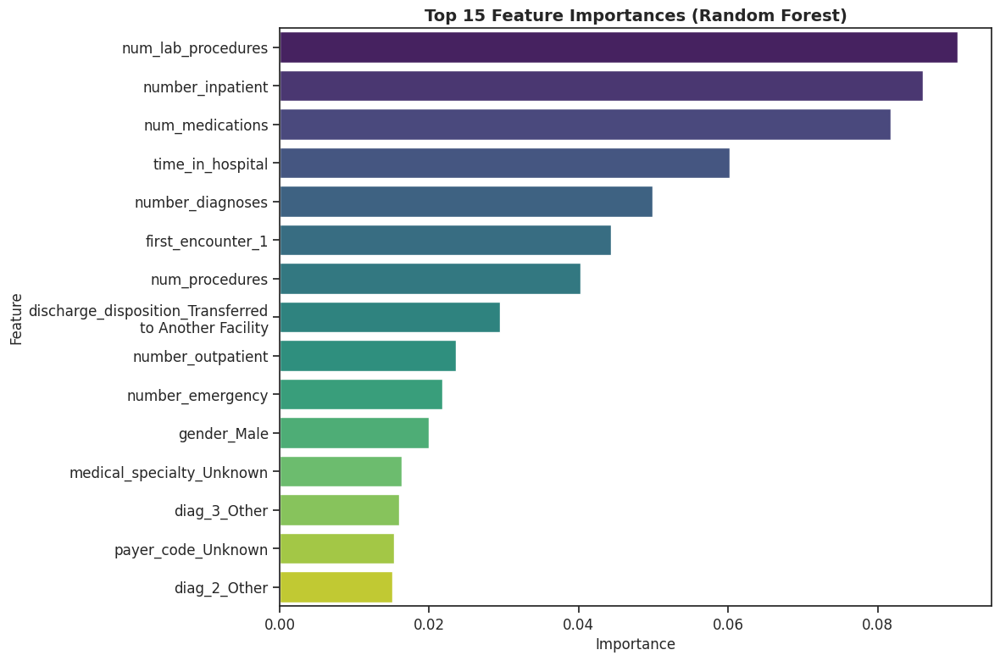

In [ ]:
import textwrap
import matplotlib.pyplot as plt
import seaborn as sns

# Calcolo e selezione delle top 20 feature
importances = rf_model.feature_importances_
feature_names = X_train_scaled.columns
feat_series = pd.Series(importances, index=feature_names)
top_feats = feat_series.sort_values(ascending=False).head(15).to_frame(name='Importance')
top_feats['Feature'] = top_feats.index



# Funzione che manda a capo solo tra le parole
def wrap_labels(label, max_len=25):
    return '\n'.join(textwrap.wrap(label, max_len, break_long_words=False, replace_whitespace=False))

# Applica il wrapping solo se necessario
top_feats['Wrapped_Feature'] = top_feats['Feature'].apply(wrap_labels)

# Ordina per importanza
top_feats = top_feats.sort_values('Importance', ascending=False)

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(
    data=top_feats,
    x='Importance',
    y='Wrapped_Feature',
    palette='viridis'
)

plt.title("Top 15 Feature Importances (Random Forest)", fontsize=14, weight='bold')
plt.xlabel("Importance", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.tight_layout()
plt.show()



Fitting SHAP explainer...

SHAP Summary Plot (bar)...


<ipython-input-330-720452388>:22: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, sample, plot_type="bar")


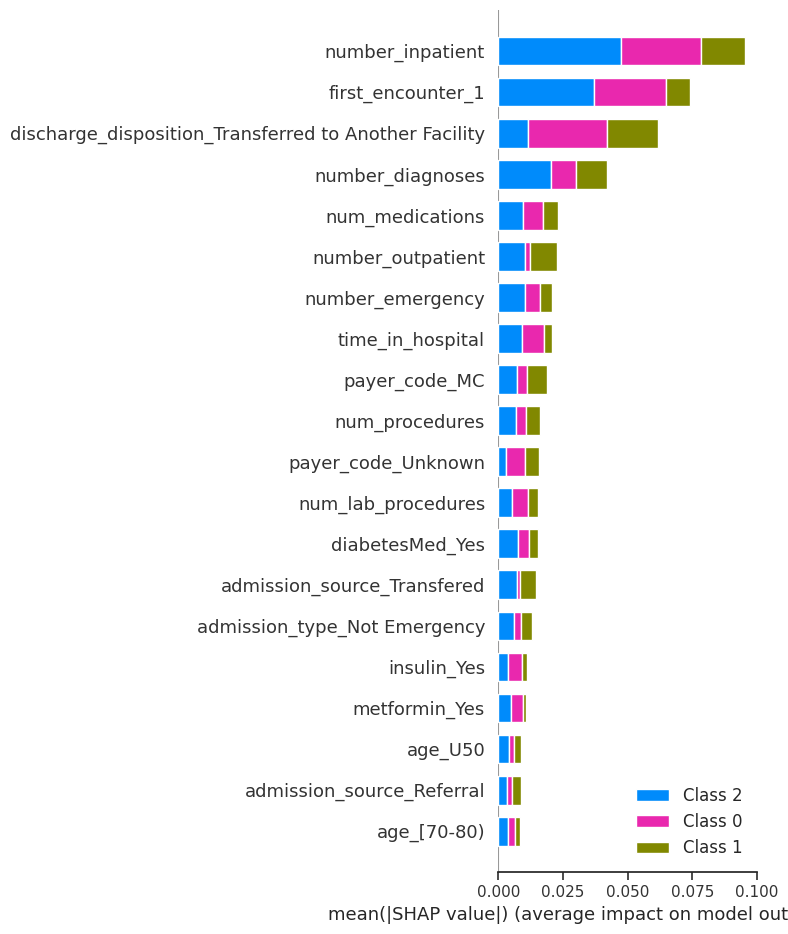


SHAP Summary Plot (beeswarm)...


<ipython-input-330-720452388>:24: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, sample)
/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:726: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  summary_legacy(
/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:746: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  summary_legacy(
/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:746: FutureWarn

<Figure size 640x480 with 0 Axes>

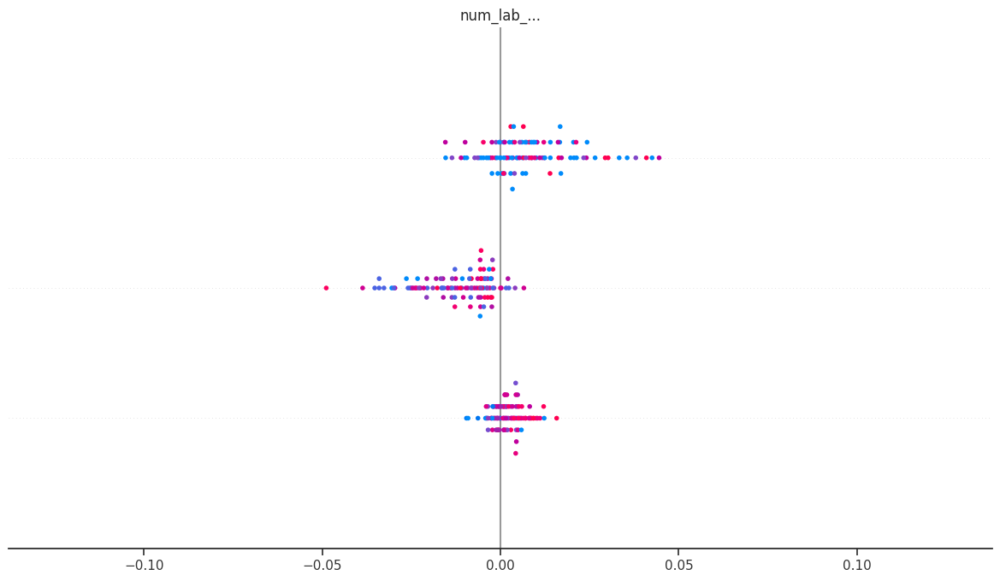


Correctly classified sample index: 0
Incorrectly classified sample index: 2

Correct Prediction Explanation for Index 0


Predicted class: NO
True class: NO
Prediction probabilities: [0.24450768 0.32341443 0.43207789]
Force plot for class: <30


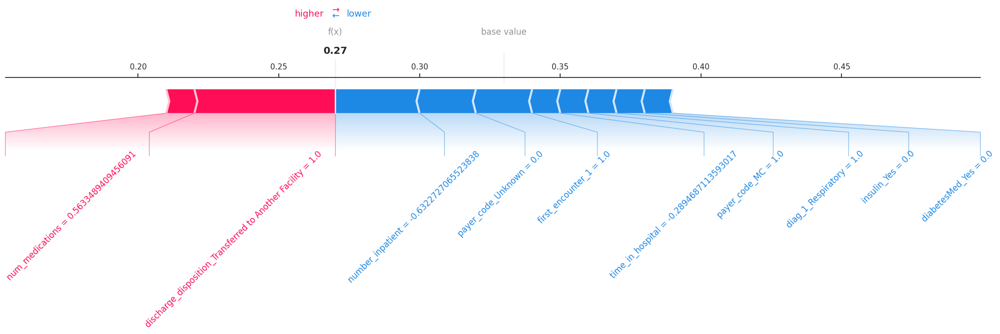

Force plot for class: >30


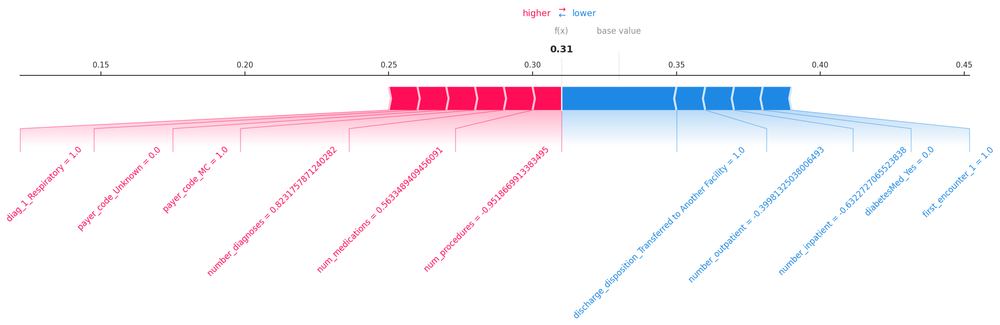

Force plot for class: NO


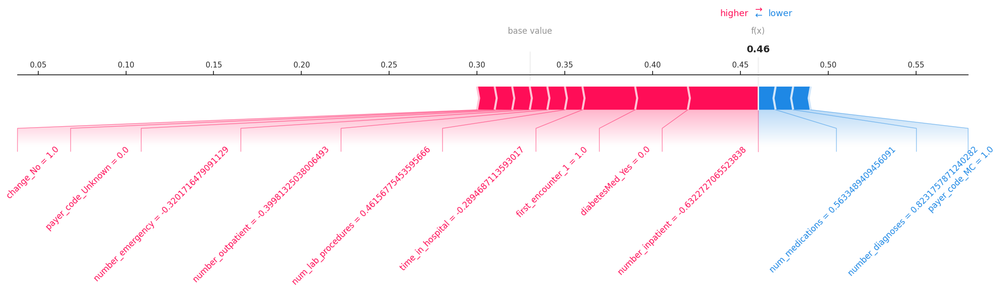


Incorrect Prediction Explanation for Index 2


Predicted class: NO
True class: >30
Prediction probabilities: [0.23278264 0.37716    0.39005736]
Force plot for class: <30


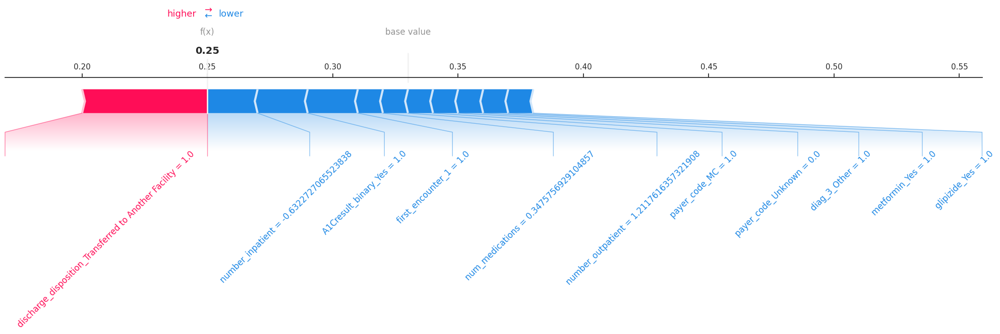

Force plot for class: >30


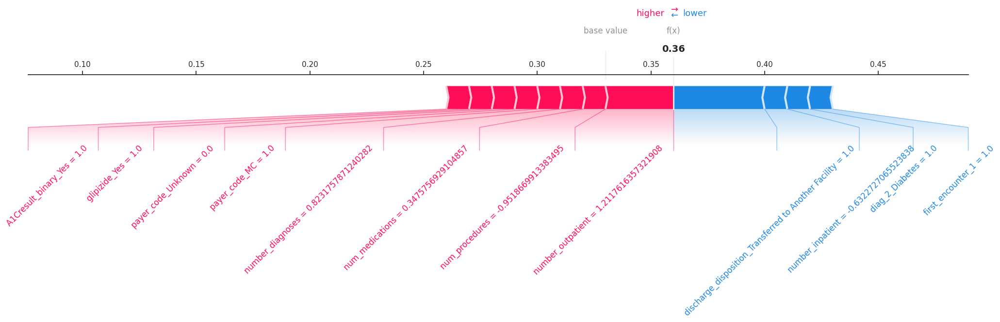

Force plot for class: NO


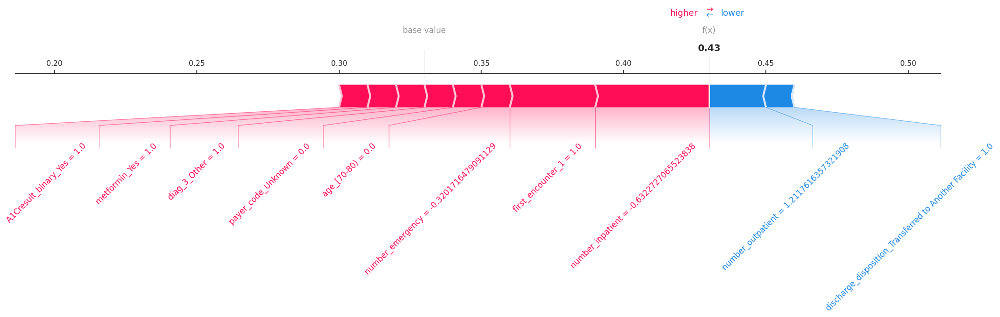

In [ ]:
shap_tree_analysis(
    model=rf_model,
    X_test=X_test_scaled,
    y_test=y_test,
    label_encoder=le,  # optional
    class_names=['<30', '>30', 'NO'],  # optional
    sample_size=100,
    random_state=42
)

## 6.4 - Random Forest with SMOTE and balanced training

In [91]:
from imblearn.over_sampling import SMOTE

# Istanza di SMOTE
smote = SMOTE(random_state=12345, sampling_strategy={0: int(np.sum(y_train==0)*3)})

# Applicazione di SMOTE solo al training set
X_train_bal, y_train_bal = smote.fit_resample(X_train_scaled, y_train)

In [92]:
X_train_bal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96257 entries, 0 to 96256
Data columns (total 91 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   time_in_hospital                                       96257 non-null  float64
 1   num_lab_procedures                                     96257 non-null  float64
 2   num_procedures                                         96257 non-null  float64
 3   num_medications                                        96257 non-null  float64
 4   number_outpatient                                      96257 non-null  float64
 5   number_emergency                                       96257 non-null  float64
 6   number_inpatient                                       96257 non-null  float64
 7   number_diagnoses                                       96257 non-null  float64
 8   race_Caucasian                                

In [103]:
 # mostra tutti i tipi di colonna

X_train_bal.select_dtypes(include='bool')  # mostra solo le booleane

#X_train_bal['is_diabetic'].value_counts(normalize=True)  # o qualsiasi colonna booleana


,race_Caucasian,race_Other,gender_Male,age_U50,age_[50-60),age_[60-70),age_[70-80),payer_code_CH,payer_code_CM,payer_code_CP,...,change_No,diabetesMed_Yes,admission_type_Not Emergency,discharge_disposition_Transferred to Another Facility,admission_source_Other,admission_source_Referral,admission_source_Transfered,A1Cresult_binary_Yes,max_glu_serum_binary_Yes,first_encounter_1
0,True,False,False,False,True,False,False,False,False,False,...,False,True,False,False,False,True,False,False,False,True
1,True,False,False,False,True,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
2,True,False,False,False,True,False,False,False,False,False,...,True,False,True,False,False,True,False,False,False,True
3,True,False,False,False,False,False,False,False,False,False,...,True,True,False,True,False,False,False,True,False,True
4,True,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96252,True,False,True,False,False,False,False,False,False,False,...,False,True,False,True,False,False,False,False,False,True
96253,True,False,False,False,False,False,True,False,False,False,...,True,True,False,False,False,True,False,False,False,True
96254,False,False,False,False,False,False,False,False,False,False,...,True,False,False,True,False,False,False,False,False,True
96255,True,False,True,False,False,True,False,False,False,False,...,False,True,True,False,False,True,False,False,False,True


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model_SMOTE = RandomForestClassifier(
    n_estimators=500,
    max_depth=20,
    min_samples_leaf=5,
    class_weight='balanced',
    max_features='sqrt',
    random_state=42,
    n_jobs=-1
)

rf_model_SMOTE.fit(X_train_bal, y_train_bal)

RandomForestClassifier(class_weight='balanced', max_depth=20,
                       min_samples_leaf=5, n_estimators=500, n_jobs=-1,
                       random_state=42)


Performance su Training set
Accuracy: 0.7746
Precision (weighted): 0.7769
Recall (weighted): 0.7746
F1-score (weighted): 0.7756

Classification Report:
              precision    recall  f1-score   support

         <30       0.90      0.85      0.87     26565
         >30       0.68      0.70      0.69     27965
          NO       0.77      0.78      0.77     41727

    accuracy                           0.77     96257
   macro avg       0.78      0.78      0.78     96257
weighted avg       0.78      0.77      0.78     96257



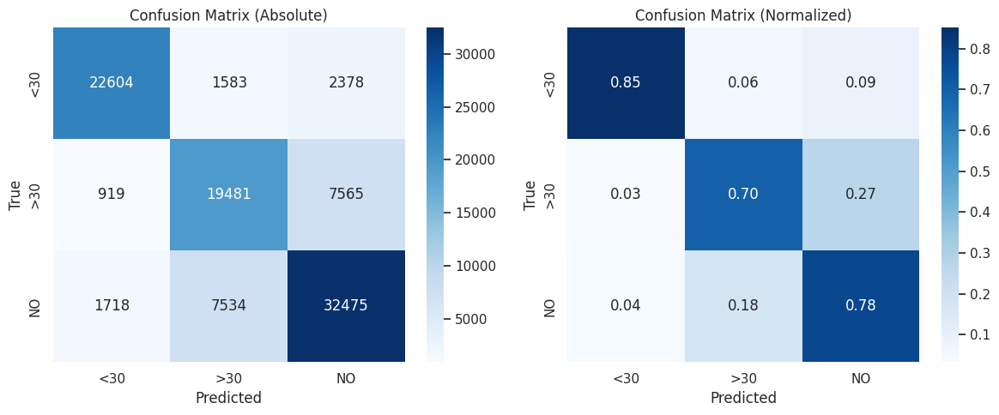


Performance su Test set
Accuracy: 0.5423
Precision (weighted): 0.5333
Recall (weighted): 0.5423
F1-score (weighted): 0.5374

Classification Report:
              precision    recall  f1-score   support

         <30       0.22      0.17      0.19      2403
         >30       0.48      0.49      0.48      7356
          NO       0.64      0.66      0.65     10607

    accuracy                           0.54     20366
   macro avg       0.45      0.44      0.44     20366
weighted avg       0.53      0.54      0.54     20366



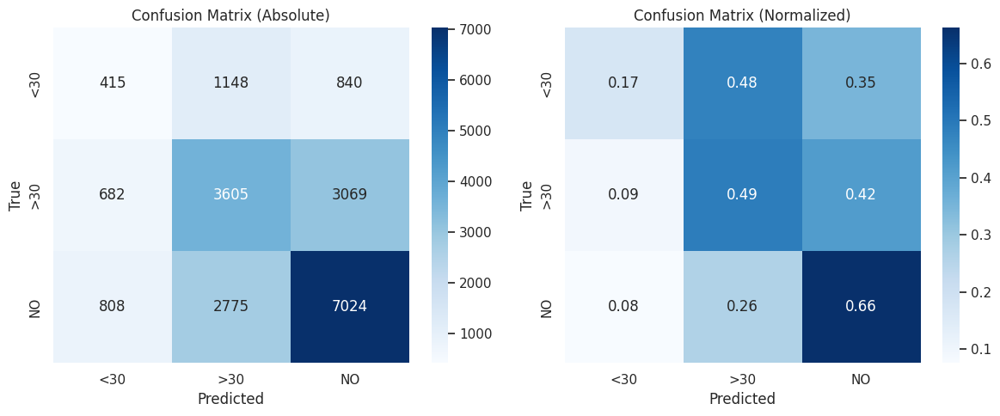

In [ ]:
y_pred_train = rf_model_SMOTE.predict(X_train_bal)
y_pred_test = rf_model_SMOTE.predict(X_test_scaled)

print_classification_metrics(y_train_bal, y_pred_train, label="Training set")
print_classification_metrics(y_test, y_pred_test, label="Test set")

In [ ]:
cv_results = evaluate_cv_model(X_train_bal, y_train_bal ,model=rf_model_SMOTE, cv=5)

Cross-Validation Results (5-fold):
Accuracy: 0.5779 ± 0.0692
Precision Weighted: 0.5680 ± 0.0754
Recall Weighted: 0.5779 ± 0.0692
F1 Weighted: 0.5657 ± 0.0732


In [ ]:
bootstrap_evaluation(model=rf_model_SMOTE, X=X_test_scaled, y=y_test, label_encoder=le, n_iterations=100)


Bootstrap Results (100 iterations):
Accuracy: 0.5424 (95% CI: 0.5348 - 0.5500)
F1-score (weighted): 0.5375 (95% CI: 0.5304 - 0.5454)
Recall <30: 0.1725 (95% CI: 0.1585 - 0.1890)
Recall >30: 0.4906 (95% CI: 0.4781 - 0.5033)
Recall NO: 0.6621 (95% CI: 0.6535 - 0.6689)


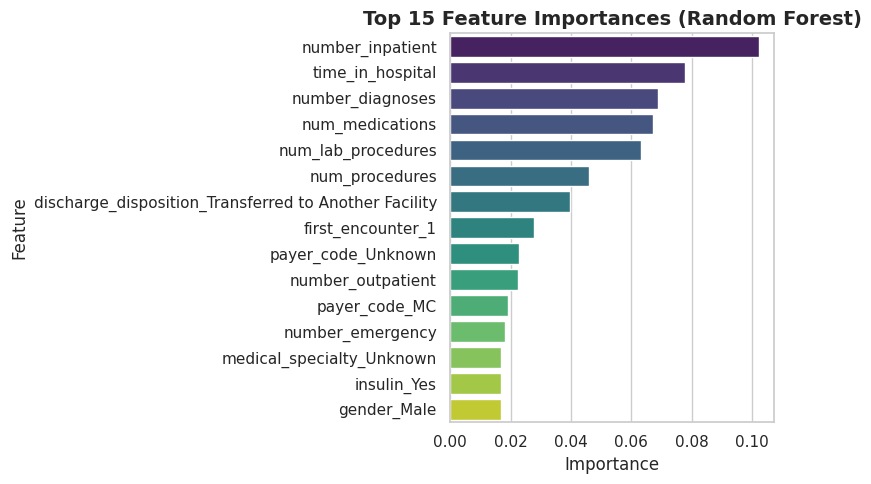

In [ ]:
# Calcolo e selezione delle top 20 feature
importances = rf_model_SMOTE.feature_importances_
feature_names = X_train_scaled.columns
feat_series = pd.Series(importances, index=feature_names)
top_feats = feat_series.sort_values(ascending=False).head(15).to_frame(name='Importance')
top_feats['Feature'] = top_feats.index

# Imposta stile seaborn
sns.set(style="whitegrid")

# Crea il grafico con hue e legend disattivata
plt.figure(figsize=(8, 5))
sns.barplot(
    data=top_feats,
    x='Importance',
    y='Feature',
    hue='Feature',
    palette='viridis',
    legend=False
)

plt.title("Top 15 Feature Importances (Random Forest)", fontsize=14, weight='bold')
plt.xlabel("Importance", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.tight_layout()
plt.show()


Fitting SHAP explainer...

SHAP Summary Plot (bar)...


<ipython-input-232-2541339896>:22: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, sample, plot_type="bar")


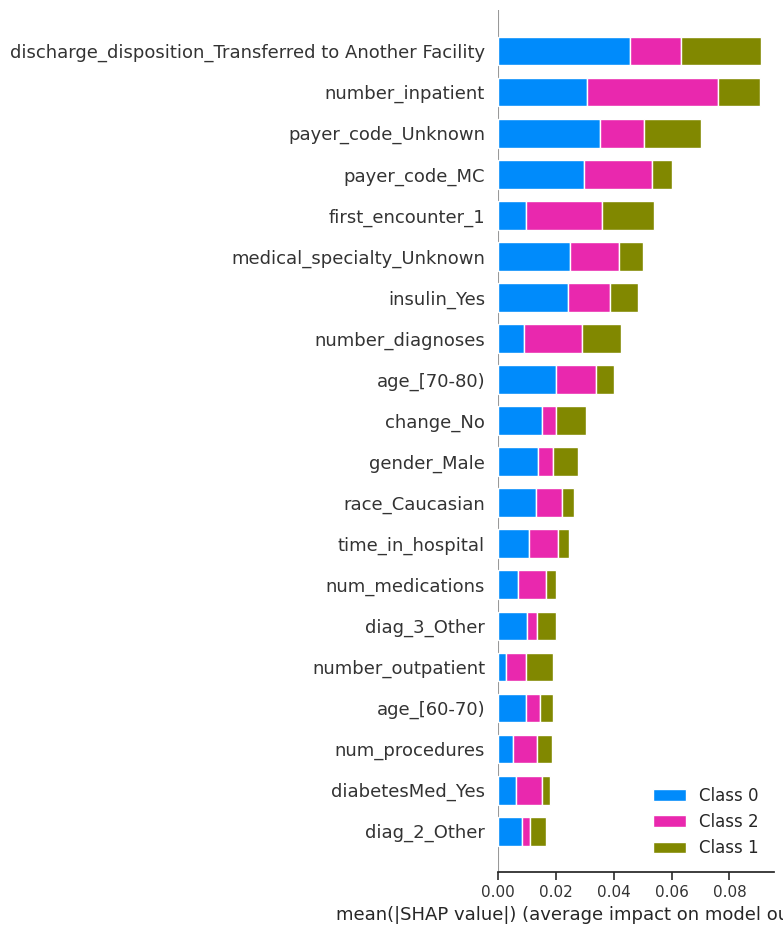


SHAP Summary Plot (beeswarm)...


<ipython-input-232-2541339896>:24: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, sample)
/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:726: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  summary_legacy(
/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:746: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  summary_legacy(
/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:746: FutureWar

<Figure size 640x480 with 0 Axes>

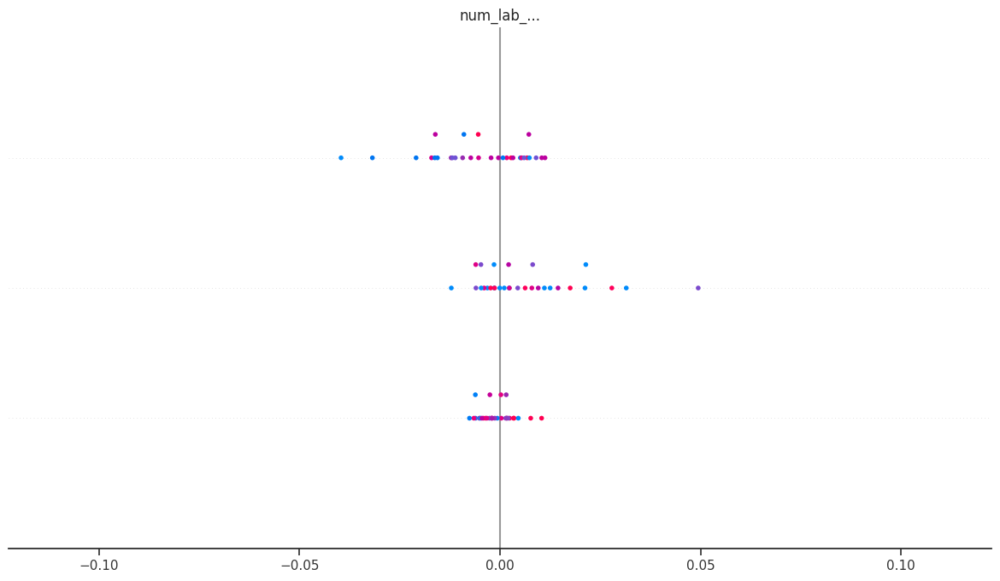


Correctly classified sample index: 0
Incorrectly classified sample index: 2

Correct Prediction Explanation for Index 0


Predicted class: NO
True class: NO
Prediction probabilities: [0.22705416 0.34044917 0.43249666]
Force plot for class: <30


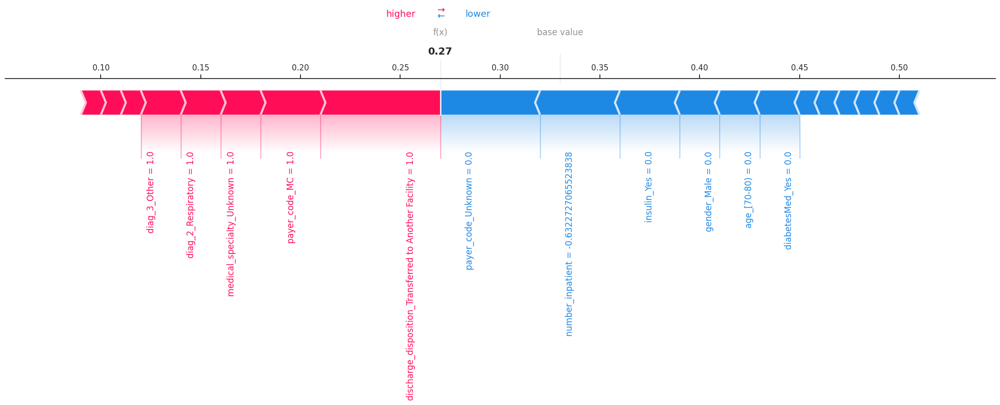

Force plot for class: >30


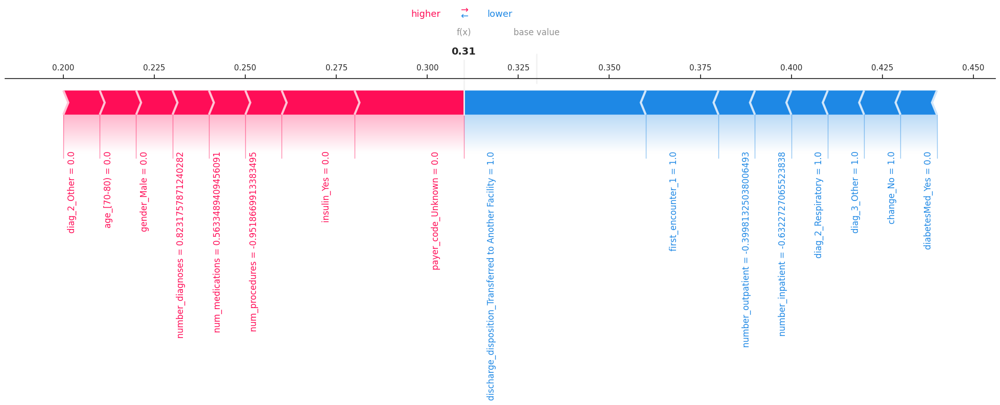

Force plot for class: NO


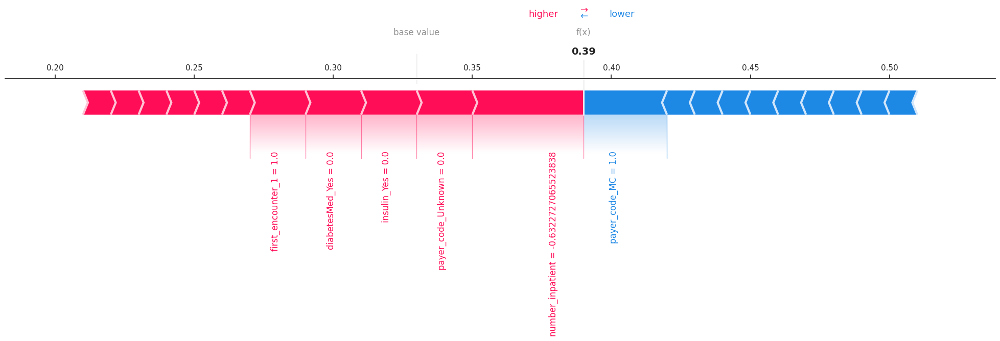


Incorrect Prediction Explanation for Index 2


Predicted class: NO
True class: >30
Prediction probabilities: [0.33139176 0.32249605 0.34611219]
Force plot for class: <30


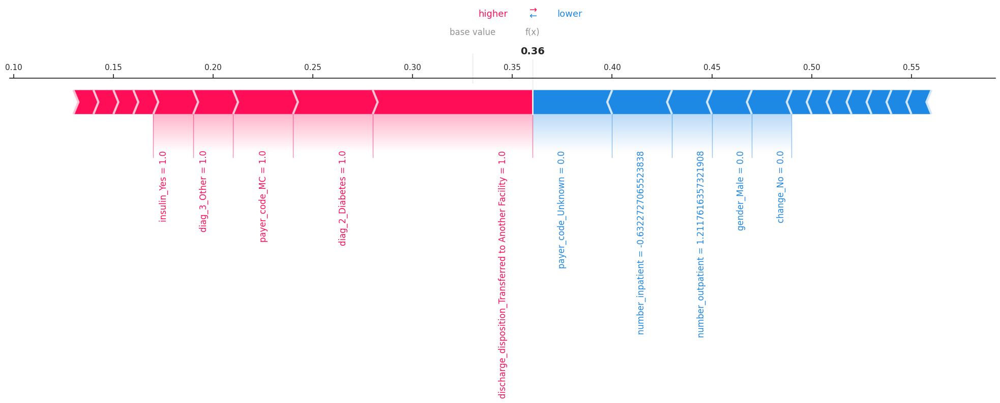

Force plot for class: >30


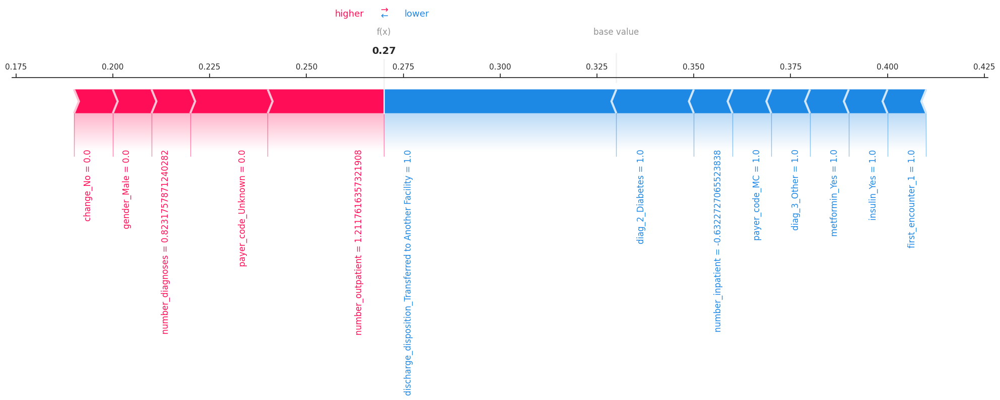

Force plot for class: NO


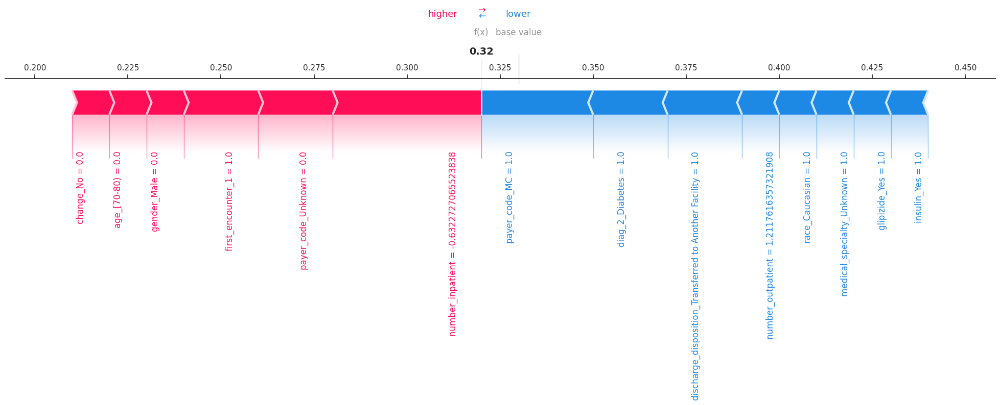

In [ ]:
shap_tree_analysis(
    model=rf_model_SMOTE,
    X_test=X_test_scaled,
    y_test=y_test,
    label_encoder=le,  # optional
    class_names=['<30', '>30', 'NO'],  # optional
    sample_size=30,
    random_state=42
)

## 6.5 - XGBoost

In [ ]:
from xgboost import XGBClassifier
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.preprocessing import LabelEncoder

# Calcola i pesi da assegnare ai campioni
sample_weights = compute_sample_weight(class_weight='balanced', y=y_train)

# Modello XGBoost multiclasse
xgboost_model = XGBClassifier(
    objective='multi:softprob',      # corretta per classificazione multiclasse
    num_class=3,                     # numero corretto di classi
    eval_metric='mlogloss',         # metrica multiclasse
    n_estimators=100,               # numero di alberi
    max_depth=3,                    # profondità massima (modificabile)
    learning_rate=0.1,              # learning rate
    subsample=0.8,                  # per regolarizzazione
    colsample_bytree=0.8,           # per regolarizzazione
    n_jobs=-1,                      # usa tutti i core disponibili
    verbosity=1                     # output base
)

# Get feature names after encoding
feature_names = X_train_scaled.columns.tolist()

# Replace invalid characters with underscores
feature_names = [name.replace('[', '_').replace(']', '_').replace('<', '_') for name in feature_names]

# Set feature names for the DMatrix
X_train_scaled.columns = feature_names
X_test_scaled.columns = feature_names  # Ensure consistency for prediction


# Continue with model training
xgboost_model.fit(
    X_train_scaled, y_train,
    sample_weight=sample_weights,
)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=100,
              n_jobs=-1, num_class=3, num_parallel_tree=None, ...)


Performance su Training set
Accuracy: 0.4940
Precision (weighted): 0.5457
Recall (weighted): 0.4940
F1-score (weighted): 0.5085

Classification Report:
              precision    recall  f1-score   support

         <30       0.20      0.47      0.28      8855
         >30       0.48      0.34      0.40     27965
          NO       0.66      0.60      0.63     41727

    accuracy                           0.49     78547
   macro avg       0.45      0.47      0.44     78547
weighted avg       0.55      0.49      0.51     78547



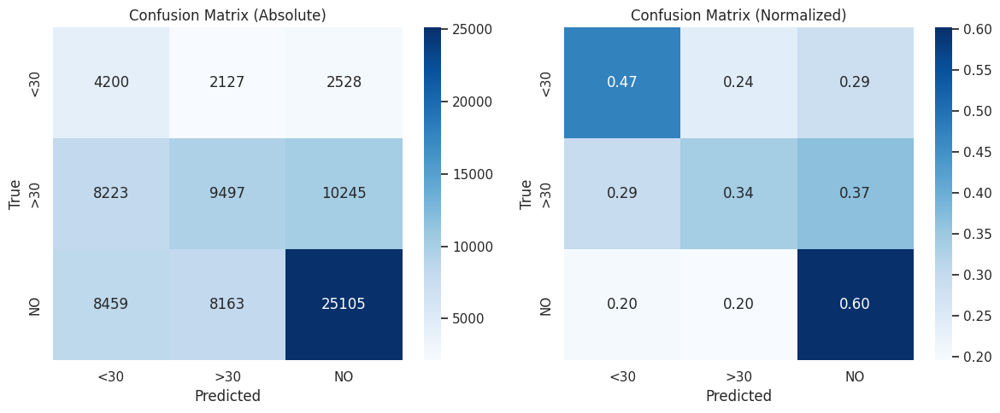


Performance su Test set
Accuracy: 0.4831
Precision (weighted): 0.5353
Recall (weighted): 0.4831
F1-score (weighted): 0.4967

Classification Report:
              precision    recall  f1-score   support

         <30       0.20      0.48      0.28      2403
         >30       0.48      0.32      0.39      7356
          NO       0.65      0.59      0.62     10607

    accuracy                           0.48     20366
   macro avg       0.44      0.47      0.43     20366
weighted avg       0.54      0.48      0.50     20366



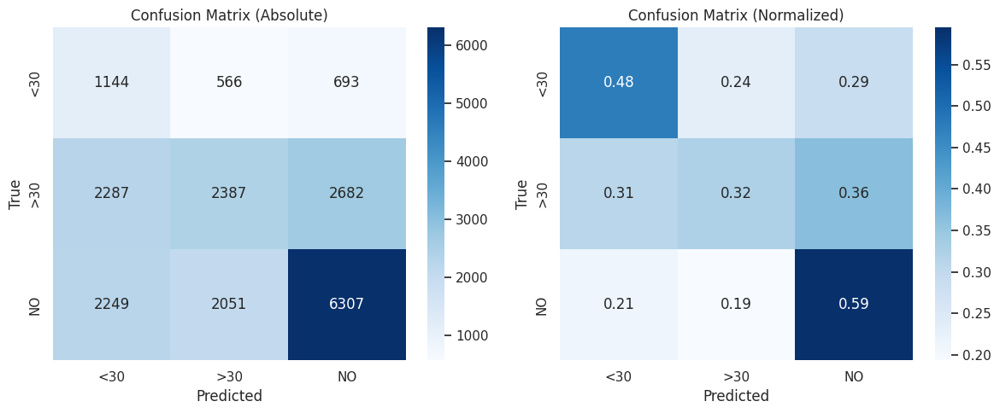

In [ ]:
y_pred_train = xgboost_model.predict(X_train_scaled)
y_pred_test = xgboost_model.predict(X_test_scaled)

print_classification_metrics(y_train, y_pred_train, label="Training set")
print_classification_metrics(y_test, y_pred_test, label="Test set")

In [ ]:
cv_results = evaluate_cv_model(X_train_scaled, y_train,model=xgboost_model, cv=5)

Cross-Validation Results (5-fold):
Accuracy: 0.5578 ± 0.0202
Precision Weighted: 0.5255 ± 0.0336
Recall Weighted: 0.5578 ± 0.0202
F1 Weighted: 0.5077 ± 0.0214


In [ ]:
bootstrap_evaluation(model=xgboost_model, X=X_test_scaled, y=y_test, label_encoder=le, n_iterations=100)


Bootstrap Results (100 iterations):
Accuracy: 0.4830 (95% CI: 0.4750 - 0.4929)
F1-score (weighted): 0.4967 (95% CI: 0.4887 - 0.5066)
Recall <30: 0.4768 (95% CI: 0.4574 - 0.4960)
Recall >30: 0.3242 (95% CI: 0.3117 - 0.3344)
Recall NO: 0.5947 (95% CI: 0.5852 - 0.6029)


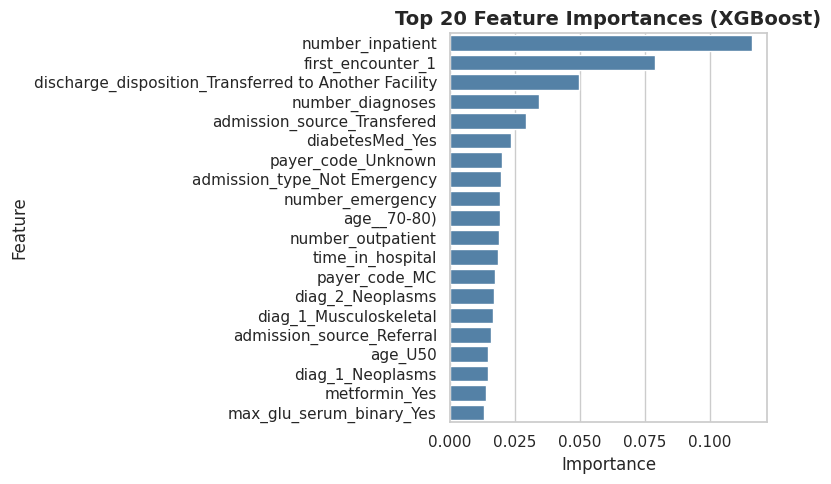

In [ ]:
importances = xgboost_model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X_train_scaled.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

top_feats = feature_importance_df.head(20)

plt.figure(figsize=(8, 5))
sns.barplot(data=top_feats, x='Importance', y='Feature', color='steelblue')
plt.title("Top 20 Feature Importances (XGBoost)", fontsize=14, weight='bold')
plt.xlabel("Importance", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.tight_layout()
plt.show()


Fitting SHAP explainer...

SHAP Summary Plot (bar)...


<ipython-input-172-2276531394>:22: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, sample, plot_type="bar")


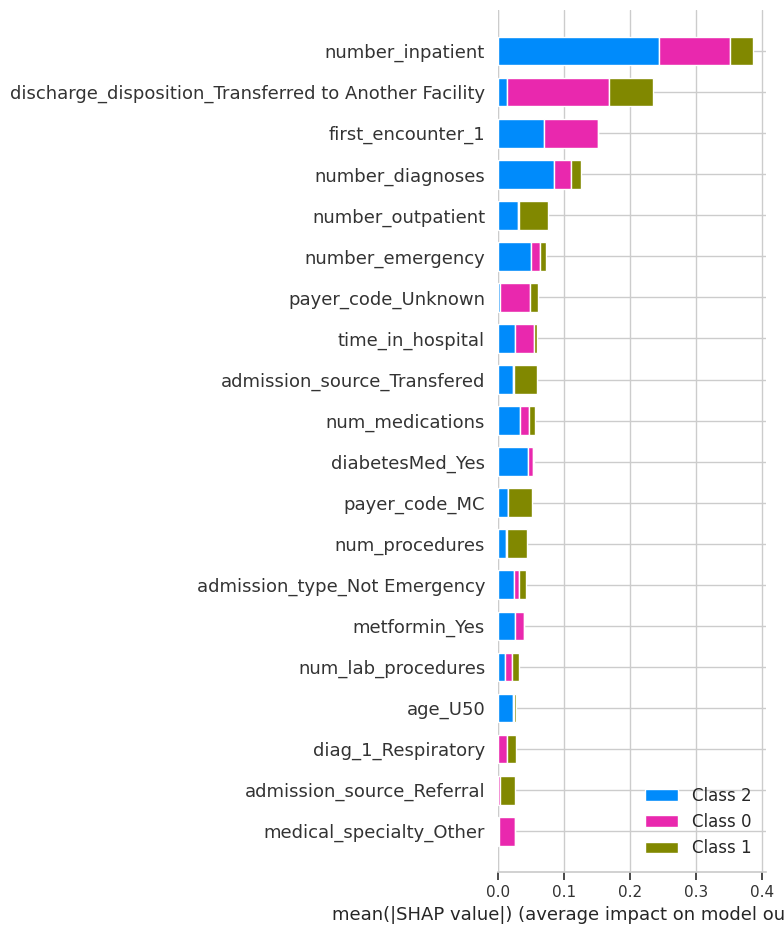


SHAP Summary Plot (beeswarm)...


<ipython-input-172-2276531394>:24: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, sample)
/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:726: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  summary_legacy(
/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:746: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  summary_legacy(
/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:746: FutureWar

<Figure size 640x480 with 0 Axes>

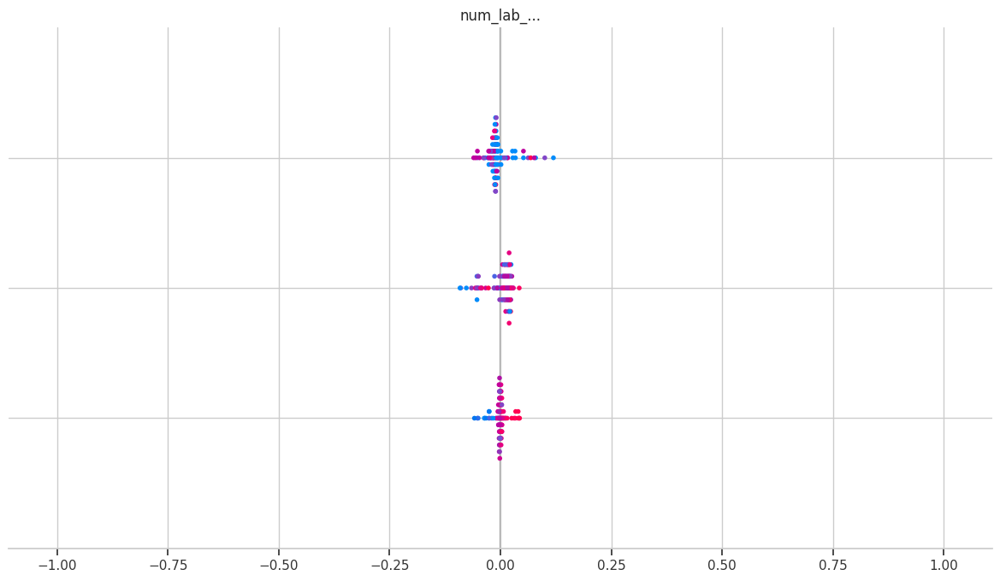


Correctly classified sample index: 0
Incorrectly classified sample index: 2

Correct Prediction Explanation for Index 0


Predicted class: NO
True class: NO
Prediction probabilities: [0.27173206 0.31832156 0.4099464 ]
Force plot for class: <30


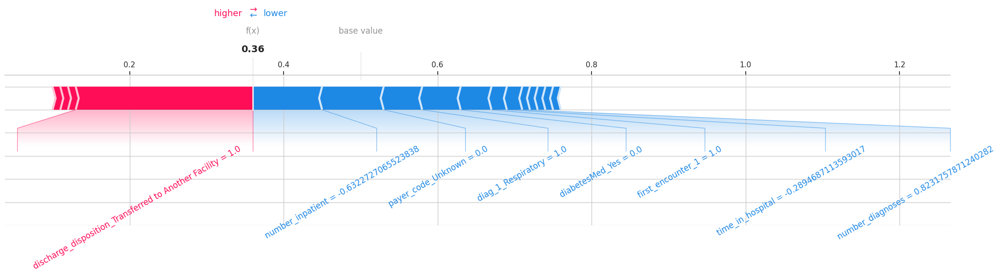

Force plot for class: >30


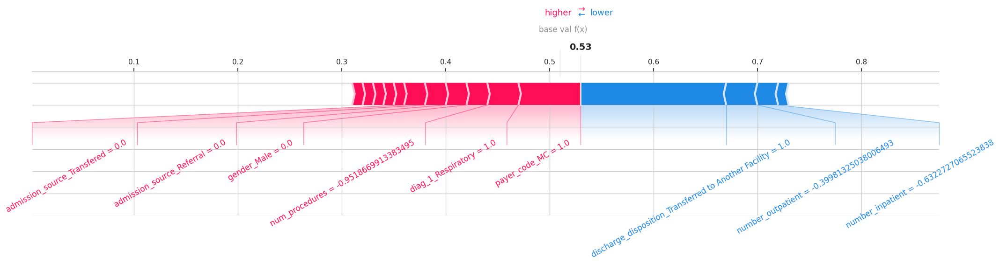

Force plot for class: NO


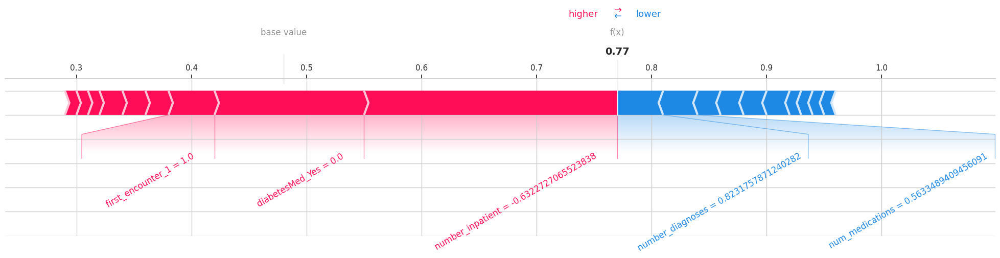


Incorrect Prediction Explanation for Index 2


Predicted class: <30
True class: >30
Prediction probabilities: [0.3826635  0.3322974  0.28503916]
Force plot for class: <30


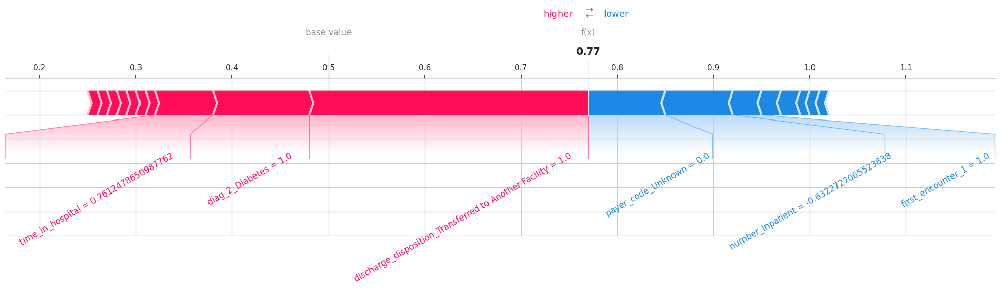

Force plot for class: >30


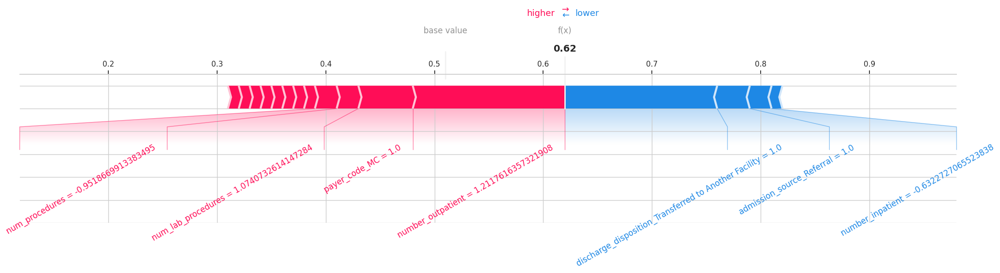

Force plot for class: NO


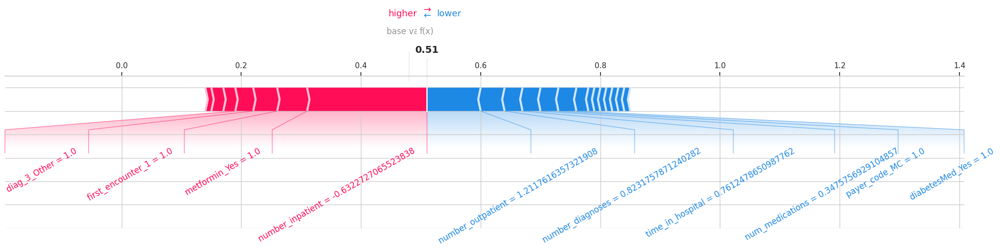

In [ ]:
shap_tree_analysis(
    model=xgboost_model,
    X_test=X_test_scaled,
    y_test=y_test,
    label_encoder=le,  # optional
    class_names=['<30', '>30', 'NO'],  # optional
    sample_size=100,
    random_state=42
)

# 7 - Logic gate model

## 7.1 - First binary model

In [ ]:
#y_train = 0 corresponds to class '<30'. We put 1 when taget is '<30' and 0 when it is 'NO' or '>30'

y_train_enc = (y_train == 0).astype(int)
y_test_enc = (y_test == 0).astype(int)

# Optional: Print distribution to verify
print("Distribution of y_train_enc:")
print(pd.Series(y_train_enc).value_counts(normalize=True))
print("\nDistribution of y_test_enc:")
print(pd.Series(y_test_enc).value_counts(normalize=True))

Distribution of y_train_enc:
0    0.887265
1    0.112735
Name: proportion, dtype: float64

Distribution of y_test_enc:
0    0.882009
1    0.117991
Name: proportion, dtype: float64


In [ ]:
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.multiclass import OneVsRestClassifier

gate_model = LogisticRegression(random_state=12345, max_iter=1000, class_weight='balanced')


gate_model.fit(X_train_scaled, y_train_enc)

LogisticRegression(class_weight='balanced', max_iter=1000, random_state=12345)

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

def print_classification_metrics_binary(y_true, y_pred, label="Dataset"):
    """
    Print classification metrics and plot confusion matrices (absolute and normalized).

    Parameters:
        y_true: Ground truth labels
        y_pred: Predicted labels
        label:  Label for identifying the dataset (e.g., "Train set", "Test set")
    """
    # --- METRICS ---
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)

    print(f"\nPerformance on {label}")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision (weighted): {precision:.4f}")
    print(f"Recall (weighted): {recall:.4f}")
    print(f"F1-score (weighted): {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, zero_division=0))

    # --- CONFUSION MATRICES ---
    cm = confusion_matrix(y_true, y_pred)
    cm_normalized = cm.astype('float') / cm.sum(axis=1, keepdims=True)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Absolute Confusion Matrix
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0])
    axes[0].set_title("Confusion Matrix (Absolute)")
    axes[0].set_xlabel("Predicted")
    axes[0].set_ylabel("True")

    # Normalized Confusion Matrix
    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', ax=axes[1])
    axes[1].set_title("Confusion Matrix (Normalized)")
    axes[1].set_xlabel("Predicted")
    axes[1].set_ylabel("True")

    plt.tight_layout()
    plt.show()


Performance on Train set
Accuracy: 0.6431
Precision (weighted): 0.8407
Recall (weighted): 0.6431
F1-score (weighted): 0.7081

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.65      0.76     69692
           1       0.18      0.59      0.27      8855

    accuracy                           0.64     78547
   macro avg       0.55      0.62      0.52     78547
weighted avg       0.84      0.64      0.71     78547



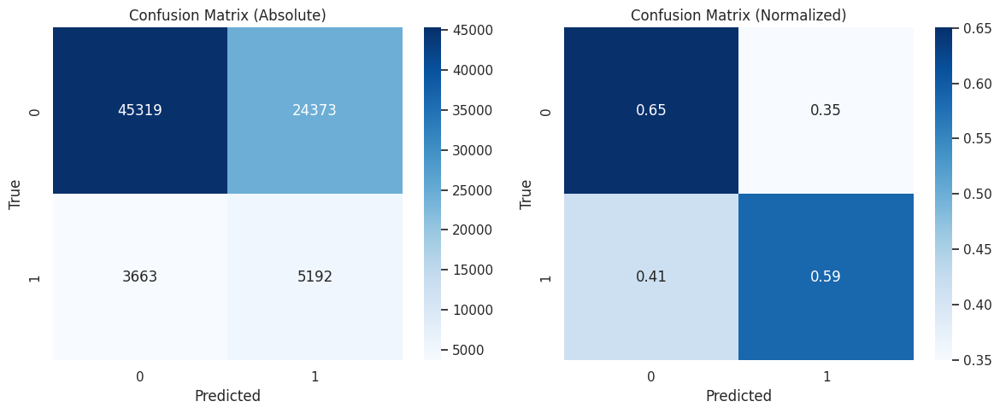


Performance on Test set
Accuracy: 0.6377
Precision (weighted): 0.8342
Recall (weighted): 0.6377
F1-score (weighted): 0.7015

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.64      0.76     17963
           1       0.18      0.59      0.28      2403

    accuracy                           0.64     20366
   macro avg       0.55      0.62      0.52     20366
weighted avg       0.83      0.64      0.70     20366



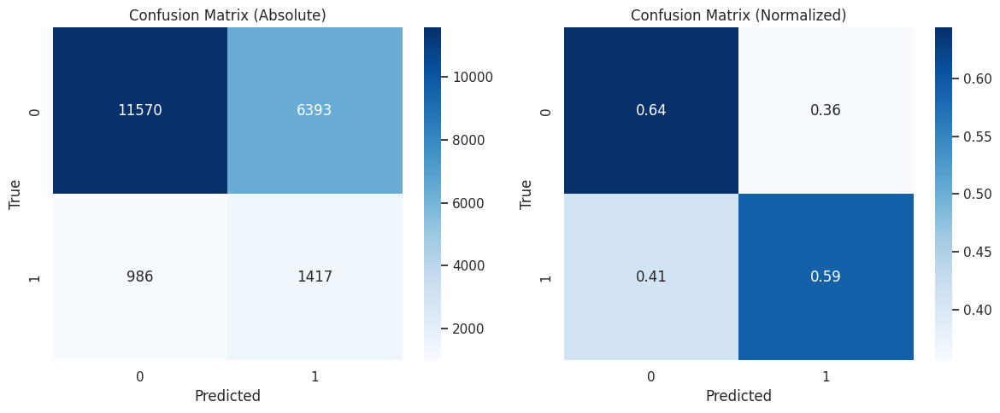

In [ ]:
# Predizioni
y_pred_train = gate_model.predict(X_train_scaled)
y_pred_test = gate_model.predict(X_test_scaled)

# Valutazione
print_classification_metrics_binary(y_train_enc, y_pred_train, label="Train set")
print_classification_metrics_binary(y_test_enc, y_pred_test, label="Test set")


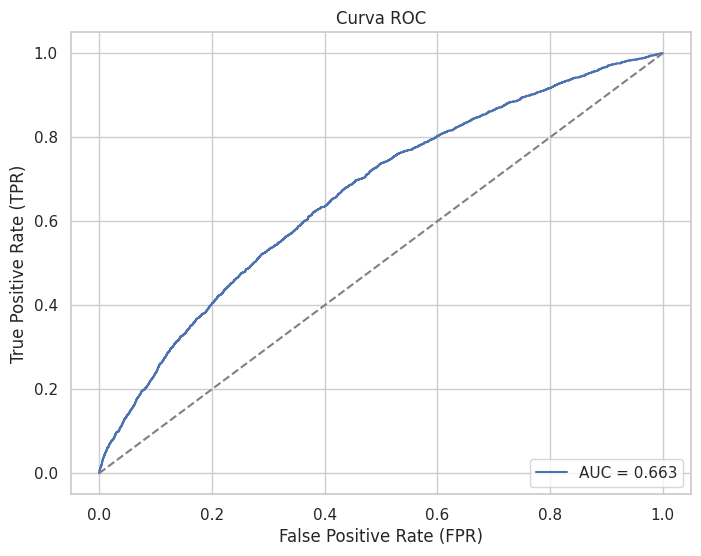

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Prediction with threshold 0.3
y_proba = gate_model.predict_proba(X_test_scaled)[:, 1]

# ROC values
fpr, tpr, thresholds = roc_curve(y_test_enc, y_proba)
roc_auc = roc_auc_score(y_test_enc, y_proba)

# ROC curve plot
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.3f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')  # diagonale
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

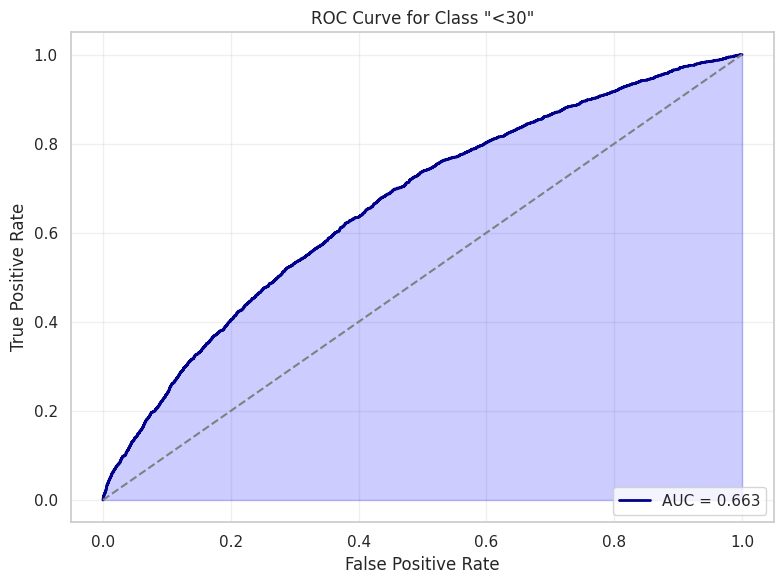

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Calcolo delle probabilità per la classe positiva (es: '<30' codificata come 1)
y_proba_positive_class = gate_model.predict_proba(X_test_scaled)[:, 1]

# Calcolo della curva ROC
fpr, tpr, thresholds = roc_curve(y_test_enc, y_proba_positive_class)
roc_auc = auc(fpr, tpr)

# Trova il punto ottimale (massimizza TPR - FPR)
optimal_idx = (tpr - fpr).argmax()
optimal_threshold = thresholds[optimal_idx]
optimal_point = (fpr[optimal_idx], tpr[optimal_idx])

# Plot della curva ROC con area evidenziata
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkblue', lw=2, label=f'AUC = {roc_auc:.3f}')
plt.fill_between(fpr, tpr, alpha=0.2, color='blue')  # Riempimento AUC
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')

# Punto ottimale
#plt.scatter(*optimal_point, color='red', zorder=10, label=f'Best threshold = {optimal_threshold:.2f}')
#plt.text(optimal_point[0] + 0.02, optimal_point[1] - 0.05,
         #f'Threshold = {optimal_threshold:.2f}', color='red', fontsize=10)

# Etichette e stile
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Class "<30"')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


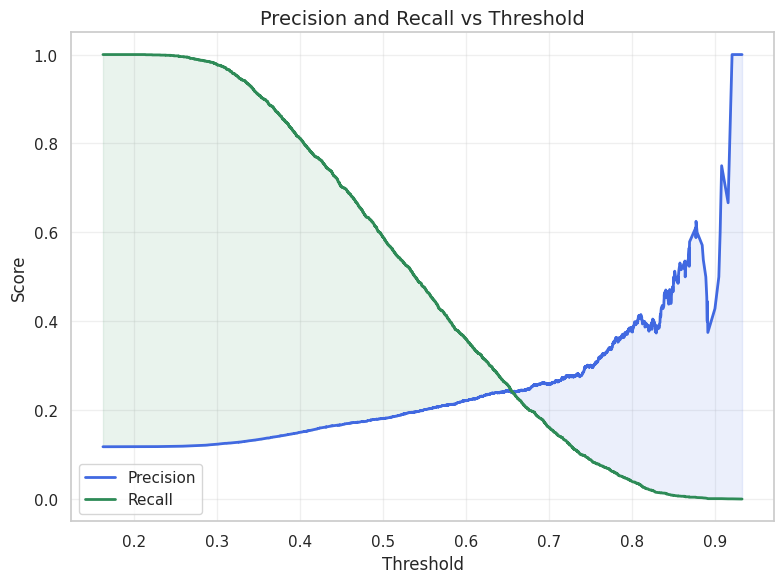

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve

# Calcolo delle curve precision, recall e soglie
precision, recall, thresholds = precision_recall_curve(y_test_enc, y_proba_positive_class)

# Allinea precision e recall con thresholds
precision = precision[:-1]
recall = recall[:-1]

# Plot con stile migliorato
plt.figure(figsize=(8, 6))
plt.plot(thresholds, precision, label='Precision', color='royalblue', lw=2)
plt.plot(thresholds, recall, label='Recall', color='seagreen', lw=2)

# Evidenzia visivamente dove precision > recall e viceversa
plt.fill_between(thresholds, precision, recall, where=(precision > recall),
                 interpolate=True, color='royalblue', alpha=0.1)
plt.fill_between(thresholds, recall, precision, where=(recall > precision),
                 interpolate=True, color='seagreen', alpha=0.1)

# Dettagli grafici
plt.xlabel('Threshold', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.title('Precision and Recall vs Threshold', fontsize=14)
plt.legend(loc='best')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()



Performance on Test set (soglia 0.46)
Accuracy: 0.5698
Precision (weighted): 0.8402
Recall (weighted): 0.5698
F1-score (weighted): 0.6448

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.55      0.69     17963
           1       0.17      0.69      0.27      2403

    accuracy                           0.57     20366
   macro avg       0.55      0.62      0.48     20366
weighted avg       0.84      0.57      0.64     20366



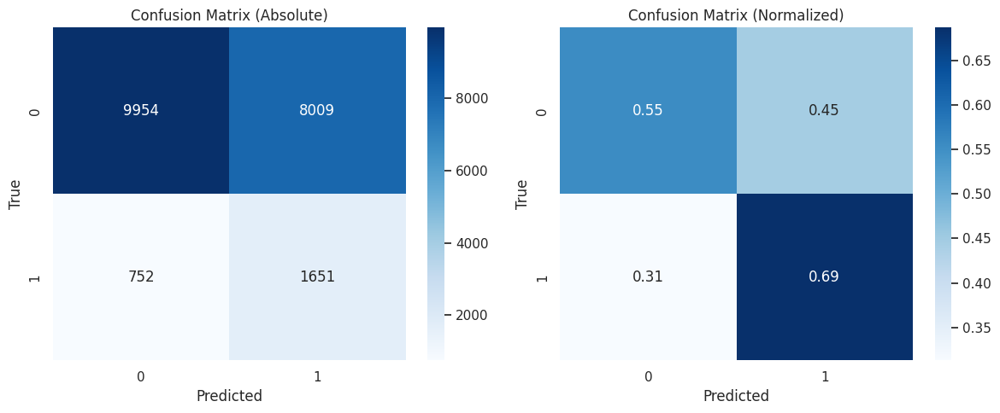

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

# Prediction with threshold
th=0.46
y_pred = (y_proba >= th).astype(int)

print_classification_metrics_binary(y_test_enc, y_pred, f"Test set (soglia {th})")

In [ ]:
# Trova gli indici nel test set dove y_pred è 1
indices_predicted_0 = y_pred == 0

# Seleziona le righe corrispondenti da X_test_scaled e y_test
X_test_predicted_0 = X_test_scaled.loc[indices_predicted_0]
y_test_predicted_0 = y_test[indices_predicted_0]

print("Nuovi X_test e y_test (solo istanze classificate come 0):")
print(f"Forma di X_test_predicted_0: {X_test_predicted_0.shape}")
print(f"Forma di y_test_predicted_0: {y_test_predicted_0.shape}")

Nuovi X_test e y_test (solo istanze classificate come 0):
Forma di X_test_predicted_0: (10706, 91)
Forma di y_test_predicted_0: (10706,)


In [ ]:
y_pred_gate =y_pred.copy()

## 7.2 - Second binary model

In [ ]:
# Keep only instances where target = NO or >30. >30 -> 1 while NO -> 2
X_train_secondary = X_train_scaled[y_train != 0].copy()
y_train_secondary_original = y_train[y_train != 0].copy()

y_train_enc = ((y_train_secondary_original == 1)).astype(int)
y_test_enc = ((y_test_predicted_0 == 1)).astype(int)

# Optional: Print distribution to verify
print("Distribution of y_train_enc:")
print(pd.Series(y_train_enc).value_counts(normalize=True))
print("\nDistribution of y_test_enc:")
print(pd.Series(y_test_enc).value_counts(normalize=True))

Distribution of y_train_enc:
0    0.598734
1    0.401266
Name: proportion, dtype: float64

Distribution of y_test_enc:
0    0.685425
1    0.314575
Name: proportion, dtype: float64


In [ ]:
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.multiclass import OneVsRestClassifier

second_model = LogisticRegression(class_weight='balanced', random_state=12345, max_iter=1000)

second_model.fit(X_train_secondary, y_train_enc)

LogisticRegression(class_weight='balanced', max_iter=1000, random_state=12345)


Performance on Train set
Accuracy: 0.6347
Precision (weighted): 0.6384
Recall (weighted): 0.6347
F1-score (weighted): 0.6362

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.68      0.69     41727
           1       0.54      0.57      0.56     27965

    accuracy                           0.63     69692
   macro avg       0.62      0.62      0.62     69692
weighted avg       0.64      0.63      0.64     69692



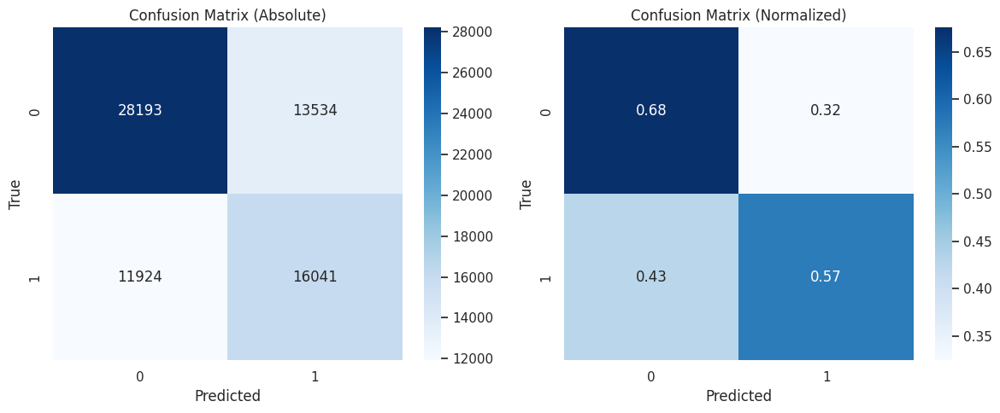


Performance on Test set
Accuracy: 0.6567
Precision (weighted): 0.6344
Recall (weighted): 0.6567
F1-score (weighted): 0.6416

Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.81      0.76      7990
           1       0.44      0.33      0.38      3667

    accuracy                           0.66     11657
   macro avg       0.58      0.57      0.57     11657
weighted avg       0.63      0.66      0.64     11657



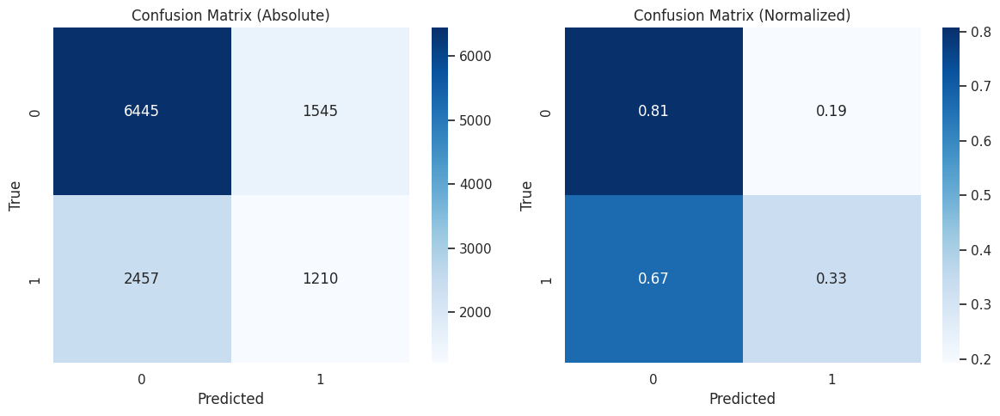

In [ ]:
# Predizioni
y_pred_train = second_model.predict(X_train_secondary)
y_pred_test = second_model.predict(X_test_predicted_0)

# Valutazione
print_classification_metrics_binary(y_train_enc, y_pred_train, label="Train set")
print_classification_metrics_binary(y_test_enc, y_pred_test, label="Test set")


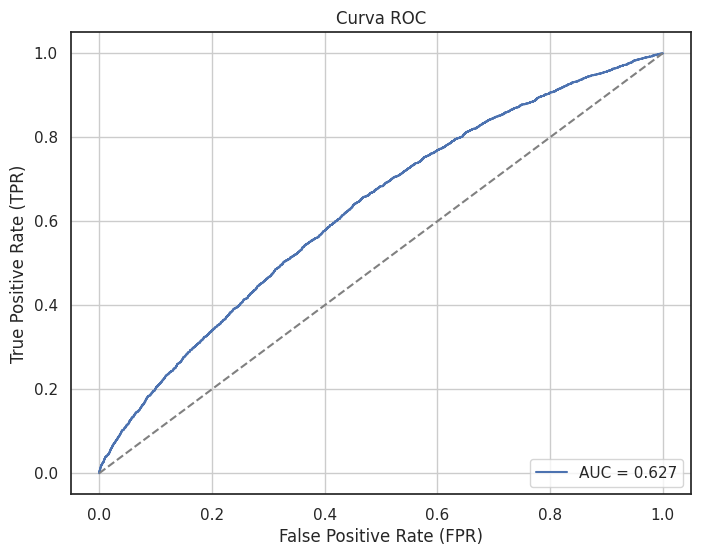

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

y_proba = second_model.predict_proba(X_test_predicted_0)[:, 1]

# ROC values
fpr, tpr, thresholds = roc_curve(y_test_enc, y_proba)
roc_auc = roc_auc_score(y_test_enc, y_proba)

# ROC curve plot
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.3f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')  # diagonale
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


Performance on Test set (soglia 0.43)
Accuracy: 0.5853
Precision (weighted): 0.6453
Recall (weighted): 0.5853
F1-score (weighted): 0.6000

Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.58      0.66      7990
           1       0.40      0.60      0.48      3667

    accuracy                           0.59     11657
   macro avg       0.58      0.59      0.57     11657
weighted avg       0.65      0.59      0.60     11657



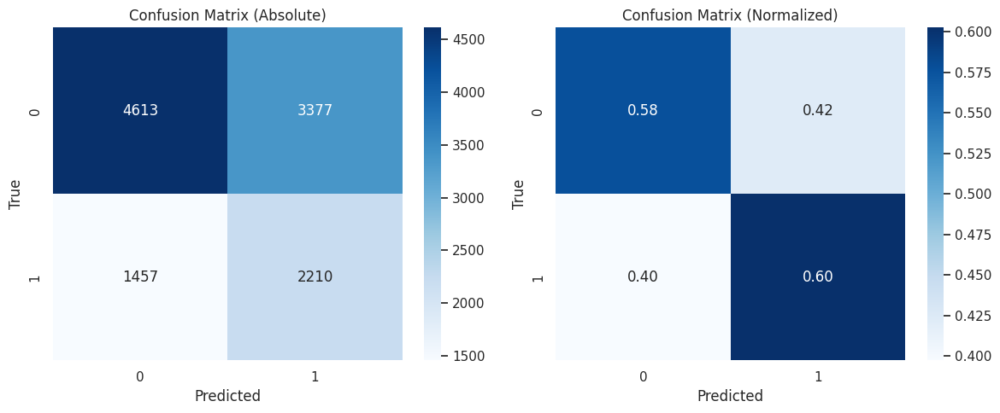

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

# Prediction with threshold
th=0.43
y_pred = (y_proba >= th).astype(int)

print_classification_metrics_binary(y_test_enc, y_pred, f"Test set (soglia {th})")

In [ ]:
y_pred_secondary=y_pred.copy()

## 7.3 - Combined model

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

def predict_gate_model(X_test_scaled, y_test=None, gate_model=None, second_model=None, label_encoder=None, th_gate=0.48, th_second=0.43):
    """
    Esegue predizione finale a 3 classi utilizzando un modello a 2 stadi.

    Parametri:
    - X_test_scaled: Test set già scalato
    - y_test: (opzionale) target originale (numerico, encoded con label_encoder)
    - gate_model: primo modello binario (predicts <30 vs not)
    - second_model: secondo modello binario (predicts >30 vs NO)
    - label_encoder: label encoder usato per codificare/decodificare y
    - th_gate: soglia per il gate model
    - th_second: soglia per il secondo modello

    Ritorna:
    - final_predictions: Series con le etichette finali stringa
    """
    # Conserva un riferimento all'intero index
    full_index = X_test_scaled.index

    # Step 1: predizione gate
    y_proba_gate = gate_model.predict_proba(X_test_scaled)[:, 1]
    y_pred_gate = (y_proba_gate >= th_gate).astype(int)

    # Indici predetti come '<30'
    indices_pred_30 = full_index[y_pred_gate == 1]
    final_predictions = pd.Series(index=full_index, dtype=str)
    final_predictions.loc[indices_pred_30] = '<30'

    # Indici da passare al secondo modello (quelli che NON sono <30)
    indices_other = full_index[y_pred_gate == 0]
    X_other = X_test_scaled.loc[indices_other]

    # Solo se ci sono istanze da classificare nel secondo modello
    if len(X_other) > 0:
        y_proba_second = second_model.predict_proba(X_other)[:, 1]
        y_pred_second = (y_proba_second >= th_second).astype(int)
        y_pred_second_series = pd.Series(y_pred_second, index=X_other.index)  # Usa index corretto
        final_predictions.loc[indices_other] = y_pred_second_series.map({0: 'NO', 1: '>30'})
    else:
        print("Nessuna istanza passata al secondo modello.")

    # --- Valutazione (opzionale) ---
    if y_test is not None:
        # Decodifica target numerico in etichette stringa
        y_test_decoded = label_encoder.inverse_transform(y_test)
        y_test_series = pd.Series(y_test_decoded, index=X_test_scaled.index)

        print("\nClassification Report:")
        print(classification_report(y_test_series, final_predictions, zero_division=0))

        # Confusion Matrix
        labels_order = ['NO', '>30', '<30']
        cm = confusion_matrix(y_test_series, final_predictions, labels=labels_order)
        cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)
        cm_norm = np.nan_to_num(cm_norm, nan=0)

        fig, axes = plt.subplots(1, 2, figsize=(14, 6))

        # Matrice assoluta
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0],
                    xticklabels=labels_order, yticklabels=labels_order)
        axes[0].set_title("Confusion Matrix (Assoluta)")
        axes[0].set_xlabel("Predicted")
        axes[0].set_ylabel("True")

        # Matrice normalizzata
        sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues', ax=axes[1],
                    xticklabels=labels_order, yticklabels=labels_order)
        axes[1].set_title("Confusion Matrix (Normalizzata)")
        axes[1].set_xlabel("Predicted")
        axes[1].set_ylabel("True")

        plt.tight_layout()
        plt.show()

    return final_predictions



Classification Report:
              precision    recall  f1-score   support

         <30       0.18      0.59      0.28      2403
         >30       0.41      0.30      0.35      7356
          NO       0.68      0.46      0.55     10607

    accuracy                           0.42     20366
   macro avg       0.42      0.45      0.39     20366
weighted avg       0.52      0.42      0.44     20366



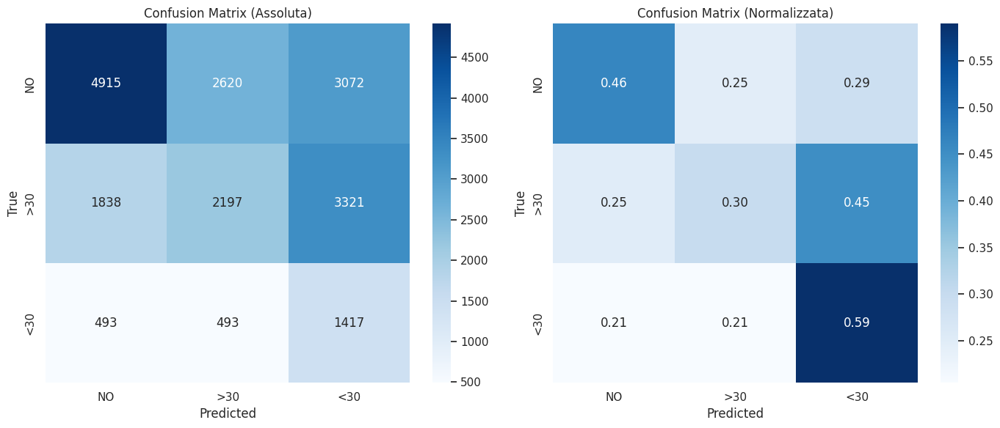

In [ ]:
predizioni_finali = predict_gate_model(
    X_test_scaled=X_test_scaled,
    y_test=y_test,
    gate_model=gate_model,
    second_model=second_model,
    label_encoder=le,
    th_gate=0.5,
    th_second=0.45
)


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, f1_score, recall_score
from tqdm import tqdm

# Inizializza liste per ogni metrica
accuracies = []
f1_weighted_scores = []
recall_30 = []
recall_gt30 = []
recall_no = []

labels = ['<30', '>30', 'NO']

for i in tqdm(range(100), desc="Bootstrapping (metriche specifiche)"):
    # 1. Bootstrap sampling
    sampled_indices = np.random.choice(X_test_scaled.index, size=len(X_test_scaled), replace=True)
    X_bootstrap = X_test_scaled.loc[sampled_indices]
    y_bootstrap = pd.Series(y_test, index=X_test_scaled.index).loc[sampled_indices]

    # 2. Predizione
    final_preds = predict_gate_model(
        X_test_scaled=X_bootstrap,
        y_test=None,
        gate_model=gate_model,
        second_model=second_model,
        label_encoder=le,
        th_gate=0.5,
        th_second=0.45
    )

    # 3. Decodifica target reale
    y_true = pd.Series(le.inverse_transform(y_bootstrap), index=sampled_indices)

    # 4. Calcolo metriche
    acc = accuracy_score(y_true, final_preds)
    f1_weighted = f1_score(y_true, final_preds, average='weighted', zero_division=0)
    recalls = recall_score(y_true, final_preds, average=None, labels=labels, zero_division=0)

    # 5. Salva metriche
    accuracies.append(acc)
    f1_weighted_scores.append(f1_weighted)
    recall_30.append(recalls[0])
    recall_gt30.append(recalls[1])
    recall_no.append(recalls[2])


Bootstrapping (metriche specifiche): 100%|██████████| 100/100 [00:54<00:00,  1.82it/s]


In [ ]:
def print_metric_summary(name, values):
    mean = np.mean(values) * 100
    std = np.std(values) * 100
    print(f"{name:18s}: {mean:.2f} ± {std:.2f} %")

print("\nRisultati finali (media ± std su 100 bootstrap):\n")
print_metric_summary("Accuracy", accuracies)
print_metric_summary("F1 (Weighted)", f1_weighted_scores)
print_metric_summary("Recall <30", recall_30)
print_metric_summary("Recall >30", recall_gt30)
print_metric_summary("Recall NO", recall_no)



Risultati finali (media ± std su 100 bootstrap):

Accuracy          : 41.89 ± 0.33 %
F1 (Weighted)     : 44.50 ± 0.35 %
Recall <30        : 58.94 ± 1.03 %
Recall >30        : 29.83 ± 0.47 %
Recall NO         : 46.39 ± 0.47 %


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, f1_score, recall_score
from tqdm import tqdm

# -------------------------------------------------------------------
# Lists to store the bootstrap metrics
# -------------------------------------------------------------------
accuracy_hist      = []
f1_weighted_hist   = []
recall_30_hist     = []
recall_gt30_hist   = []
recall_no_hist     = []

labels = ['<30', '>30', 'NO']          # required order for recall_score

# -------------------------------------------------------------------
# Bootstrap loop
# -------------------------------------------------------------------
for _ in tqdm(range(100), desc="Bootstrapping (95% CI)"):
    # 1) Draw a bootstrap sample (same size, with replacement)
    boot_idx = np.random.choice(X_test_scaled.index,
                                size=len(X_test_scaled),
                                replace=True)
    X_boot = X_test_scaled.loc[boot_idx]
    y_boot = pd.Series(y_test, index=X_test_scaled.index).loc[boot_idx]

    # 2) Predict with the two-stage (gating) model
    y_pred = predict_gate_model(
        X_test_scaled = X_boot,
        y_test        = None,          # not used inside the function
        gate_model    = gate_model,
        second_model  = second_model,
        label_encoder = le,
        th_gate       = 0.5,
        th_second     = 0.45
    )

    # 3) Decode the true labels
    y_true = pd.Series(le.inverse_transform(y_boot), index=boot_idx)

    # 4) Compute metrics
    accuracy_hist.append(accuracy_score(y_true, y_pred))
    f1_weighted_hist.append(f1_score(y_true, y_pred,
                                     average='weighted',
                                     zero_division=0))
    recalls = recall_score(y_true, y_pred,
                           average=None,
                           labels=labels,
                           zero_division=0)
    recall_30_hist.append(recalls[0])
    recall_gt30_hist.append(recalls[1])
    recall_no_hist.append(recalls[2])

# -------------------------------------------------------------------
# Helper: mean and 95 % bootstrap confidence interval
# -------------------------------------------------------------------
def print_ci(name: str, values: list[float]) -> None:
    values = np.asarray(values) * 100      # convert to %
    mean   = values.mean()
    low, high = np.percentile(values, [2.5, 97.5])
    print(f"{name:18s}: {mean:5.2f}%  (95% CI: {low:5.2f} – {high:5.2f})")

# -------------------------------------------------------------------
# Display results
# -------------------------------------------------------------------
print("\nFinal results with 95% confidence intervals (100 bootstrap samples):\n")
print_ci("Accuracy",        accuracy_hist)
print_ci("F1 (Weighted)",   f1_weighted_hist)
print_ci("Recall <30",      recall_30_hist)
print_ci("Recall >30",      recall_gt30_hist)
print_ci("Recall NO",       recall_no_hist)


Bootstrapping (95% CI): 100%|██████████| 100/100 [00:54<00:00,  1.85it/s]


Final results with 95% confidence intervals (100 bootstrap samples):

Accuracy          : 41.89%  (95% CI: 41.24 – 42.52)
F1 (Weighted)     : 44.50%  (95% CI: 43.82 – 45.14)
Recall <30        : 58.95%  (95% CI: 57.07 – 61.06)
Recall >30        : 29.81%  (95% CI: 28.94 – 30.70)
Recall NO         : 46.41%  (95% CI: 45.48 – 47.39)



Classification Report:
              precision    recall  f1-score   support

         <30       0.17      0.56      0.26      1771
         >30       0.40      0.31      0.35      5593
          NO       0.68      0.46      0.55      8346

    accuracy                           0.42     15710
   macro avg       0.42      0.44      0.39     15710
weighted avg       0.53      0.42      0.45     15710



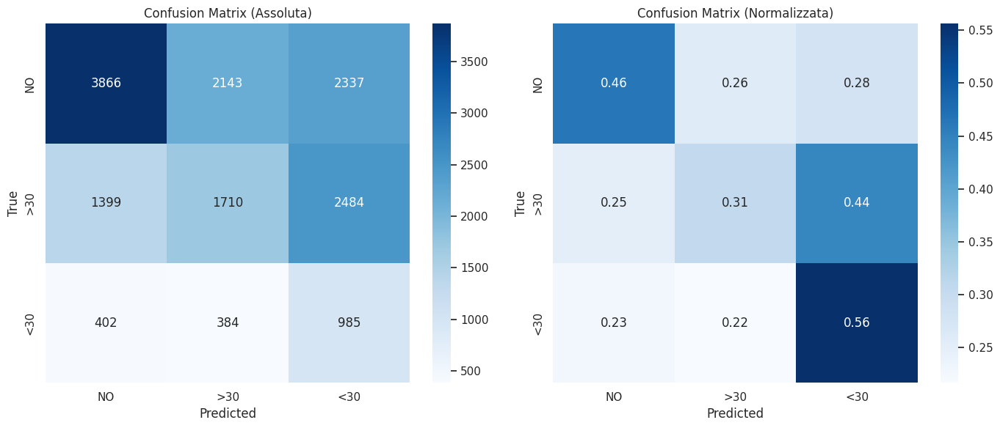


Classification Report:
              precision    recall  f1-score   support

         <30       0.18      0.58      0.27      1771
         >30       0.41      0.30      0.35      5593
          NO       0.68      0.47      0.56      8346

    accuracy                           0.42     15710
   macro avg       0.42      0.45      0.39     15710
weighted avg       0.53      0.42      0.45     15710



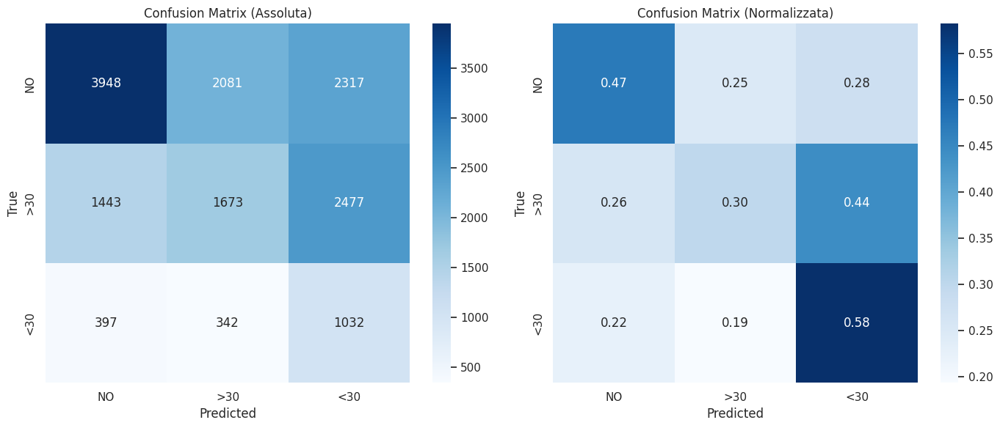


Classification Report:
              precision    recall  f1-score   support

         <30       0.18      0.60      0.27      1771
         >30       0.40      0.30      0.34      5593
          NO       0.68      0.45      0.54      8345

    accuracy                           0.41     15709
   macro avg       0.42      0.45      0.39     15709
weighted avg       0.52      0.41      0.44     15709



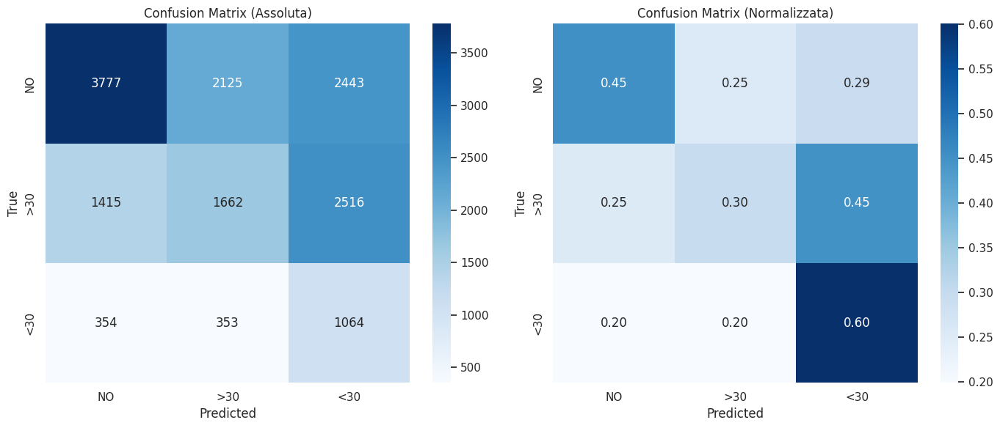


Classification Report:
              precision    recall  f1-score   support

         <30       0.17      0.58      0.27      1771
         >30       0.40      0.30      0.34      5593
          NO       0.69      0.46      0.55      8345

    accuracy                           0.42     15709
   macro avg       0.42      0.45      0.39     15709
weighted avg       0.53      0.42      0.45     15709



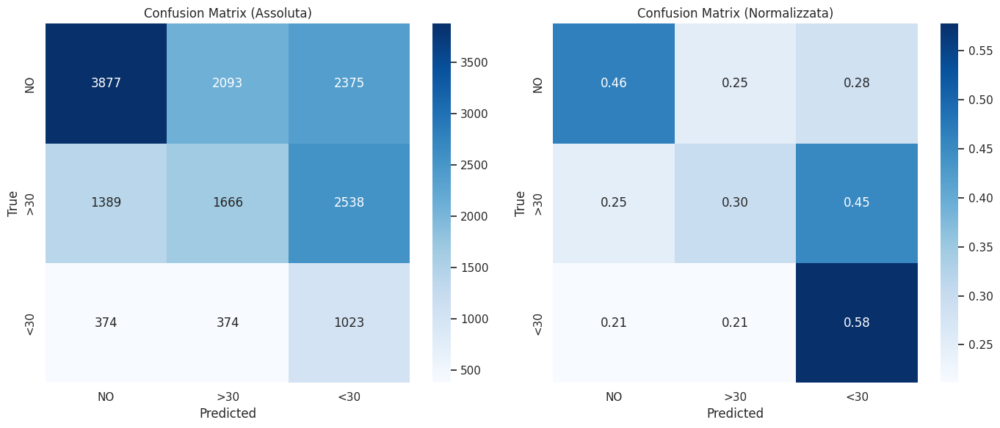


Classification Report:
              precision    recall  f1-score   support

         <30       0.17      0.58      0.27      1771
         >30       0.41      0.30      0.35      5593
          NO       0.69      0.47      0.56      8345

    accuracy                           0.42     15709
   macro avg       0.42      0.45      0.39     15709
weighted avg       0.53      0.42      0.45     15709



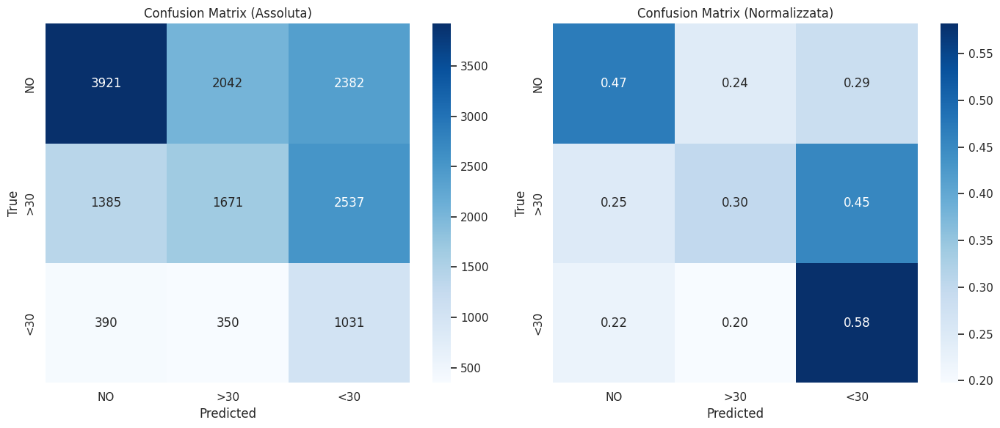

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, accuracy_score
import numpy as np
import pandas as pd

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
reports = []
accuracies = []

y_train = pd.Series(y_train)

for train_idx, val_idx in skf.split(X_train_scaled, y_train):
    X_tr, X_val = X_train_scaled.iloc[train_idx], X_train_scaled.iloc[val_idx]
    y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
    y_tr = pd.Series(y_tr.values, index=X_tr.index)

    # --- GATE MODEL ---
    y_tr_gate = (y_tr == 0).astype(int)
    gate_model = LogisticRegression(
        random_state=12345,
        max_iter=1000,
        class_weight='balanced'
    ).fit(X_tr, y_tr_gate)

    # --- SECONDARY MODEL ---
    X_tr_second = X_tr[y_tr != 0]
    y_tr_second = (y_tr[y_tr != 0] == 1).astype(int)
    second_model = LogisticRegression(
        random_state=12345,
        max_iter=1000,
        class_weight='balanced'
    ).fit(X_tr_second, y_tr_second)

    # --- PREDICT & EVALUATE ---
    pred = predict_gate_model(
        X_test_scaled=X_val,
        y_test=y_val,
        gate_model=gate_model,
        second_model=second_model,
        label_encoder=le,
        th_gate=0.5,
        th_second=0.45
    )

    # Decode y_val
    y_val_decoded = le.inverse_transform(y_val)

    # Classification report
    report = classification_report(
        y_val_decoded,
        pred,
        output_dict=True,
        zero_division=0
    )
    reports.append(report)

    # Accuracy
    acc = accuracy_score(y_val_decoded, pred)
    accuracies.append(acc)


In [ ]:
# F1-weighted per fold
f1s = [r['weighted avg']['f1-score'] for r in reports]
recalls_30 = [r['<30']['recall'] for r in reports]

print(f"Accuracy: {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
print(f"F1-weighted: {np.mean(f1s):.4f} ± {np.std(f1s):.4f}")
print(f"Recall <30: {np.mean(recalls_30):.4f} ± {np.std(recalls_30):.4f}")


Accuracy: 0.4189 ± 0.0033
F1-weighted: 0.4469 ± 0.0033
Recall <30: 0.5799 ± 0.0143


# 8 - Ablation study

In [ ]:
X_train_abl = X_train_scaled.iloc[:, 0:8]
X_test_abl = X_test_scaled.iloc[:, 0:8]
X_train_abl.info()

<class 'pandas.core.frame.DataFrame'>
Index: 78547 entries, 4199 to 93870
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   time_in_hospital    78547 non-null  float64
 1   num_lab_procedures  78547 non-null  float64
 2   num_procedures      78547 non-null  float64
 3   num_medications     78547 non-null  float64
 4   number_outpatient   78547 non-null  float64
 5   number_emergency    78547 non-null  float64
 6   number_inpatient    78547 non-null  float64
 7   number_diagnoses    78547 non-null  float64
dtypes: float64(8)
memory usage: 5.4 MB


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier

model_abl = OneVsRestClassifier(
    LogisticRegression(class_weight='balanced', random_state=12345, max_iter=1000)
)

model_abl.fit(X_train_abl, y_train)


OneVsRestClassifier(estimator=LogisticRegression(class_weight='balanced',
                                                 max_iter=1000,
                                                 random_state=12345))


Performance su Training set
Accuracy: 0.5063
Precision (weighted): 0.5205
Recall (weighted): 0.5063
F1-score (weighted): 0.4975

Classification Report:
              precision    recall  f1-score   support

         <30       0.18      0.33      0.23      8855
         >30       0.47      0.25      0.33     27965
          NO       0.63      0.72      0.67     41727

    accuracy                           0.51     78547
   macro avg       0.43      0.43      0.41     78547
weighted avg       0.52      0.51      0.50     78547



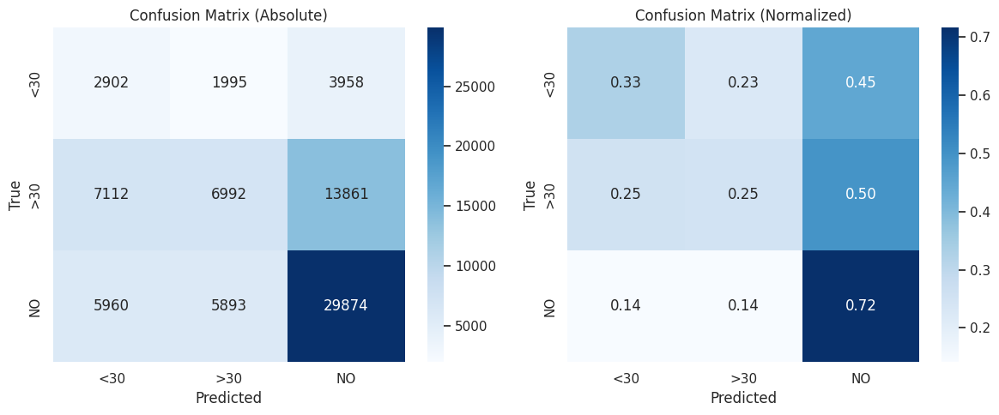


Performance su Test set
Accuracy: 0.4982
Precision (weighted): 0.5135
Recall (weighted): 0.4982
F1-score (weighted): 0.4887

Classification Report:
              precision    recall  f1-score   support

         <30       0.19      0.34      0.24      2403
         >30       0.47      0.24      0.32      7356
          NO       0.62      0.71      0.66     10607

    accuracy                           0.50     20366
   macro avg       0.43      0.43      0.41     20366
weighted avg       0.51      0.50      0.49     20366



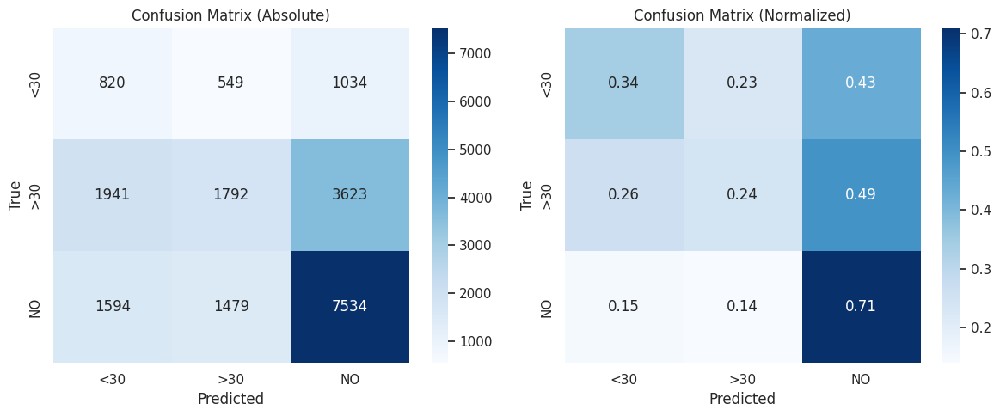

In [ ]:
y_pred_train = model_abl.predict(X_train_abl)
y_pred_test = model_abl.predict(X_test_abl)

print_classification_metrics(y_train, y_pred_train, label="Training set")
print_classification_metrics(y_test, y_pred_test, label="Test set")


In [ ]:
cv_results = evaluate_cv_model(X_train_abl, y_train,model=model_abl, cv=5)

Cross-Validation Results (5-fold):
Accuracy: 0.5046 ± 0.0088
Precision Weighted: 0.5190 ± 0.0137
Recall Weighted: 0.5046 ± 0.0088
F1 Weighted: 0.4933 ± 0.0198


In [ ]:
bootstrap_evaluation(model=model_abl, X=X_test_abl, y=y_test, label_encoder=le, n_iterations=100)


Bootstrap Results (100 iterations):
Accuracy: 0.4978 (95% CI: 0.4903 - 0.5047)
F1-score (weighted): 0.4883 (95% CI: 0.4799 - 0.4970)
Recall <30: 0.3416 (95% CI: 0.3249 - 0.3579)
Recall >30: 0.2432 (95% CI: 0.2347 - 0.2550)
Recall NO: 0.7097 (95% CI: 0.7007 - 0.7184)


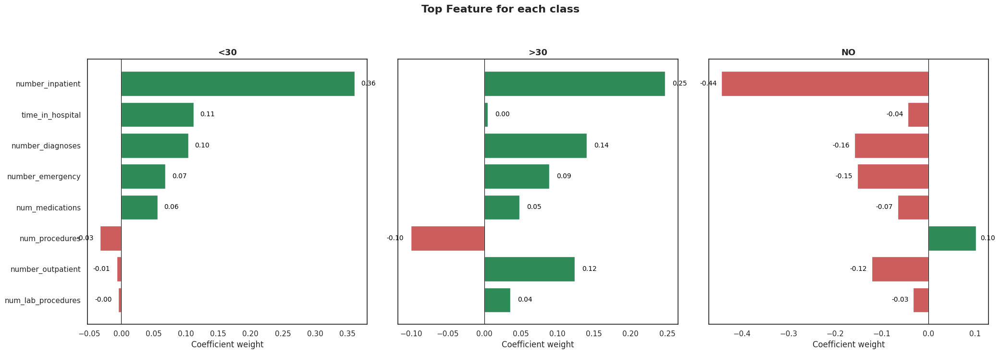

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

coefficienti_df = pd.DataFrame()

for i, estimator in enumerate(model_abl.estimators_):
    class_label = model_abl.classes_[i]
    coeffs = estimator.coef_[0]
    coefficienti_df[f'Classe {class_label}'] = pd.Series(coeffs, index=X_train_abl.columns)

coefficienti_df = coefficienti_df.T


import matplotlib.pyplot as plt
import pandas as pd

def plot_top_features_matplotlib(df, top_n=10, class_names=None):
    n_classi = len(df)
    fig, axs = plt.subplots(1, n_classi, figsize=(7 * n_classi, 7), sharey=True)

    if class_names is None:
        class_names = df.index.tolist()

    for i, (class_name, row) in enumerate(df.iterrows()):
        top_features = row.abs().nlargest(top_n).index
        values = row.loc[top_features]

        colors = ['seagreen' if val > 0 else 'indianred' for val in values]

        ax = axs[i] if n_classi > 1 else axs
        bars = ax.barh(top_features, values, color=colors)
        ax.set_title(f"{class_names[i]}", fontsize=13, weight='bold')
        ax.axvline(0, color='black', linewidth=0.8)
        ax.set_xlabel("Coefficient weight")
        ax.invert_yaxis()

        # Aggiungi etichette numeriche accanto alle barre
        for bar in bars:
            width = bar.get_width()
            ax.text(
                x=width + 0.01 if width > 0 else width - 0.01,
                y=bar.get_y() + bar.get_height() / 2,
                s=f"{width:.2f}",
                va='center',
                ha='left' if width > 0 else 'right',
                fontsize=10,
                color='black'
            )

    plt.suptitle("Top Feature for each class", fontsize=16, weight='bold', y=1.05)
    plt.tight_layout()
    plt.show()

plot_top_features_matplotlib(coefficienti_df, top_n=10, class_names=['<30', '>30', 'NO'])




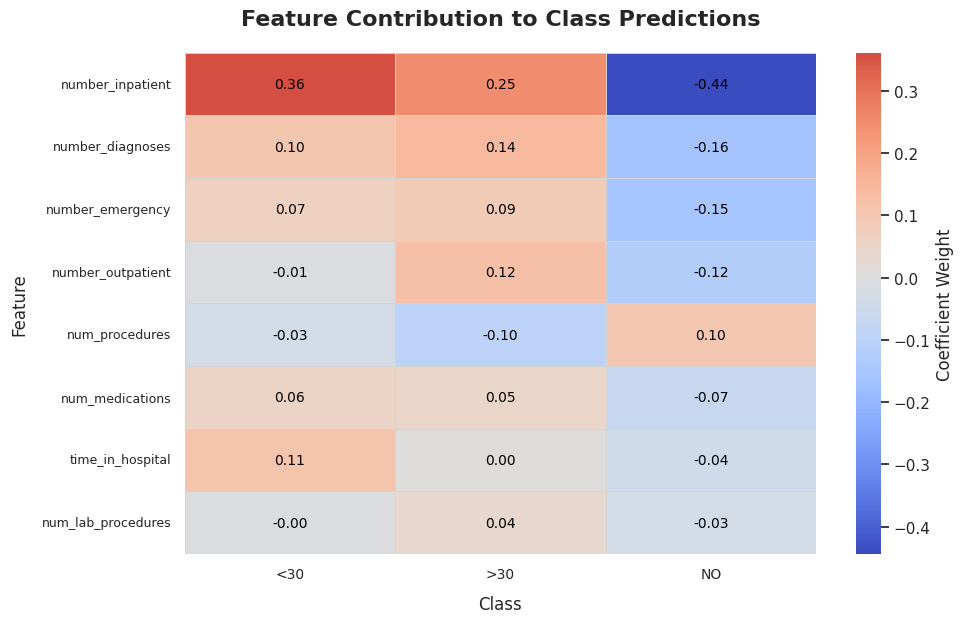

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Map class labels to human-readable form
label_map = {
    'Classe 0': '<30',
    'Classe 1': '>30',
    'Classe 2': 'NO'
}

# Rename index for class labels
coefficienti_df_labeled = coefficienti_df.copy()
coefficienti_df_labeled.index = coefficienti_df_labeled.index.map(label_map)

# Transpose so features are rows, classes are columns
heatmap_data = coefficienti_df_labeled.T

# Sort features by average absolute importance
mean_abs_importance = heatmap_data.abs().mean(axis=1)
sorted_features = mean_abs_importance.sort_values(ascending=False).index
heatmap_data = heatmap_data.loc[sorted_features]

# Create figure
plt.figure(figsize=(10, len(heatmap_data) * 0.8))
sns.set(style="white")

# Get values for dynamic text color
values = heatmap_data.values
text_colors = np.where(np.abs(values) > 0.5, 'white', 'black')  # you can tweak the threshold

# Draw base heatmap without text
ax = sns.heatmap(
    heatmap_data,
    cmap='coolwarm',
    center=0,
    annot=False,
    fmt=".2f",
    linewidths=0.4,
    linecolor='lightgray',
    cbar_kws={'label': 'Coefficient Weight'}
)

# Add custom annotations with dynamic text color
for y in range(values.shape[0]):
    for x in range(values.shape[1]):
        ax.text(
            x + 0.5,
            y + 0.5,
            f"{values[y, x]:.2f}",
            ha='center',
            va='center',
            color=text_colors[y, x],
            fontsize=10
        )

# Set English labels and title
plt.title("Feature Contribution to Class Predictions", fontsize=16, weight='bold', pad=20)
plt.xlabel("Class", fontsize=12, labelpad=10)
plt.ylabel("Feature", fontsize=12, labelpad=10)
plt.xticks(rotation=0, fontsize=10)
plt.yticks(rotation=0, fontsize=9)

plt.tight_layout()
plt.show()


Fitting SHAP LinearExplainer per binary classifier...
Explaining class 0...
Explaining class 1...
Explaining class 2...

Correct Prediction Explanation for Index 0


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


Predicted class: NO
True class: NO
Prediction probabilities: [0.3029938  0.33975593 0.35725027]
Force plot for class: <30


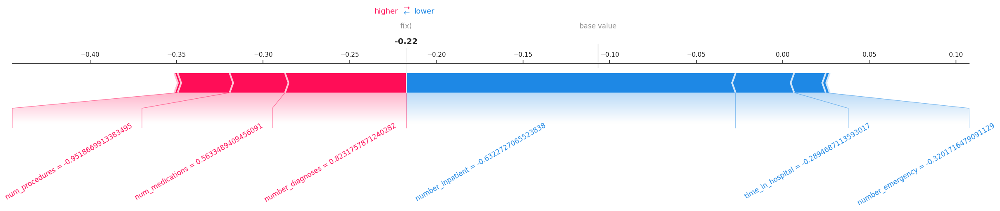

Force plot for class: >30


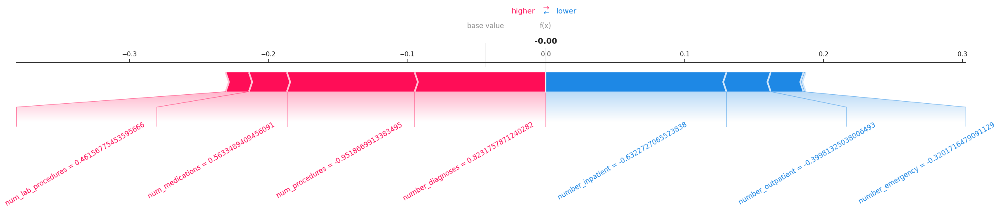

Force plot for class: NO


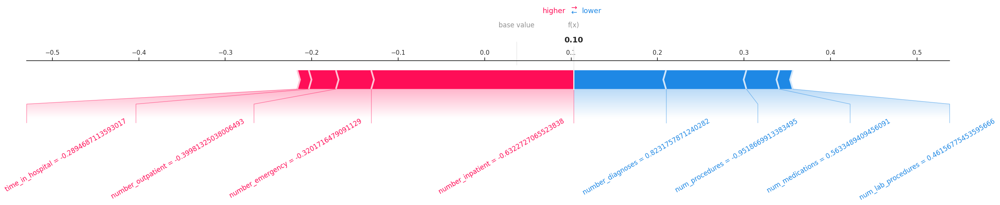


Incorrect Prediction Explanation for Index 3


Predicted class: <30
True class: NO
Prediction probabilities: [0.41202654 0.3764828  0.21149066]
Force plot for class: <30


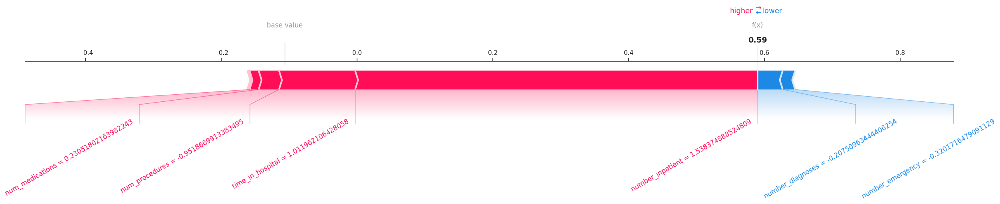

Force plot for class: >30


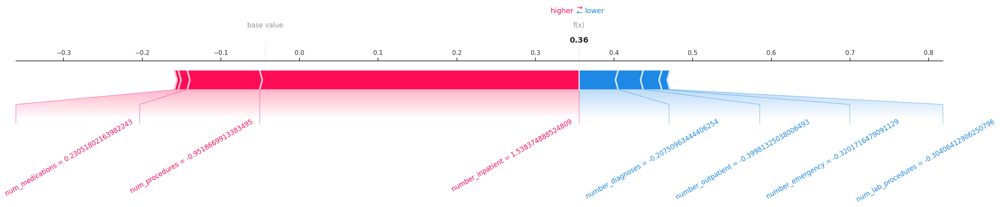

Force plot for class: NO


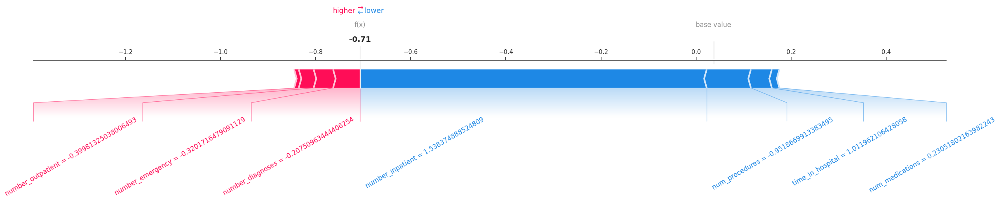

In [ ]:
shap_linear_analysis_ovr(
    model=model_abl,
    X_test=X_test_abl,
    y_test=y_test,
    label_encoder=le,  # optional
    #class_names=['<30', '>30', 'NO'],
    sample_size=100,
    random_state=42

)